# Problem Formulation

- We want to understand which variables increase the market value per player
- We want to be able to make predictions on the market value per player
- Ww want to indetify over/under performing players based on their market value

# 1. Loading the Raw Data

In [98]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import pickle
import plotly.express as px
import streamlit as st

In [106]:
# loading csv
player_raw = pd.read_csv("Player_Stats.csv", encoding="latin1", sep=';')
# Source: https://www.kaggle.com/datasets/vivovinco/20222023-football-player-stats

In [107]:
player_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2689 entries, 0 to 2688
Columns: 124 entries, Rk to AerWon%
dtypes: float64(112), int64(7), object(5)
memory usage: 2.5+ MB


In [108]:
player_raw.head()

,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
0,1,Brenden Aaronson,USA,MFFW,Leeds United,Premier League,22,2000,20,19,1596,17.7,1,1.53,0.28,18.5,0.04,0.20,19.0,0.11,0.0,0.0,23.2,31.0,74.9,293.0,85.7,13.3,16.2,81.9,5.93,7.74,76.6,0.90,2.37,38.1,0.11,1.75,1.75,0.45,0.11,3.22,31.0,28.1,2.88,0.96,0.17,0.00,2.54,0.23,1.47,0.68,0.62,0.06,23.2,0.00,0.85,3.62,2.37,0.56,0.23,0.11,0.28,0.06,0.28,0.17,0.0,0.0,0.06,0.0,0.06,1.64,0.51,0.45,0.90,0.28,0.51,1.47,34.6,0.96,1.69,0.11,1.58,0.06,1.69,0.28,0.06,44.0,0.40,4.35,19.0,21.50,2.49,44.0,3.73,1.19,31.8,1.75,47.0,26.7,136.1,56.6,1.53,1.07,0.40,2.60,3.11,30.2,5.65,0.11,0.0,0.0,0.62,2.26,0.17,2.54,0.51,0.0,0.0,0.00,4.86,0.34,1.19,22.2
1,2,Yunis Abdelhamid,MAR,DF,Reims,Ligue 1,35,1987,22,22,1980,22.0,0,0.86,0.05,5.3,0.00,0.00,13.5,0.00,0.0,0.0,38.5,47.2,81.5,751.5,318.5,10.9,12.9,84.5,23.20,25.70,90.1,3.77,7.00,53.9,0.05,0.27,2.91,0.09,0.00,4.50,47.2,43.3,3.73,3.32,0.00,0.55,0.18,0.09,0.00,0.00,0.00,0.00,38.5,0.23,0.59,1.14,0.86,0.00,0.00,0.18,0.00,0.09,0.18,0.14,0.0,0.0,0.05,0.0,0.00,2.50,1.59,1.45,1.00,0.05,1.32,1.68,78.4,0.36,2.23,0.77,1.45,2.00,4.50,2.91,0.05,59.2,6.23,27.50,29.5,2.73,1.09,59.2,0.68,0.32,46.7,0.36,53.3,40.0,234.2,125.0,0.55,0.23,0.09,0.73,0.68,34.5,0.23,0.09,0.0,0.0,1.32,0.50,0.05,0.18,1.59,0.0,0.0,0.00,6.64,2.18,1.23,64.0
2,3,Himad Abdelli,FRA,MFFW,Angers,Ligue 1,23,1999,14,8,770,8.6,0,1.05,0.35,33.3,0.00,0.00,19.2,0.00,0.0,0.0,40.0,49.5,80.8,676.0,188.1,18.5,22.0,84.1,15.50,18.70,82.6,4.42,5.93,74.5,0.00,1.51,3.95,1.74,0.35,6.40,49.5,48.1,1.16,0.35,0.12,0.23,1.05,0.81,0.00,0.00,0.00,0.00,40.0,0.23,1.16,2.67,2.44,0.00,0.00,0.12,0.00,0.12,0.00,0.00,0.0,0.0,0.00,0.0,0.00,2.91,1.40,1.28,1.40,0.23,1.63,2.67,60.9,1.05,1.51,0.12,1.40,0.93,3.84,0.93,0.00,62.6,0.93,11.40,36.0,17.40,1.16,62.6,3.84,2.09,54.5,1.51,39.4,48.5,298.5,151.0,2.56,2.56,0.47,2.09,1.05,43.4,5.93,0.12,0.0,0.0,1.74,1.28,0.00,1.05,1.40,0.0,0.0,0.00,8.14,0.93,1.05,47.1
3,4,Salis Abdul Samed,GHA,MF,Lens,Ligue 1,22,2000,20,20,1799,20.0,1,0.60,0.15,25.0,0.08,0.33,20.3,0.00,0.0,0.0,59.5,64.9,91.6,946.3,226.9,29.6,31.8,93.2,24.70,26.20,94.3,3.35,4.30,77.9,0.00,0.50,6.00,0.55,0.10,5.60,64.9,63.1,1.40,1.30,0.05,0.20,0.35,0.10,0.00,0.00,0.00,0.00,59.5,0.35,0.40,1.60,1.35,0.00,0.10,0.10,0.00,0.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,1.50,0.80,0.55,0.85,0.10,0.85,1.30,65.4,0.45,1.30,0.35,0.95,1.10,2.60,0.80,0.00,73.3,2.10,12.00,49.6,12.20,0.70,73.3,1.25,0.70,56.0,0.40,32.0,61.0,316.9,117.5,1.25,1.95,0.15,1.35,1.30,56.5,1.70,0.15,0.0,0.0,2.45,1.35,0.00,0.35,0.80,0.0,0.0,0.05,6.60,0.50,0.50,50.0
4,5,Laurent Abergel,FRA,MF,Lorient,Ligue 1,30,1993,15,15,1165,12.9,0,0.31,0.00,0.0,0.00,0.00,23.9,0.00,0.0,0.0,37.9,43.4,87.3,613.6,224.7,17.9,19.4,92.4,15.70,17.80,88.6,2.64,3.95,66.7,0.08,0.62,3.88,0.39,0.00,5.04,43.4,42.6,0.78,0.78,0.39,0.16,0.23,0.00,0.00,0.00,0.00,0.00,37.9,0.08,0.31,1.24,1.01,0.08,0.00,0.08,0.00,0.08,0.08,0.08,0.0,0.0,0.00,0.0,0.00,3.80,2.02,2.64,1.16,0.00,1.32,3.26,40.5,1.94,1.40,0.23,1.16,1.16,4.96,1.55,0.00,54.7,3.26,19.20,31.4,4.88,0.23,54.7,0.93,0.54,58.3,0.31,33.3,41.0,174.3,72.7,0.47,0.93,0.00,1.32,0.78,36.4,0.47,0.16,0.0,0.0,0.93,1.01,0.00,0.23,2.02,0.0,0.0,0.00,6.51,0.31,0.39,44.4


# Pulling the Market Value

In [113]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time

# Your list of player names
player_list = player_raw['Player'].unique()

base_url = "https://www.transfermarkt.com/schnellsuche/ergebnis/schnellsuche?query="

# DataFrame to store results
results = []

# Total number of players
total_players = len(player_list)

# iterate through the player list with a counter
for i, player in enumerate(player_list, start=1):
    #Format the player name for the url
    search_url = base_url + player.replace(" ", "+")
    print(f"processing player {i}/{total_players}: {player}")
    
    try:
        #Fetch the page
        response = requests.get(search_url, headers={"User-Agent": "Mozilla/5.0"})
        response.raise_for_status()
        soup = BeautifulSoup(resoınse.text, "html.parser")
        
        #Extract the market value
        market_value_tag = soup.find("td", class_="rechts hauptlink") # target the spesific calss
        if market_value_tag:
            market_value = market_value_tag.text.strip()
        else:
            market_value = "Not Found"
        
        #Append the result
        results.append({"Player": player, "Market Value": market_value})
    except Exception as e:
        results.append({"Player":player, "Market Value": "Error:" + str(e)})
        
    #pause to avoid being blocked by the website
    time.sleep(2)
    
#Conver results to DataFrame
df_results = pd.DataFrame(results)

#Display or save the DataFrame
print(df_results)
df_results.to_csv("player_market_values.csv",index=False)

#Website: https://www.transfermarkt.com/

processing player 1/2530: Brenden Aaronson
processing player 2/2530: Yunis Abdelhamid
processing player 3/2530: Himad Abdelli
processing player 4/2530: Salis Abdul Samed
processing player 5/2530: Laurent Abergel
processing player 6/2530: Oliver Abildgaard
processing player 7/2530: Matthis Abline
processing player 8/2530: Abner
processing player 9/2530: Zakaria Aboukhlal
processing player 10/2530: Tammy Abraham
processing player 11/2530: Francesco Acerbi
processing player 12/2530: Mohamed Achi
processing player 13/2530: Marcos Acuña
processing player 14/2530: Che Adams
processing player 15/2530: Tyler Adams
processing player 16/2530: Sargis Adamyan
processing player 17/2530: Tosin Adarabioyo
processing player 18/2530: Martin Adeline
processing player 19/2530: Karim Adeyemi
processing player 20/2530: Amine Adli
processing player 21/2530: Yacine Adli
processing player 22/2530: Michel Aebischer
processing player 23/2530: Felix Afena-Gyan
processing player 24/2530: Emmanuel Agbadou
processi

processing player 196/2530: Mickaël Barreto
processing player 197/2530: Pablo Barrios
processing player 198/2530: Musa Barrow
processing player 199/2530: Federico Baschirotto
processing player 200/2530: Toma Bai?
processing player 201/2530: Gil Bastião Dias
processing player 202/2530: Alessandro Bastoni
processing player 203/2530: Simone Bastoni
processing player 204/2530: Rodrigo Battaglia
processing player 205/2530: Maximilian Bauer
processing player 206/2530: Oliver Baumann
processing player 207/2530: Timo Baumgartl
processing player 208/2530: Julian Baumgartlinger
processing player 209/2530: Christoph Baumgartner
processing player 210/2530: Cyrille Bayala
processing player 211/2530: Brian Bayeye
processing player 212/2530: Noah Joel Sarenren Bazee
processing player 213/2530: Gavin Bazunu
processing player 214/2530: Bebé
processing player 215/2530: Ihlas Bebou
processing player 216/2530: Rodrigo Becão
processing player 217/2530: Mads Bech Sørensen
processing player 218/2530: Julius

processing player 387/2530: Dominic Calvert-Lewin
processing player 388/2530: Mahdi Camara
processing player 389/2530: Mohamed Camara
processing player 390/2530: Ousmane Camara
processing player 391/2530: Eduardo Camavinga
processing player 392/2530: Nicolò Cambiaghi
processing player 393/2530: Andrea Cambiaso
processing player 394/2530: Axel Camblan
processing player 395/2530: Sergio Camello
processing player 396/2530: Chem Campbell
processing player 397/2530: Emre Can
processing player 398/2530: Sergio Canales
processing player 399/2530: Matteo Cancellieri
processing player 400/2530: João Cancelo
processing player 401/2530: Antonio Candreva
processing player 402/2530: Thomas Cannon
processing player 403/2530: Sergi Canós
processing player 404/2530: Ander Capa
processing player 405/2530: Pierrick Capelle
processing player 406/2530: Étienne Capoue
processing player 407/2530: Gianluca Caprari
processing player 408/2530: Francesco Caputo
processing player 409/2530: Maxence Caqueret
proce

processing player 579/2530: Tom Davies
processing player 580/2530: Pawe? Dawidowicz
processing player 581/2530: Craig Dawson
processing player 582/2530: Kevin De Bruyne
processing player 583/2530: Charles De Ketelaere
processing player 584/2530: Manuel De Luca
processing player 585/2530: Rodrigo De Paul
processing player 586/2530: Mattia De Sciglio
processing player 587/2530: Lorenzo De Silvestri
processing player 588/2530: Thibault De Smet
processing player 589/2530: Koni De Winter
processing player 590/2530: Grégoire Defrel
processing player 591/2530: Duccio Degli Innocenti
processing player 592/2530: Brecht Dejaegere
processing player 593/2530: Romain Del Castillo
processing player 594/2530: Alberto Del Moral
processing player 595/2530: Thomas Delaine
processing player 596/2530: Thomas Delaney
processing player 597/2530: Sacha Delaye
processing player 598/2530: Fran Delgado
processing player 599/2530: Andy Delort
processing player 600/2530: Karamoko Dembele
processing player 601/253

processing player 771/2530: Nicolò Fagioli
processing player 772/2530: Ralf Fährmann
processing player 773/2530: Romain Faivre
processing player 774/2530: Radamel Falcao
processing player 775/2530: Wladimiro Falcone
processing player 776/2530: Fali
processing player 777/2530: Mamadou Fall
processing player 778/2530: Davide Faraoni
processing player 779/2530: Ansu Fati
processing player 780/2530: Khalil Fayad
processing player 781/2530: Cheikh Faye
processing player 782/2530: Federico Fazio
processing player 783/2530: Jacopo Fazzini
processing player 784/2530: Zouhair Feddal
processing player 785/2530: Nabil Fekir
processing player 786/2530: Felipe
processing player 787/2530: Luiz Felipe
processing player 788/2530: João Félix
processing player 789/2530: Ohis Felix Uduokhai
processing player 790/2530: Kiko Femenía
processing player 791/2530: Evan Ferguson
processing player 792/2530: Lewis Ferguson
processing player 793/2530: Bruno Fernandes
processing player 794/2530: Edimilson Fernandes

processing player 965/2530: Sergi Guardiola
processing player 966/2530: Nemanja Gudelj
processing player 967/2530: Gabriel Gudmundsson
processing player 968/2530: Gonçalo Guedes
processing player 969/2530: Axel Gueguin
processing player 970/2530: Marc Guéhi
processing player 971/2530: Mattéo Guendouzi
processing player 972/2530: Raphaël Guerreiro
processing player 973/2530: Evann Guessand
processing player 974/2530: Ander Guevara
processing player 975/2530: Pape Gueye
processing player 976/2530: Josuha Guilavogui
processing player 977/2530: Frederic Guilbert
processing player 978/2530: Hugo Guillamón
processing player 979/2530: Bruno Guimarães
processing player 980/2530: Sehrou Guirassy
processing player 981/2530: Rafik Guitane
processing player 982/2530: Péter Gulácsi
processing player 983/2530: Manuel Gulde
processing player 984/2530: Gerard Gumbau
processing player 985/2530: Robert Gumny
processing player 986/2530: Ýlkay Gündoðan
processing player 987/2530: Christian Günter
processi

processing player 1157/2530: Stevan Joveti?
processing player 1158/2530: Luka Jovi?
processing player 1159/2530: Juanmi
processing player 1160/2530: Juanpe
processing player 1161/2530: Jubal
processing player 1162/2530: Christopher Jullien
processing player 1163/2530: Anthony Jung
processing player 1164/2530: Lago Junior
processing player 1165/2530: Hamed Junior Traorè
processing player 1166/2530: Vinicius Júnior
processing player 1167/2530: Josip Juranovi?
processing player 1168/2530: James Justin
processing player 1169/2530: Mathias Jørgensen
processing player 1170/2530: Ozan Kabak
processing player 1171/2530: Issa Kaboré
processing player 1172/2530: Abdoul Kader Bamba
processing player 1173/2530: Pavel Kade?ábek
processing player 1174/2530: Tino Kadewere
processing player 1175/2530: Kaiky
processing player 1176/2530: Florian Kainz
processing player 1177/2530: Gaël Kakuta
processing player 1178/2530: Sasa Kalajdzic
processing player 1179/2530: Arnaud Kalimuendo
processing player 1180

processing player 1347/2530: Jefferson Lerma
processing player 1348/2530: Benjamin Leroy
processing player 1349/2530: Léo Leroy
processing player 1350/2530: Ruan Levine
processing player 1351/2530: Robert Lewandowski
processing player 1352/2530: Jamie Leweling
processing player 1353/2530: Jamal Lewis
processing player 1354/2530: Rico Lewis
processing player 1355/2530: Keane Lewis-Potter
processing player 1356/2530: Dimitri Liénard
processing player 1357/2530: Philipp Lienhart
processing player 1358/2530: Matthijs de Ligt
processing player 1359/2530: Victor Lindelöf
processing player 1360/2530: Jesper Lindstrøm
processing player 1361/2530: Karol Linetty
processing player 1362/2530: Jesse Lingard
processing player 1363/2530: Pol Lirola
processing player 1364/2530: Mateusz Lis
processing player 1365/2530: Marcin Listkowski
processing player 1366/2530: Dejan Ljubicic
processing player 1367/2530: Javier Llabrés
processing player 1368/2530: Diego Llorente
processing player 1369/2530: Marcos 

processing player 1535/2530: Dwight McNeil
processing player 1536/2530: Scott McTominay
processing player 1537/2530: Gary Medel
processing player 1538/2530: Facundo Medina
processing player 1539/2530: Ben Mee
processing player 1540/2530: Bamo Meïté
processing player 1541/2530: Soualiho Meïté
processing player 1542/2530: Farid El Melali
processing player 1543/2530: Gonzalo Melero
processing player 1544/2530: Birger Meling
processing player 1545/2530: Memphis
processing player 1546/2530: Houboulang Mendes
processing player 1547/2530: Nuno Mendes
processing player 1548/2530: Thiago Mendes
processing player 1549/2530: Brais Méndez
processing player 1550/2530: Diego Méndez
processing player 1551/2530: Antoine Mendy
processing player 1552/2530: Arial Mendy
processing player 1553/2530: Batista Mendy
processing player 1554/2530: Edouard Mendy
processing player 1555/2530: Ferland Mendy
processing player 1556/2530: Nampalys Mendy
processing player 1557/2530: Gideon Mensah
processing player 1558/

processing player 1725/2530: Guillermo Ochoa
processing player 1726/2530: Wilson Odobert
processing player 1727/2530: Tim Oermann
processing player 1728/2530: Angelo Ogbonna
processing player 1729/2530: Florent Ogier
processing player 1730/2530: David Okereke
processing player 1731/2530: Caleb Okoli
processing player 1732/2530: Olasagasti
processing player 1733/2530: Lucas Olaza
processing player 1734/2530: Finn Ole Becker
processing player 1735/2530: Mathias Olesen
processing player 1736/2530: Michael Olise
processing player 1737/2530: Brian Oliván
processing player 1738/2530: Lucas Oliveira Rosa
processing player 1739/2530: Mathías Olivera
processing player 1740/2530: Dani Olmo
processing player 1741/2530: Robin Olsen
processing player 1742/2530: Warmed Omari
processing player 1743/2530: Jonas Omlin
processing player 1744/2530: Ado Onaiwu
processing player 1745/2530: Amadou Onana
processing player 1746/2530: André Onana
processing player 1747/2530: Jean Onana
processing player 1748/2

processing player 1914/2530: Domingos Quina
processing player 1915/2530: Adrien Rabiot
processing player 1916/2530: Nemanja Radonji?
processing player 1917/2530: Ivan Radovanovi?
processing player 1918/2530: Ionu? Radu
processing player 1919/2530: Antonio Raillo
processing player 1920/2530: Predrag Rajkovi?
processing player 1921/2530: Ivan Rakiti?
processing player 1922/2530: Diant Ramaj
processing player 1923/2530: Largie Ramazani
processing player 1924/2530: Adil Rami
processing player 1925/2530: Chris Ramos
processing player 1926/2530: Sergio Ramos
processing player 1927/2530: Aaron Ramsdale
processing player 1928/2530: Aaron Ramsey
processing player 1929/2530: Jacob Ramsey
processing player 1930/2530: Luca Ranieri
processing player 1931/2530: Andrea Ranocchia
processing player 1932/2530: Filippo Ranocchia
processing player 1933/2530: Lilian Raolisoa
processing player 1934/2530: Raphinha
processing player 1935/2530: Nicolai Rapp
processing player 1936/2530: Elba Rashani
processing 

processing player 2105/2530: Keven Schlotterbeck
processing player 2106/2530: Nico Schlotterbeck
processing player 2107/2530: Jeffrey Schlupp
processing player 2108/2530: Kasper Schmeichel
processing player 2109/2530: Romano Schmid
processing player 2110/2530: Niklas Schmidt
processing player 2111/2530: Benno Schmitz
processing player 2112/2530: Jerdy Schouten
processing player 2113/2530: Perr Schuurs
processing player 2114/2530: Marvin Schwäbe
processing player 2115/2530: Alexander Schwolow
processing player 2116/2530: Demba Seck
processing player 2117/2530: Haris Seferovi?
processing player 2118/2530: Jacopo Segre
processing player 2119/2530: Paul Seguin
processing player 2120/2530: Alidu Seidu
processing player 2121/2530: Davie Selke
processing player 2122/2530: Matz Sels
processing player 2123/2530: Nélson Semedo
processing player 2124/2530: Vivaldo Semedo
processing player 2125/2530: Antoine Semenyo
processing player 2126/2530: Marvin Senaya
processing player 2127/2530: Marcos Sen

processing player 2293/2530: Khéphren Thuram-Ulie
processing player 2294/2530: Alexis Tibidi
processing player 2295/2530: Youri Tielemans
processing player 2296/2530: Kieran Tierney
processing player 2297/2530: Steffen Tigges
processing player 2298/2530: Jean-Clair Todibo
processing player 2299/2530: Harry Toffolo
processing player 2300/2530: Umut Tohumcu
processing player 2301/2530: Karl Toko Ekambi
processing player 2302/2530: Corentin Tolisso
processing player 2303/2530: Jeremy Toljan
processing player 2304/2530: Rafael Tolói
processing player 2305/2530: Raúl de Tomás
processing player 2306/2530: Tiago Tomás
processing player 2307/2530: Takehiro Tomiyasu
processing player 2308/2530: James Tomkins
processing player 2309/2530: Fikayo Tomori
processing player 2310/2530: Sandro Tonali
processing player 2311/2530: Ivan Toney
processing player 2312/2530: Pablo Torre
processing player 2313/2530: David Torres
processing player 2314/2530: Ferrán Torres
processing player 2315/2530: Óliver Tor

processing player 2483/2530: Gerard Yepes
processing player 2484/2530: Darlin Yongwa
processing player 2485/2530: Leny Yoro
processing player 2486/2530: Maya Yoshida
processing player 2487/2530: Ashley Young
processing player 2488/2530: Mohamed Youssouf
processing player 2489/2530: Mattia Zaccagni
processing player 2490/2530: Dan-Axel Zagadou
processing player 2491/2530: Wilfried Zaha
processing player 2492/2530: Warren Zaire-Emery
processing player 2493/2530: Denis Zakaria
processing player 2494/2530: Rodrigo Zalazar
processing player 2495/2530: Joseba Zaldúa
processing player 2496/2530: Nicola Zalewski
processing player 2497/2530: Andre-Frank Zambo Anguissa
processing player 2498/2530: Oliver Zandén
processing player 2499/2530: Luca Zanimacchia
processing player 2500/2530: Nicolò Zaniolo
processing player 2501/2530: Alessandro Zanoli
processing player 2502/2530: Duván Zapata
processing player 2503/2530: Davide Zappacosta
processing player 2504/2530: Oier Zarraga
processing player 250

# 3. Cleaning & Joining Market Value

In [115]:
# Loading the data back in
df_results_2 = pd.read_csv("player_market_values.csv")

# Removing the data that we could not pull Market Value
df_results_2 = df_results_2[df_results_2['Market Value'] != 'Not Found']
df_results_2 = df_results_2[df_results_2['Market Value'] != '-']

# Converting the Ks and Ms to actual Numbers

# Conversion function
def convert_market_value(value):
    value = value.replace("€", "").replace(",", "").strip()  # Remove currency symbol and commas
    if "m" in value:
        return float(value.replace("m", "")) * 1_000_000  # Convert millions to numeric
    elif "k" in value:
        return float(value.replace("k", "")) * 1_000  # Convert thousands to numeric
    else:
        return float(value)  # Return the number as-is if no unit

# Apply the conversion
df_results_2["Market Value Euros"] = df_results_2["Market Value"].apply(convert_market_value)

# Joining the Market Value to the Main DF
print(player_raw.shape)
player_raw = player_raw.merge(df_results_2, how = 'left', on = 'Player')
print(player_raw.shape)

# filtering out players that we don't have market value
player_raw = player_raw[~player_raw['Market Value Euros'].isna()]
print(player_raw.shape)
player_raw.head()

(2689, 124)
(2689, 126)
(2496, 126)


,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%,Market Value,Market Value Euros
0,1,Brenden Aaronson,USA,MFFW,Leeds United,Premier League,22,2000,20,19,1596,17.7,1,1.53,0.28,18.5,0.04,0.20,19.0,0.11,0.0,0.0,23.2,31.0,74.9,293.0,85.7,13.3,16.2,81.9,5.93,7.74,76.6,0.90,2.37,38.1,0.11,1.75,1.75,0.45,0.11,3.22,31.0,28.1,2.88,0.96,0.17,0.00,2.54,0.23,1.47,0.68,0.62,0.06,23.2,0.00,0.85,3.62,2.37,0.56,0.23,0.11,0.28,0.06,0.28,0.17,0.0,0.0,0.06,0.0,0.06,1.64,0.51,0.45,0.90,0.28,0.51,1.47,34.6,0.96,1.69,0.11,1.58,0.06,1.69,0.28,0.06,44.0,0.40,4.35,19.0,21.50,2.49,44.0,3.73,1.19,31.8,1.75,47.0,26.7,136.1,56.6,1.53,1.07,0.40,2.60,3.11,30.2,5.65,0.11,0.0,0.0,0.62,2.26,0.17,2.54,0.51,0.0,0.0,0.00,4.86,0.34,1.19,22.2,€11.00m,11000000.0
1,2,Yunis Abdelhamid,MAR,DF,Reims,Ligue 1,35,1987,22,22,1980,22.0,0,0.86,0.05,5.3,0.00,0.00,13.5,0.00,0.0,0.0,38.5,47.2,81.5,751.5,318.5,10.9,12.9,84.5,23.20,25.70,90.1,3.77,7.00,53.9,0.05,0.27,2.91,0.09,0.00,4.50,47.2,43.3,3.73,3.32,0.00,0.55,0.18,0.09,0.00,0.00,0.00,0.00,38.5,0.23,0.59,1.14,0.86,0.00,0.00,0.18,0.00,0.09,0.18,0.14,0.0,0.0,0.05,0.0,0.00,2.50,1.59,1.45,1.00,0.05,1.32,1.68,78.4,0.36,2.23,0.77,1.45,2.00,4.50,2.91,0.05,59.2,6.23,27.50,29.5,2.73,1.09,59.2,0.68,0.32,46.7,0.36,53.3,40.0,234.2,125.0,0.55,0.23,0.09,0.73,0.68,34.5,0.23,0.09,0.0,0.0,1.32,0.50,0.05,0.18,1.59,0.0,0.0,0.00,6.64,2.18,1.23,64.0,€600k,600000.0
2,3,Himad Abdelli,FRA,MFFW,Angers,Ligue 1,23,1999,14,8,770,8.6,0,1.05,0.35,33.3,0.00,0.00,19.2,0.00,0.0,0.0,40.0,49.5,80.8,676.0,188.1,18.5,22.0,84.1,15.50,18.70,82.6,4.42,5.93,74.5,0.00,1.51,3.95,1.74,0.35,6.40,49.5,48.1,1.16,0.35,0.12,0.23,1.05,0.81,0.00,0.00,0.00,0.00,40.0,0.23,1.16,2.67,2.44,0.00,0.00,0.12,0.00,0.12,0.00,0.00,0.0,0.0,0.00,0.0,0.00,2.91,1.40,1.28,1.40,0.23,1.63,2.67,60.9,1.05,1.51,0.12,1.40,0.93,3.84,0.93,0.00,62.6,0.93,11.40,36.0,17.40,1.16,62.6,3.84,2.09,54.5,1.51,39.4,48.5,298.5,151.0,2.56,2.56,0.47,2.09,1.05,43.4,5.93,0.12,0.0,0.0,1.74,1.28,0.00,1.05,1.40,0.0,0.0,0.00,8.14,0.93,1.05,47.1,€4.00m,4000000.0
3,4,Salis Abdul Samed,GHA,MF,Lens,Ligue 1,22,2000,20,20,1799,20.0,1,0.60,0.15,25.0,0.08,0.33,20.3,0.00,0.0,0.0,59.5,64.9,91.6,946.3,226.9,29.6,31.8,93.2,24.70,26.20,94.3,3.35,4.30,77.9,0.00,0.50,6.00,0.55,0.10,5.60,64.9,63.1,1.40,1.30,0.05,0.20,0.35,0.10,0.00,0.00,0.00,0.00,59.5,0.35,0.40,1.60,1.35,0.00,0.10,0.10,0.00,0.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,1.50,0.80,0.55,0.85,0.10,0.85,1.30,65.4,0.45,1.30,0.35,0.95,1.10,2.60,0.80,0.00,73.3,2.10,12.00,49.6,12.20,0.70,73.3,1.25,0.70,56.0,0.40,32.0,61.0,316.9,117.5,1.25,1.95,0.15,1.35,1.30,56.5,1.70,0.15,0.0,0.0,2.45,1.35,0.00,0.35,0.80,0.0,0.0,0.05,6.60,0.50,0.50,50.0,€8.00m,8000000.0
4,5,Laurent Abergel,FRA,MF,Lorient,Ligue 1,30,1993,15,15,1165,12.9,0,0.31,0.00,0.0,0.00,0.00,23.9,0.00,0.0,0.0,37.9,43.4,87.3,613.6,224.7,17.9,19.4,92.4,15.70,17.80,88.6,2.64,3.95,66.7,0.08,0.62,3.88,0.39,0.00,5.04,43.4,42.6,0.78,0.78,0.39,0.16,0.23,0.00,0.00,0.00,0.00,0.00,37.9,0.08,0.31,1.24,1.01,0.08,0.00,0.08,0.00,0.08,0.08,0.08,0.0,0.0,0.00,0.0,0.00,3.80,2.02,2.64,1.16,0.00,1.32,3.26,40.5,1.94,1.40,0.23,1.16,1.16,4.96,1.55,0.00,54.7,3.26,19.20,31.4,4.88,0.23,54.7,0.93,0.54,58.3,0.31,33.3,41.0,174.3,72.7,0.47,0.93,0.

# 4. Data Pre-processing

In [116]:
# Investigate all the elements whithin each Feature 

for column in player_raw:
    unique_vals = np.unique(player_raw[column].fillna('0'))
    nr_values = len(unique_vals)
    if nr_values <= 12:
        print('The number of values for feature {} :{} -- {}'.format(column, nr_values,unique_vals))
    else:
        print('The number of values for feature {} :{}'.format(column, nr_values))

The number of values for feature Rk :2496
The number of values for feature Player :2343
The number of values for feature Nation :104
The number of values for feature Pos :10 -- ['DF' 'DFFW' 'DFMF' 'FW' 'FWDF' 'FWMF' 'GK' 'MF' 'MFDF' 'MFFW']
The number of values for feature Squad :98
The number of values for feature Comp :5 -- ['Bundesliga' 'La Liga' 'Ligue 1' 'Premier League' 'Serie A']
The number of values for feature Age :27
The number of values for feature Born :27
The number of values for feature MP :23
The number of values for feature Starts :24
The number of values for feature Min :1258
The number of values for feature 90s :218
The number of values for feature Goals :18
The number of values for feature Shots :372
The number of values for feature SoT :182
The number of values for feature SoT% :217
The number of values for feature G/Sh :41
The number of values for feature G/SoT :57
The number of values for feature ShoDist :280
The number of values for feature ShoFK :66
The number o

# 4.2. Dealing with missing values

In [117]:
# Checking for null values
player_raw.isnull().sum()

Rk                    0
Player                0
Nation                1
Pos                   0
Squad                 0
Comp                  0
Age                   0
Born                  0
MP                    0
Starts                0
Min                   0
90s                   0
Goals                 0
Shots                 0
SoT                   0
SoT%                  0
G/Sh                  0
G/SoT                 0
ShoDist               0
ShoFK                 0
ShoPK                 0
PKatt                 0
PasTotCmp             0
PasTotAtt             0
PasTotCmp%            0
PasTotDist            0
PasTotPrgDist         0
PasShoCmp             0
PasShoAtt             0
PasShoCmp%            0
PasMedCmp             0
PasMedAtt             0
PasMedCmp%            0
PasLonCmp             0
PasLonAtt             0
PasLonCmp%            0
Assists               0
PasAss                0
Pas3rd                0
PPA                   0
CrsPA                 0
PasProg         

In [118]:
# fixing the NA Value
player_raw['Nation'] = player_raw['Nation'].fillna('Other')

In [119]:
# Checking the players that are duplicates
player_raw[player_raw.duplicated('Player', keep=False) == True].head()

,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,Min,90s,Goals,Shots,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%,Market Value,Market Value Euros
6,7,Matthis Abline,FRA,FWMF,Auxerre,Ligue 1,19,2003,5,2,185,2.1,1,4.29,1.43,33.3,0.11,0.33,20.4,0.00,0.00,0.00,7.14,10.0,71.4,139.5,40.0,1.43,2.38,60.0,4.76,5.24,90.9,0.48,0.95,50.0,0.00,0.00,0.48,1.43,0.48,1.90,10.0,9.05,0.95,0.00,0.00,0.00,0.95,0.00,0.0,0.0,0.0,0.0,7.14,0.00,0.48,0.48,0.48,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,1.43,0.48,0.00,0.95,0.48,0.00,0.95,0.0,0.95,0.48,0.00,0.48,0.48,1.90,0.48,0.0,25.7,0.48,1.43,11.4,12.9,6.67,25.7,1.43,0.48,33.3,0.95,66.7,17.1,97.1,10.5,1.43,0.00,0.95,7.62,3.33,19.0,6.67,0.00,0.00,0.00,0.95,1.43,0.48,0.95,0.48,0.00,0.00,0.0,0.48,1.43,1.43,50.0,€9.00m,9000000.0
7,8,Matthis Abline,FRA,FWMF,Rennes,Ligue 1,19,2003,11,0,107,1.2,1,5.00,1.67,33.3,0.17,0.50,12.2,0.00,0.00,0.00,5.83,12.5,46.7,107.5,25.0,2.50,5.00,50.0,2.50,3.33,75.0,0.83,0.83,100.0,0.00,1.67,0.83,0.83,0.00,1.67,12.5,12.50,0.00,0.00,0.83,0.00,1.67,0.00,0.0,0.0,0.0,0.0,5.83,0.00,0.83,5.83,1.67,0.0,0.00,2.50,0.83,0.83,1.67,0.00,0.0,0.0,0.00,0.83,0.83,0.83,0.83,0.00,0.00,0.83,0.83,0.83,100.0,0.00,0.83,0.00,0.83,1.67,2.50,0.83,0.0,30.8,0.83,0.83,12.5,18.3,12.50,30.8,0.00,0.00,0.0,0.00,0.0,22.5,145.0,87.5,3.33,0.83,1.67,8.33,0.83,22.5,9.17,0.00,0.00,0.00,2.50,4.17,0.83,1.67,0.83,0.83,0.00,0.0,1.67,0.83,3.33,20.0,€9.00m,9000000.0
31,32,Naouirou Ahamada,FRA,MFFW,Crystal Palace,Premier League,20,2002,2,0,16,0.2,0,5.00,0.00,0.0,0.00,0.00,17.3,0.00,0.00,0.00,50.00,70.0,71.4,760.0,225.0,25.00,30.00,83.3,25.00,35.00,71.4,0.00,0.00,0.0,0.00,0.00,10.00,0.00,0.00,5.00,70.0,70.00,0.00,0.00,0.00,0.00,5.00,0.00,0.0,0.0,0.0,0.0,50.00,0.00,0.00,5.00,0.00,0.0,0.00,5.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,5.00,0.00,5.00,0.00,0.00,0.00,0.0,85.0,0.00,10.00,60.0,15.0,10.00,85.0,5.00,5.00,100.0,0.00,0.0,40.0,165.0,60.0,5.00,0.00,5.00,5.00,0.00,55.0,20.00,0.00,0.00,0.00,0.00,0.00,5.00,5.00,0.00,0.00,0.00,0.0,10.00,0.00,0.00,0.0,€8.00m,8000000.0
32,33,Naouirou Ahamada,FRA,MF,Stuttgart,Bundesliga,20,2002,17,17,1398,15.5,2,1.03,0.32,31.3,0.13,0.40,22.1,0.00,0.00,0.00,29.00,34.1,84.9,449.4,106.5,14.40,15.60,92.1,12.10,13.20,91.7,1.35,2.58,52.5,0.13,0.97,2.45,0.45,0.13,3.61,34.1,33.20,0.84,0.26,0.13,0.06,0.39,0.32,0.0,0.0,0.0,0.0,29.00,0.13,0.84,2.45,2.00,0.0,0.19,0.13,0.06,0.06,0.45,0.45,0.0,0.0,0.00,0.00,0.00,1.10,0.71,0.45,0.45,0.19,0.52,1.29,40.0,0.77,1.03,0.32,0.71,0.52,1.61,0.45,0.0,43.5,1.16,8.97,25.0,10.3,1.42,43.5,2.71,1.16,42.9,1.29,47.6,26.3,192.4,97.5,2.77,1.74,0.39,2.19,0.71,29.2,3.48,0.26,0.06,0.06,1.03,1.10,0.06,0.39,0.71,0.00,0.06,0.0,5.68,0.45,1.03,30.4,€8.00m,8000000.0
40,41,Ludovic Ajorque,FRA,FW,Strasbourg,Ligue 1,28,1994,13,9,771,8.6,1,2.56,0.81,31.8,0.00,0.00,15.1,0.12,0.12,0.12,20.70,29.7,69.8,304.0,46.2,12.00,15.90,75.2,6.40,9.19,69.6,1.28,1.86,68.8,0.00,1.16,1.16,0.70,0.00,1.51,29.7,28.10,1.16,0.12,0.35,0.35,0.00,0.00,0.0,0.0,0.0,0.0,20.70,0.35,0.12,2.56,2.33,0.0,0.00,0.23,0.00,0.00,0.23,0.12,0.0,0.0,0.12,0.00,0.00,0.58,0.47,0.12,0.47,0.00,0.35,1.05,33.3,0.70,0.35,0.12,0.23,0.23,0.81,0.81,0.0,39.1,0.93,3.60,20.0,15.8,5.81,39.0,0.47,0.23,50.0,0.23,50.0,26.2,104.8,23.5,0.23

In [120]:
# Aggregating the duplicated players
player_agg = player_raw.groupby(['Player'], as_index = False).agg({'Nation':'first', 'Pos':'first', 'Squad':'first', 'Comp':'first', 'Age':'first', 'MP':'sum', 'Starts':'sum',
        'Min':'sum', '90s':'sum', 'Goals':'sum', 'SoT':'sum', 'SoT%':'mean', 'G/Sh':'mean', 'G/SoT':'mean', 
         'ShoDist':'mean', 'ShoFK':'sum', 'ShoPK':'sum', 'PKatt':'sum', 'PasTotCmp':'sum', 'PasTotAtt':'sum', 'PasTotCmp%':'mean', 'PasTotDist':'sum',
         'PasTotPrgDist':'sum', 'PasShoCmp':'sum', 'PasShoAtt':'sum', 'PasShoCmp%':'mean', 'PasMedCmp':'sum', 
          'PasMedAtt':'sum', 'PasMedCmp%':'mean', 'PasLonCmp':'sum', 'PasLonAtt':'sum', 'PasLonCmp%':'mean', 'Assists':'sum', 'PasAss':'sum',
          'Pas3rd':'sum', 'PPA':'sum', 'CrsPA':'sum', 'PasProg':'sum', 'PasAtt':'sum', 'PasLive':'sum', 'PasDead':'sum', 'PasFK':'sum', 'TB':'sum', 'Sw':'sum', 'PasCrs':'sum',
        'TI':'sum', 'CK':'sum', 'CkIn':'sum', 'CkOut':'sum', 'CkStr':'sum', 'PasCmp':'sum', 'PasOff':'sum', 'PasBlocks':'sum', 'SCA':'sum', 'ScaPassLive':'sum', 
            'ScaPassDead':'sum', 'ScaDrib':'sum', 'ScaSh':'sum', 'ScaFld':'sum', 'ScaDef':'sum', 'GCA':'sum', 'GcaPassLive':'sum', 'GcaPassDead':'sum', 'GcaDrib':'sum',
         'GcaSh':'sum', 'GcaFld':'sum', 'GcaDef':'sum', 'Tkl':'sum', 'TklWon':'sum', 'TklDef3rd':'sum', 'TklMid3rd':'sum', 'TklAtt3rd':'sum', 'TklDri':'sum', 'TklDriAtt':'sum', 
        'TklDri%':'mean', 'TklDriPast':'sum', 'Blocks':'sum', 'BlkSh':'sum', 'BlkPass':'sum', 'Int':'sum', 'Tkl+Int':'sum', 'Clr':'sum', 'Err':'sum', 'Touches':'sum', 'TouDefPen':'sum', 'TouDef3rd':'sum', 'TouMid3rd':'sum', 'TouAtt3rd':'sum', 'TouAttPen':'sum'
        , 'TouLive':'sum', 'ToAtt':'sum', 'ToSuc':'sum', 'ToSuc%':'mean', 'ToTkl':'sum', 'ToTkl%':'mean', 'Carries':'sum', 'CarTotDist':'sum', 
         'CarPrgDist':'sum', 'CarProg':'sum', 'Car3rd':'sum', 'CPA':'sum', 'CarMis':'sum', 'CarDis':'sum', 'Rec':'sum', 'RecProg':'sum', 'CrdY':'sum', 
           'CrdR':'sum', '2CrdY':'sum', 'Fls':'sum', 'Fld':'sum', 'Off':'sum', 'Crs':'sum', 'TklW':'sum', 'PKwon':'sum', 'OG':'sum', 'Recov':'sum', 
        'AerWon':'sum', 'AerLost':'sum' , 'Market Value':'first', 'Market Value Euros':'mean'})

# checking for duplication again
player_agg[player_agg.duplicated('Player', keep=False) == True]

,Player,Nation,Pos,Squad,Comp,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value,Market Value Euros


# 4.3. Visualizing the data

In [121]:
player_agg.columns.values

array(['Player', 'Nation', 'Pos', 'Squad', 'Comp', 'Age', 'MP', 'Starts',
       'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh', 'G/SoT', 'ShoDist',
       'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt', 'PasTotCmp%',
       'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'PasLonCmp',
       'PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd', 'PPA',
       'CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK', 'TB',
       'Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp',
       'PasOff', 'PasBlocks', 'SCA', 'ScaPassLive', 'ScaPassDead',
       'ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef', 'GCA', 'GcaPassLive',
       'GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld', 'GcaDef', 'Tkl',
       'TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd', 'TklDri',
       'TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh', 'BlkPass',
       'Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen',
       'TouDef3

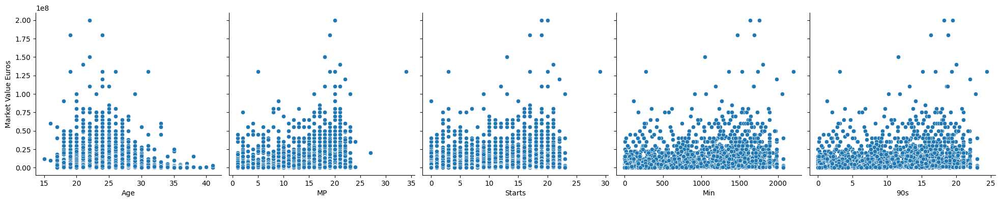

In [122]:
# first few Variables
#g = sns.pairplot(player_agg[['Market Value Euros', 'Age', 'MP', 'Starts', 'Min', '90s']], height = 5)
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Age', 'MP', 'Starts', 'Min', '90s'], height = 4)

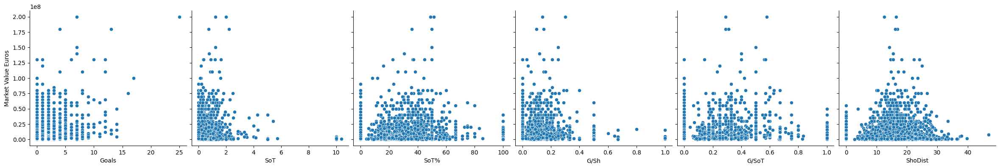

In [123]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Goals', 'SoT', 'SoT%', 'G/Sh', 'G/SoT', 'ShoDist'], height = 4)

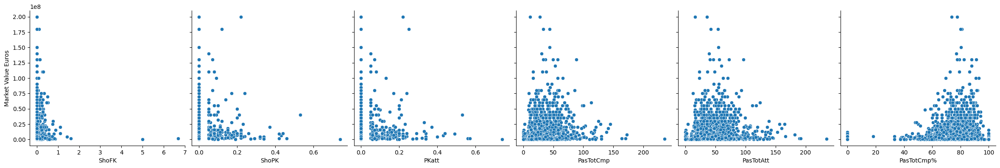

In [124]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt', 'PasTotCmp%'], height = 4)

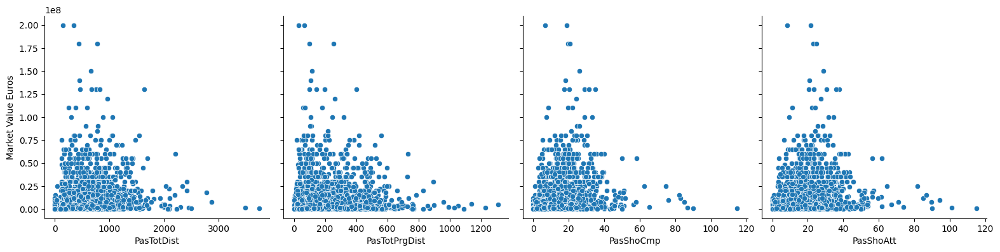

In [125]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt'], height = 4)

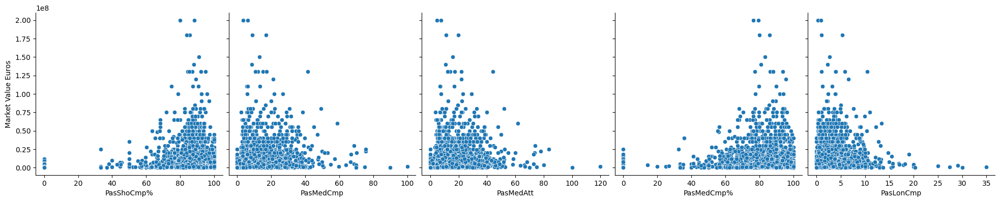

In [126]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'PasLonCmp'], height = 4)

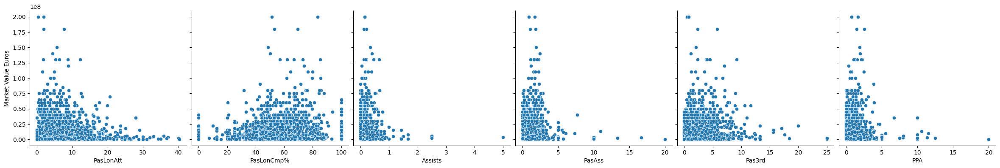

In [127]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd', 'PPA'], height = 4)

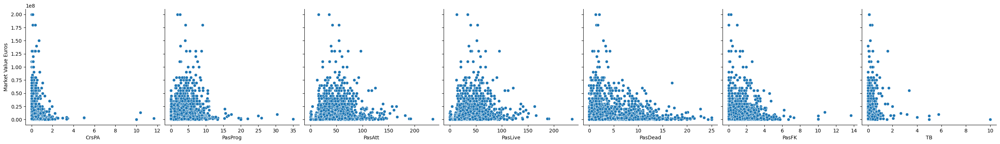

In [128]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK', 'TB'], height = 4)

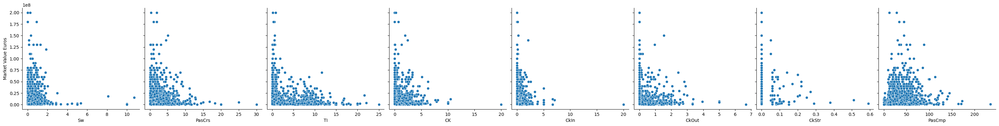

In [129]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp'], height = 4)

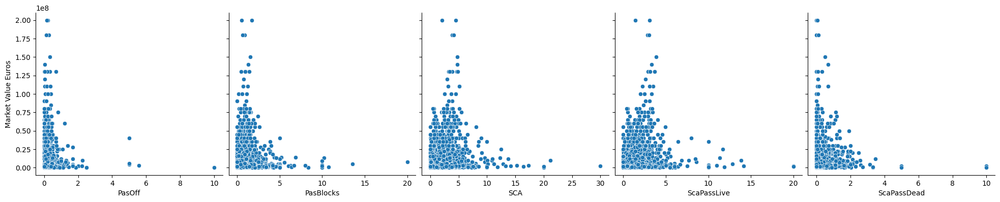

In [130]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['PasOff', 'PasBlocks', 'SCA', 'ScaPassLive', 'ScaPassDead'], height = 4)

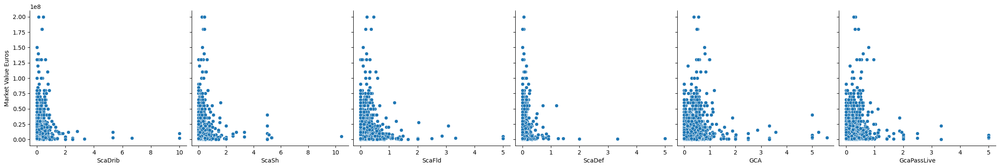

In [131]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef', 'GCA', 'GcaPassLive'], height = 4)

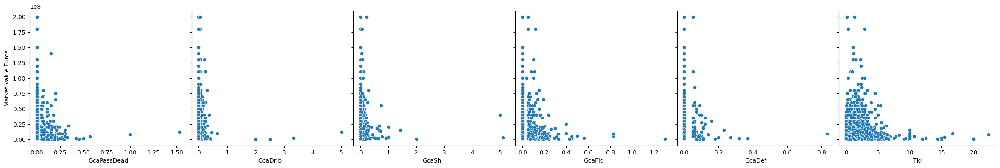

In [132]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld', 'GcaDef', 'Tkl'], height = 4)

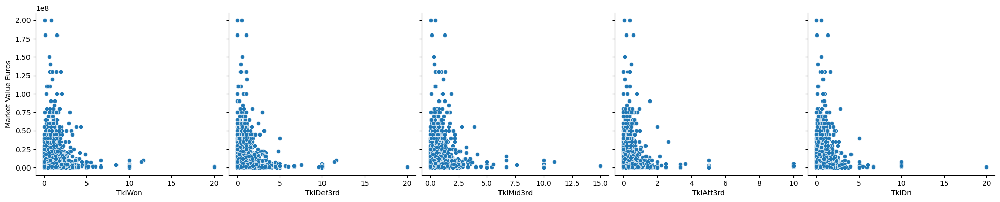

In [133]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd', 'TklDri'], height = 4)

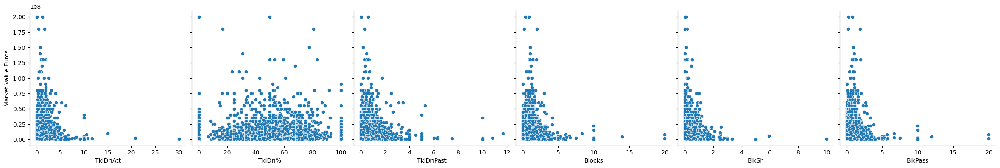

In [134]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh', 'BlkPass'], height = 4)

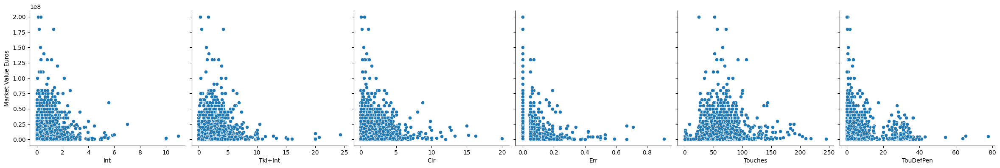

In [135]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen'], height = 4)

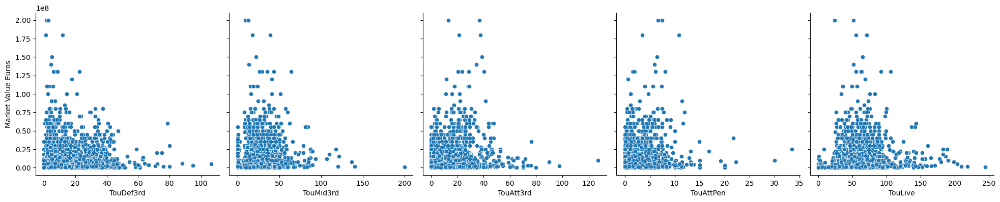

In [136]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['TouDef3rd', 'TouMid3rd', 'TouAtt3rd', 'TouAttPen', 'TouLive'], height = 4)

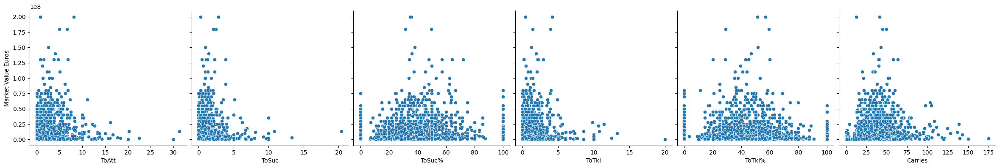

In [137]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['ToAtt', 'ToSuc', 'ToSuc%', 'ToTkl', 'ToTkl%', 'Carries'], height = 4)

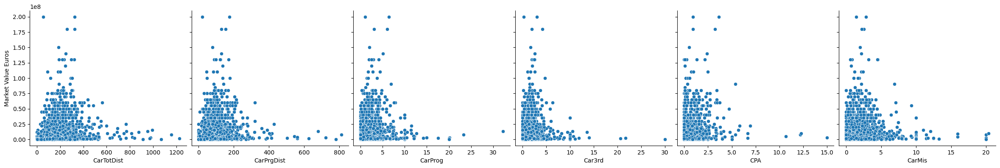

In [138]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CarTotDist', 'CarPrgDist', 'CarProg', 'Car3rd', 'CPA', 'CarMis'], height = 4)

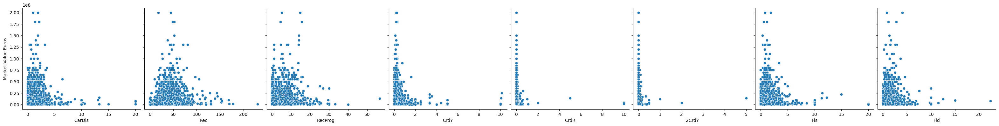

In [139]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['CarDis', 'Rec', 'RecProg', 'CrdY', 'CrdR', '2CrdY', 'Fls', 'Fld'], height = 4)

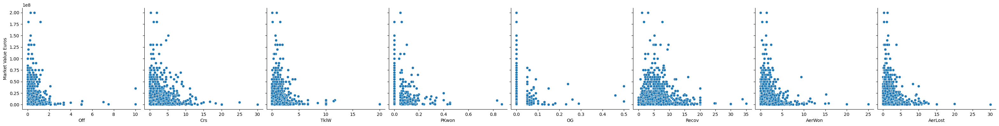

In [140]:
g = sns.pairplot(data=player_agg,y_vars=['Market Value Euros'],x_vars=['Off', 'Crs', 'TklW', 'PKwon', 'OG', 'Recov', 'AerWon', 'AerLost'], height = 4)

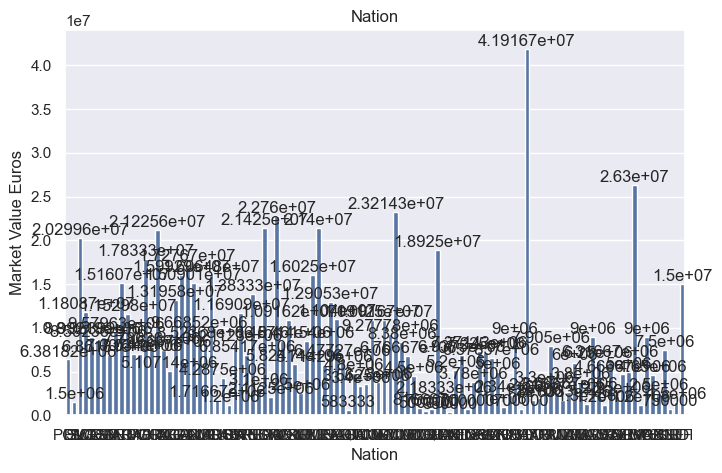

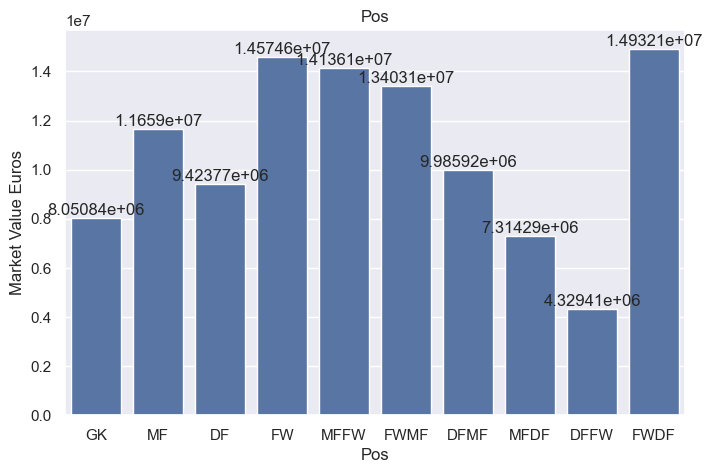

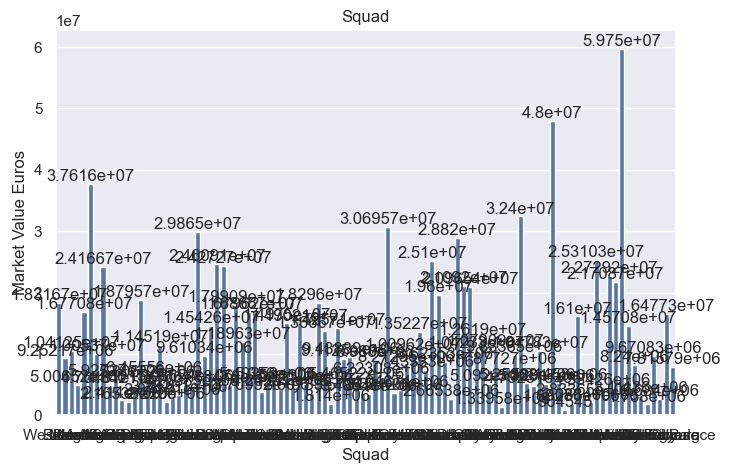

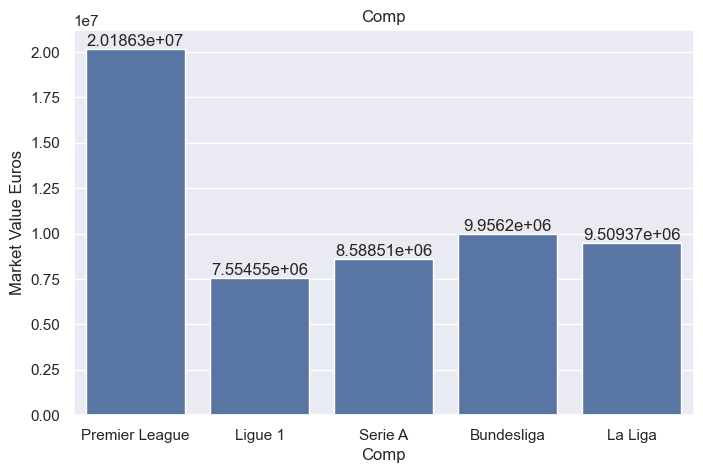

In [141]:
# visualizing the categorical values

categories = ['Nation', 'Pos', 'Squad', 'Comp']

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})

for c in categories:
    
    ax = sns.barplot(x=c, y="Market Value Euros", data=player_agg, errorbar=('ci', False)) #, hue = 'Model')
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(c)
    plt.show()

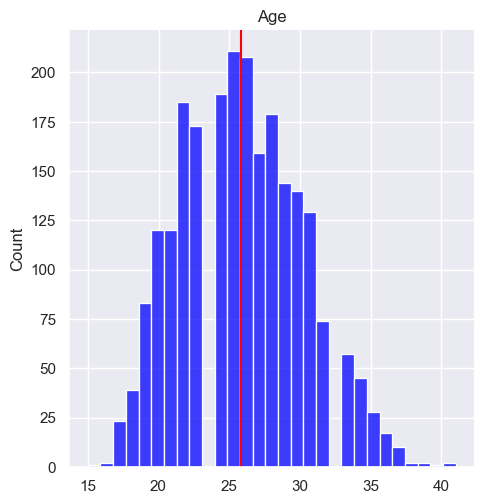

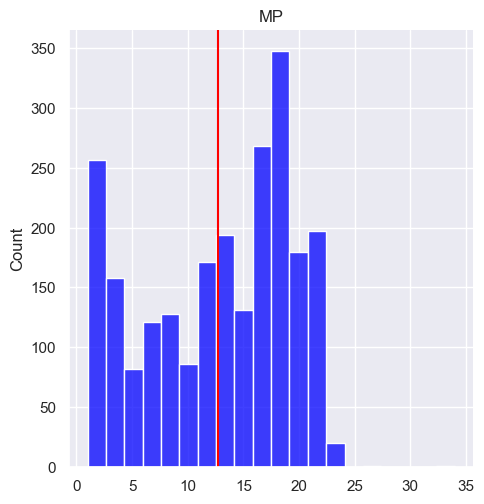

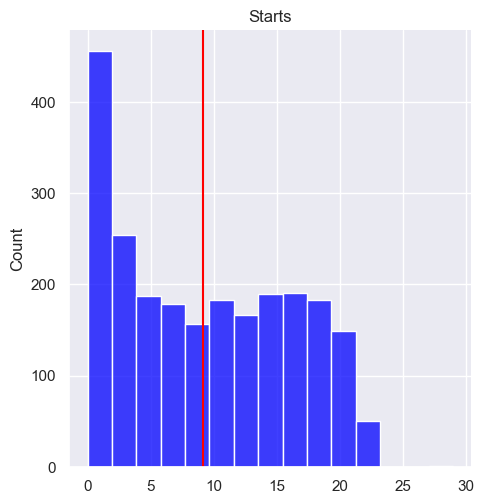

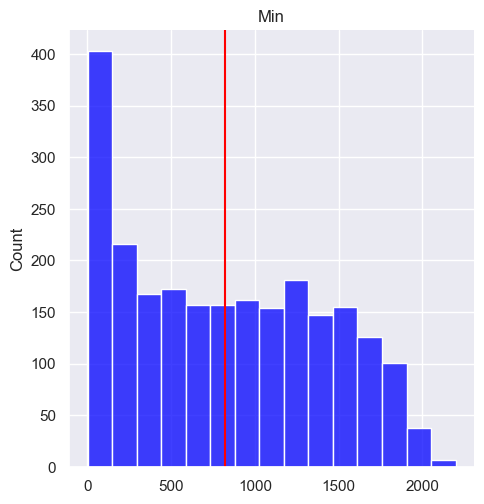

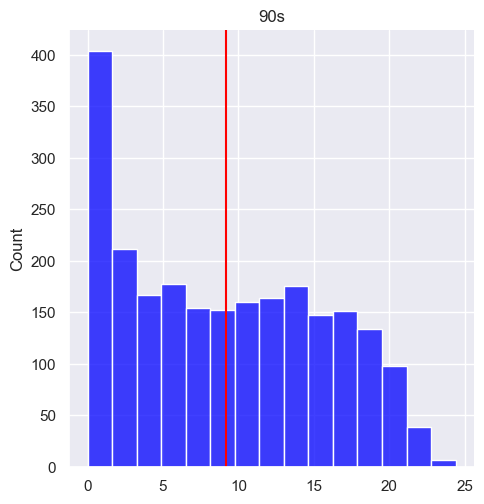

...

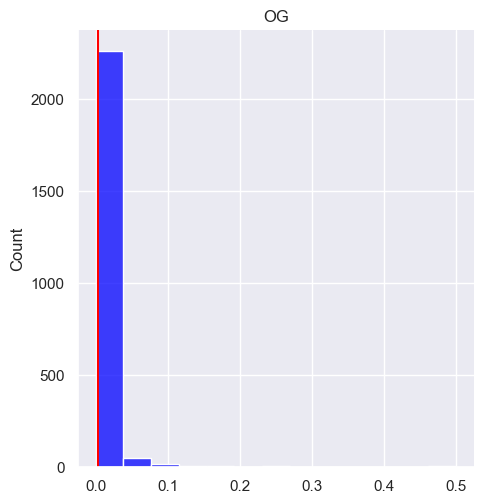

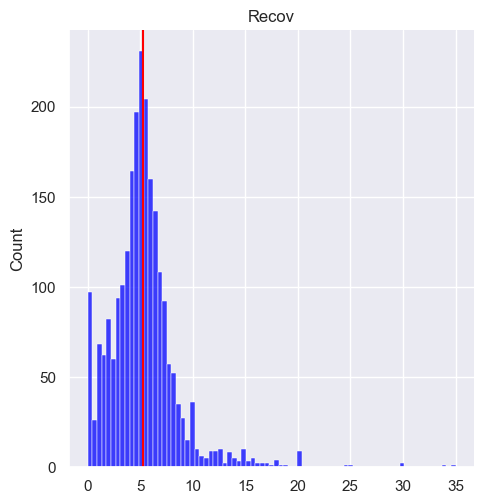

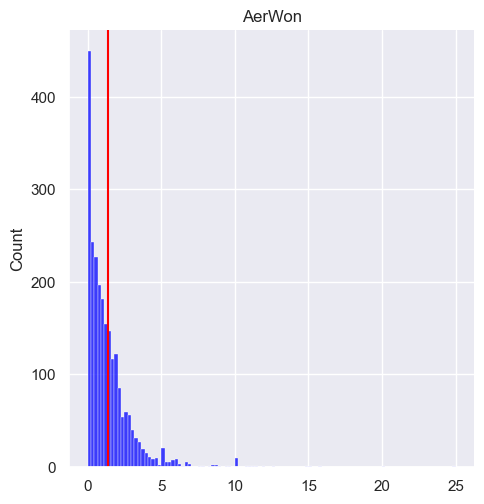

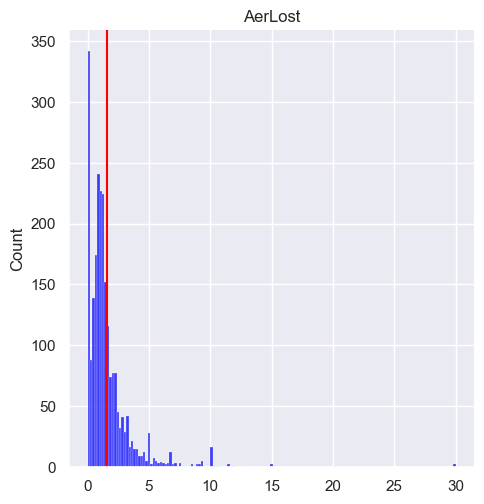

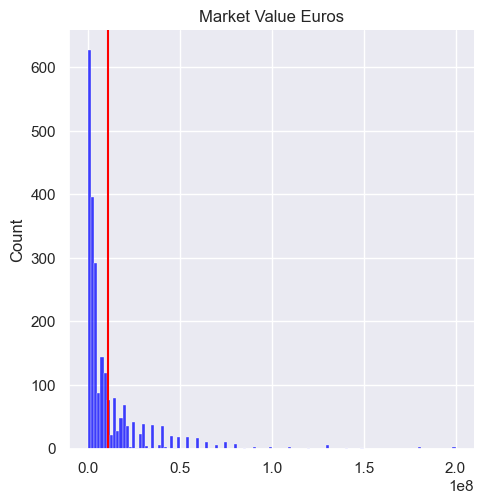

In [142]:
# Investigating the distribution of all fields, adding the mean

# identifying all numeric columns
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
n_variables = player_agg.select_dtypes(include=numerics).columns

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})


for n in n_variables:
    x = player_agg[n].values
    sns.displot(x, color = 'blue');

    # Calculating the mean
    mean = player_agg[n].mean()

    #ploting the mean
    plt.axvline(mean, 0,1, color = 'red')
    plt.title(n)
    plt.show()

In [143]:
# removing players with more than 100m Market Values as they will skew the results - OUTLIERS
player_agg = player_agg[player_agg['Market Value Euros']<100000000]

The meadian is:  26.0


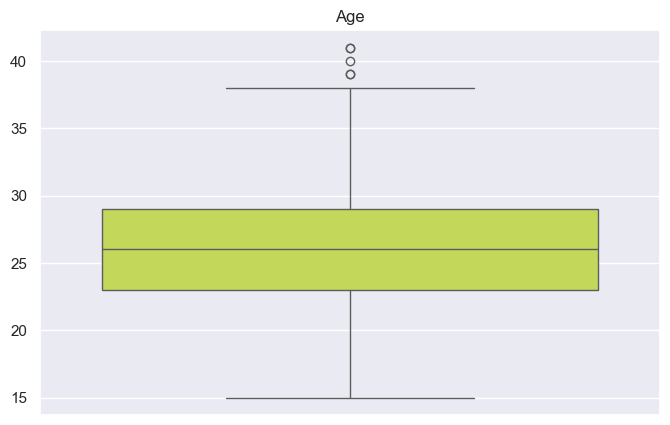

The meadian is:  14.0


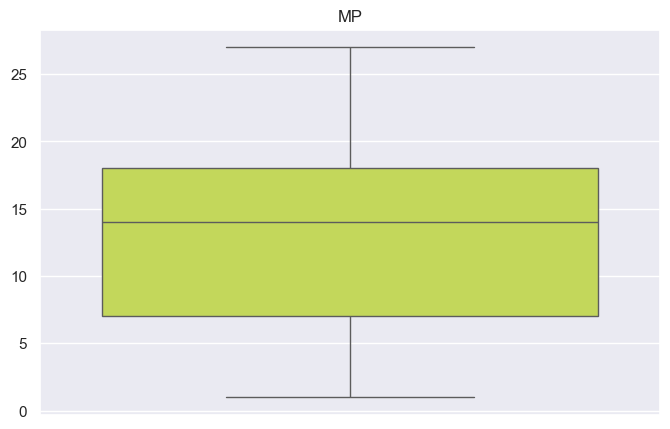

The meadian is:  9.0


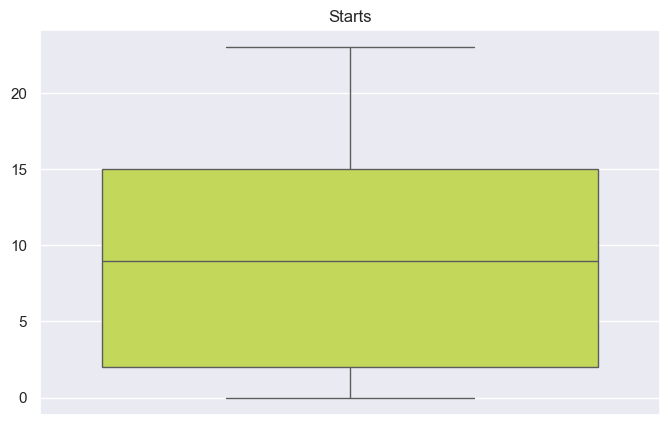

The meadian is:  776.0


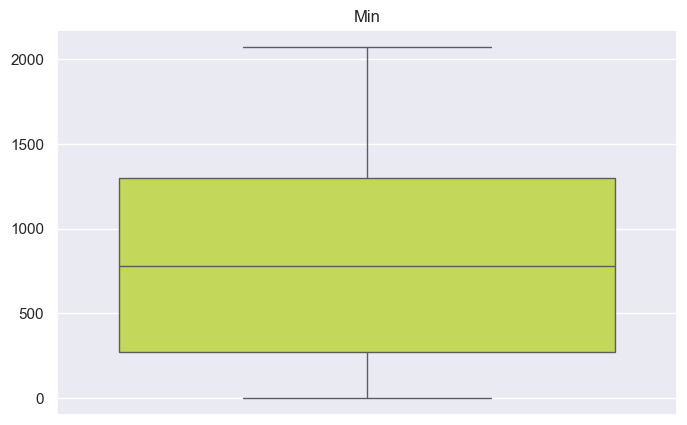

The meadian is:  8.6


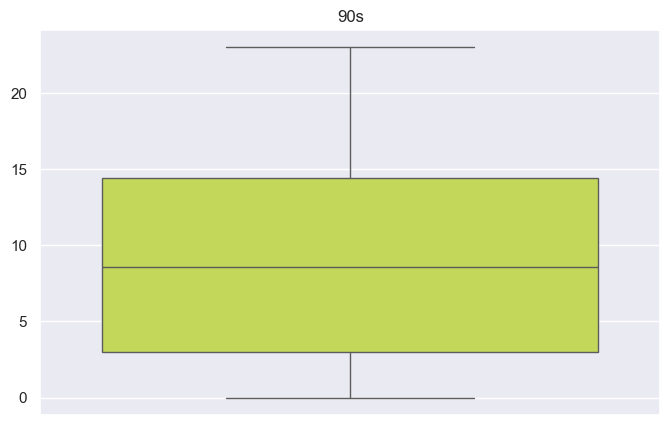

The meadian is:  0.0


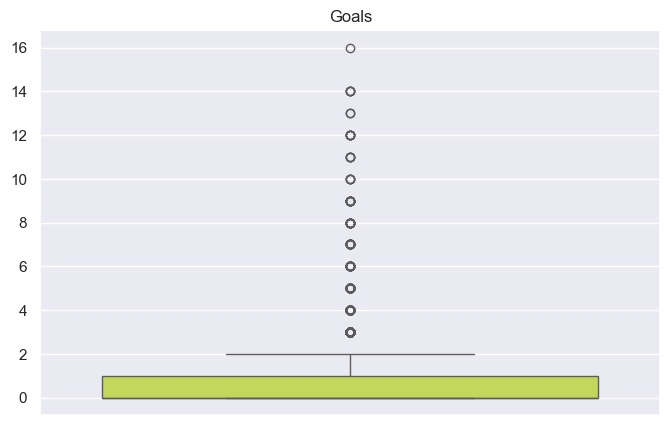

The meadian is:  0.2


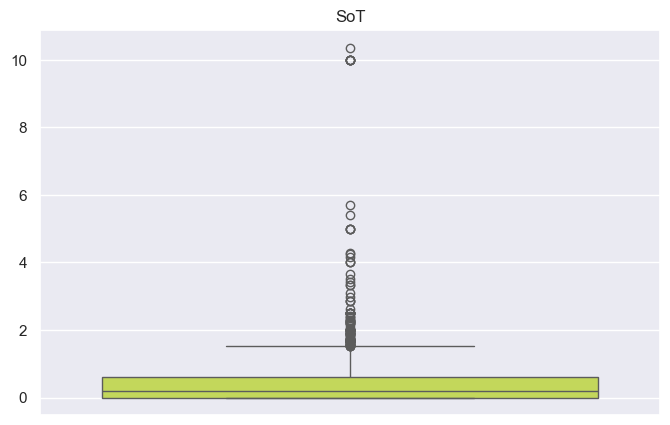

The meadian is:  25.0


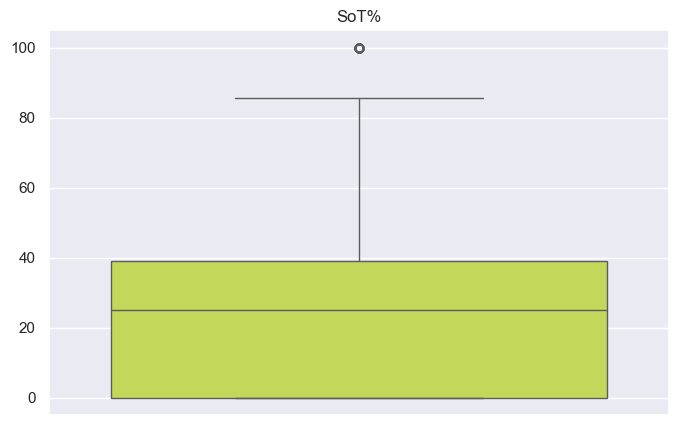

The meadian is:  0.0


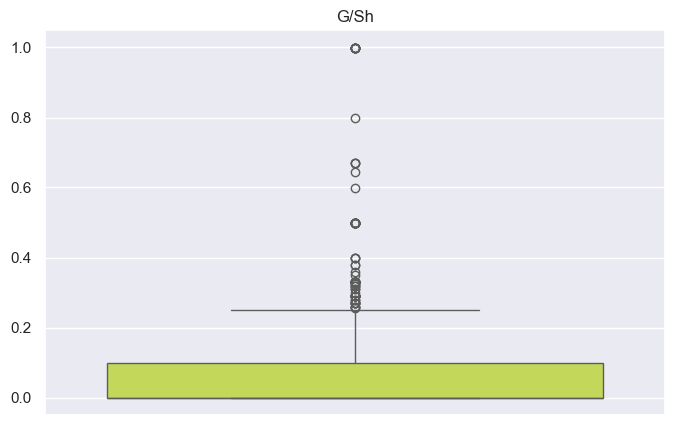

The meadian is:  0.0


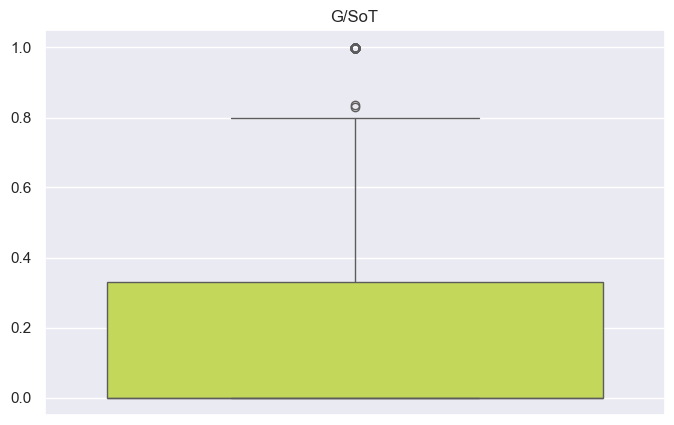

The meadian is:  15.5


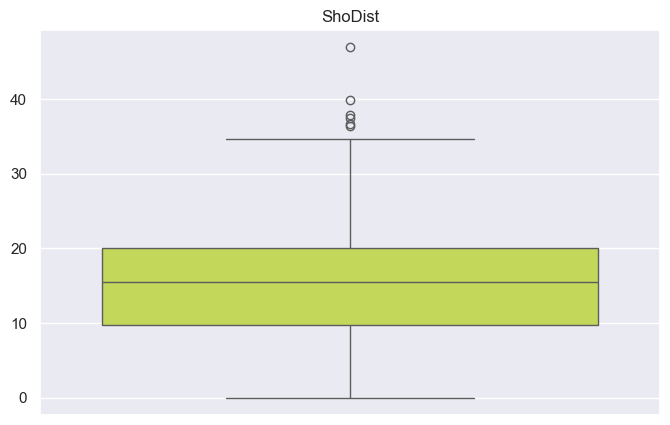

The meadian is:  0.0


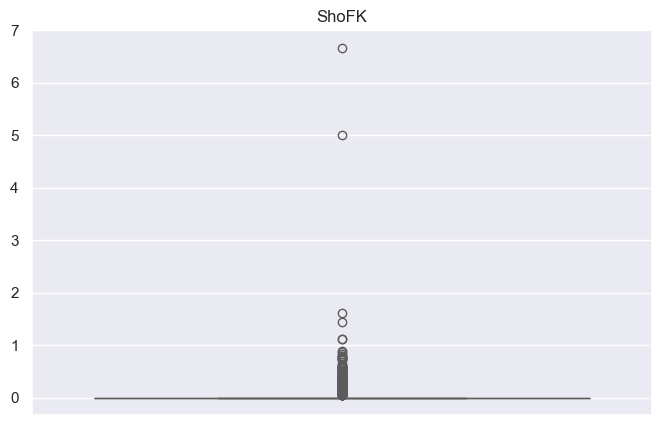

The meadian is:  0.0


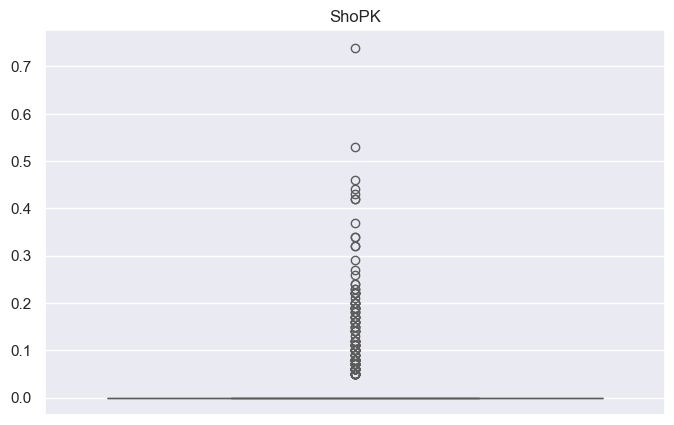

The meadian is:  0.0


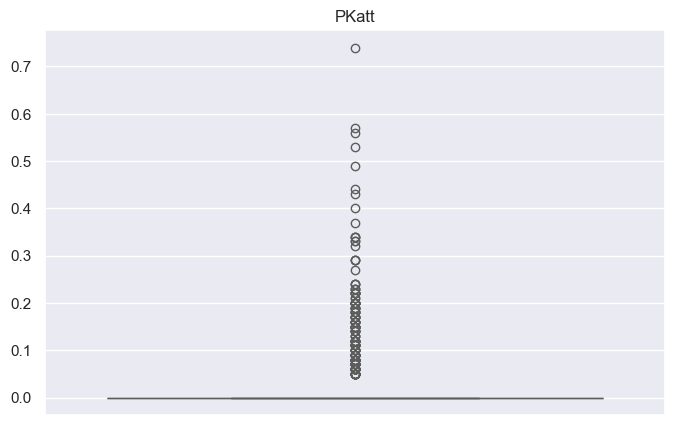

The meadian is:  32.8


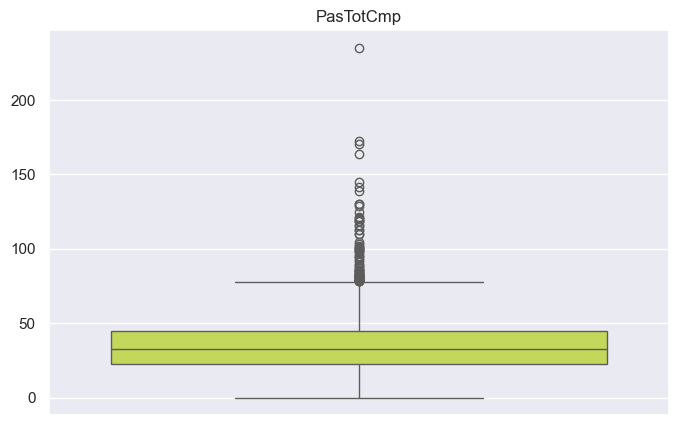

The meadian is:  43.0


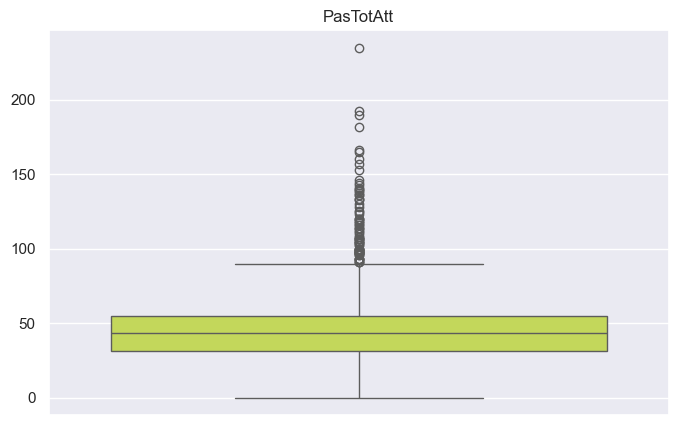

The meadian is:  77.3


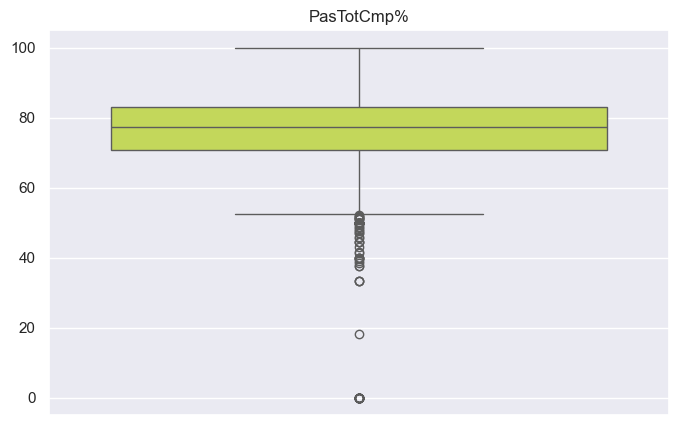

The meadian is:  581.8


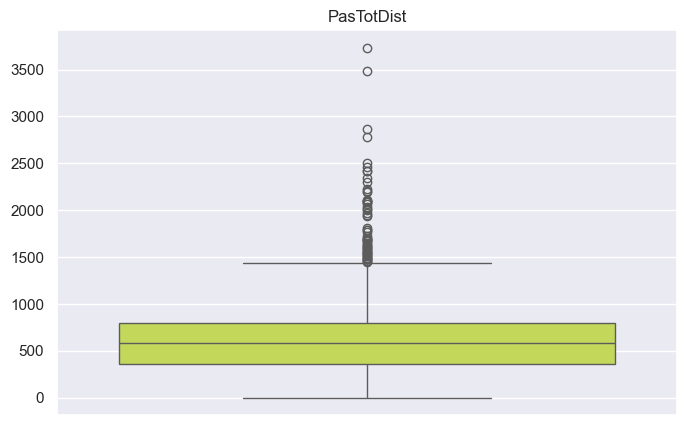

The meadian is:  184.1


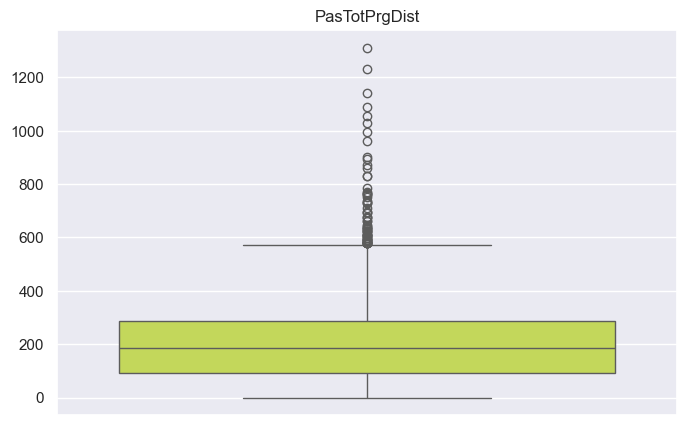

The meadian is:  15.0


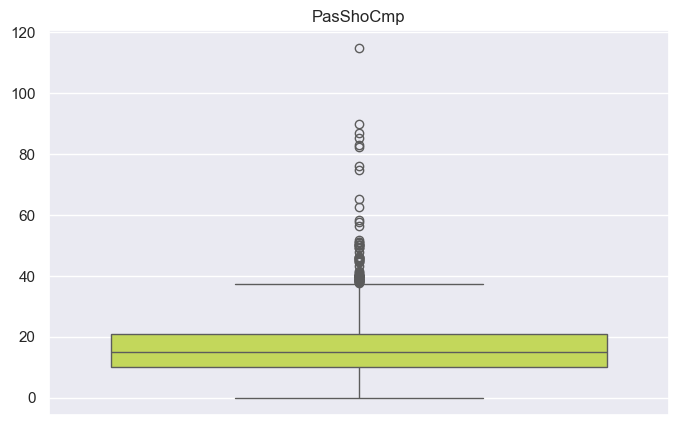

The meadian is:  17.6


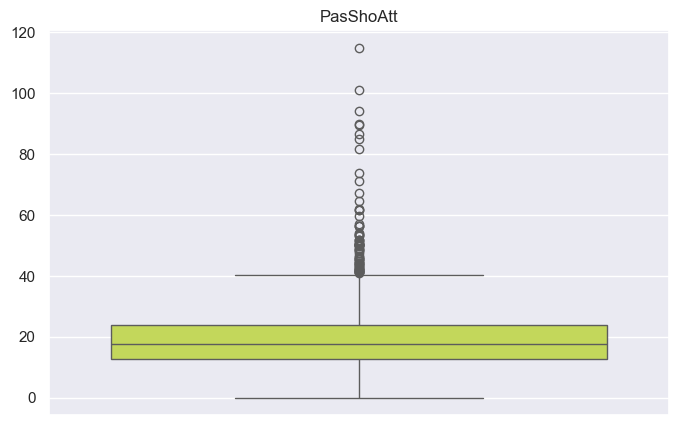

The meadian is:  87.4


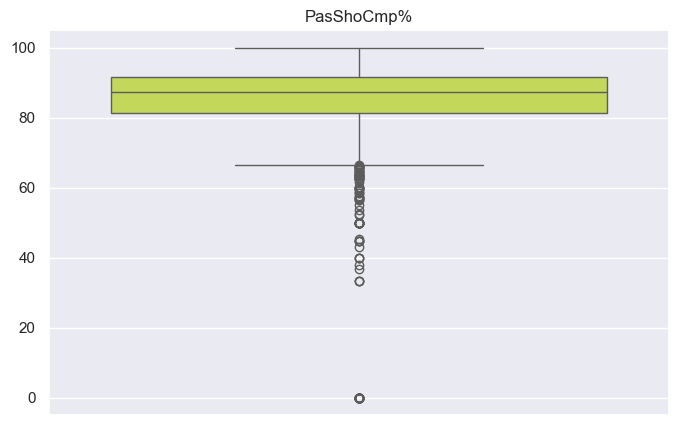

The meadian is:  12.73


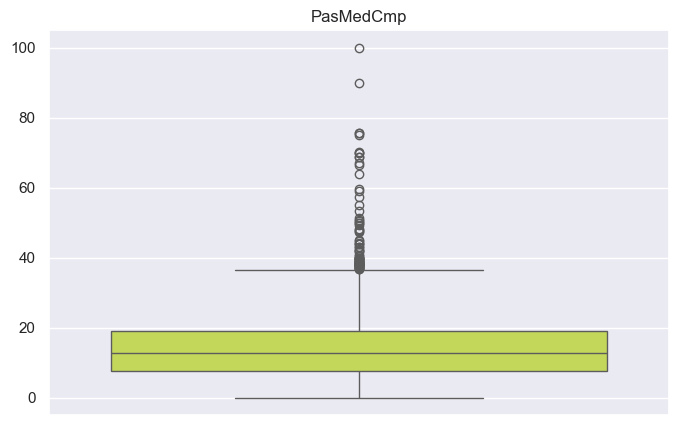

The meadian is:  15.9


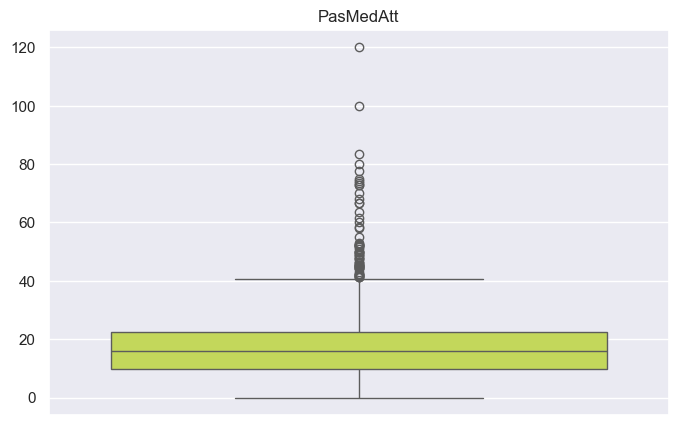

The meadian is:  82.9


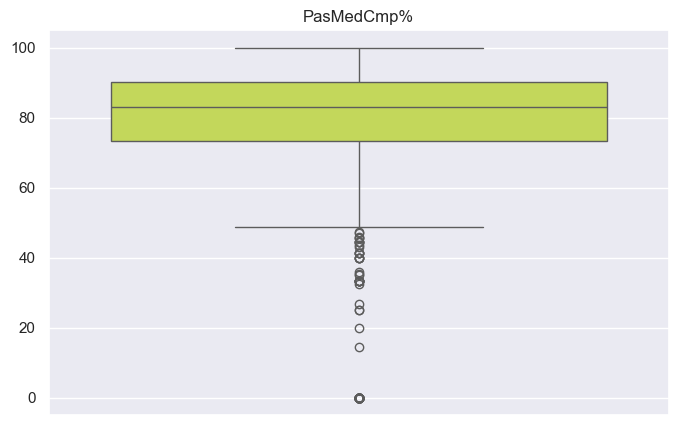

The meadian is:  2.79


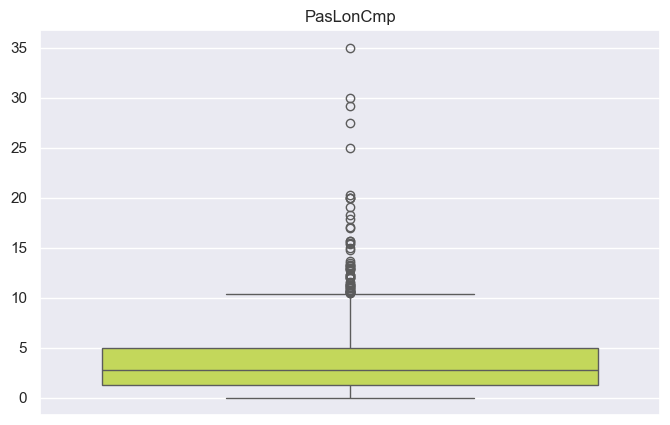

The meadian is:  5.26


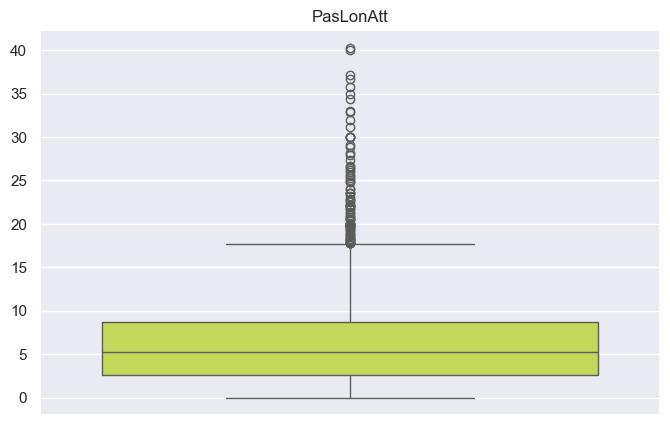

The meadian is:  53.2


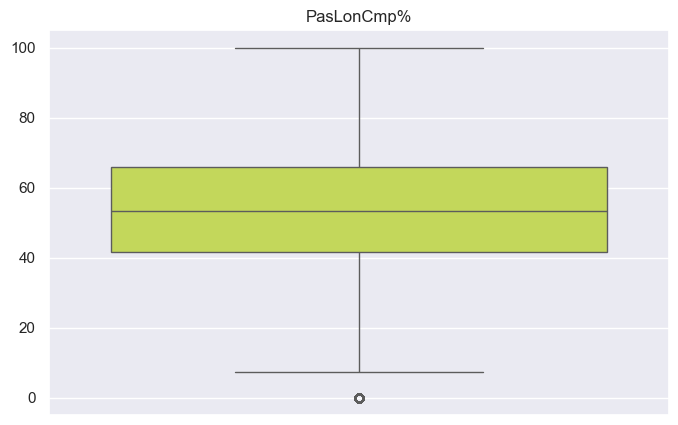

The meadian is:  0.0


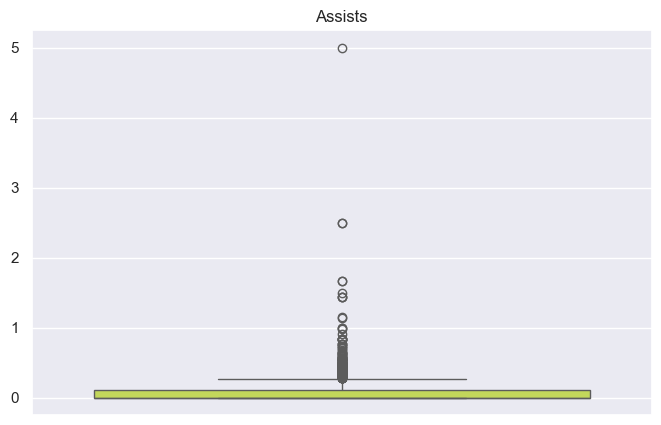

The meadian is:  0.69


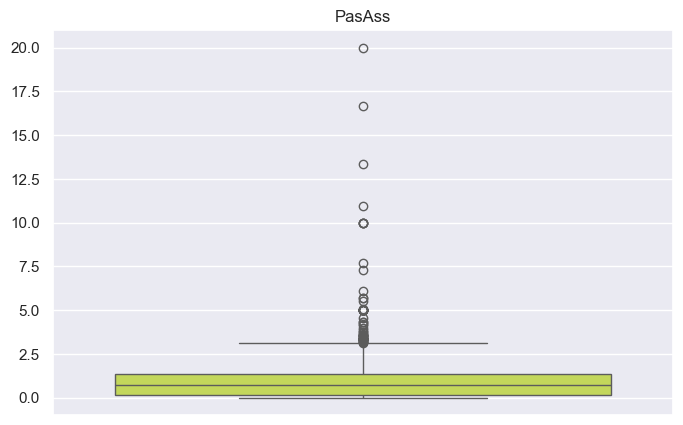

The meadian is:  2.27


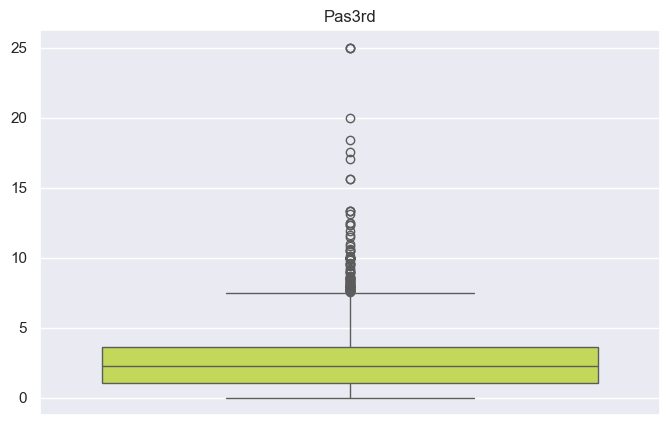

The meadian is:  0.53


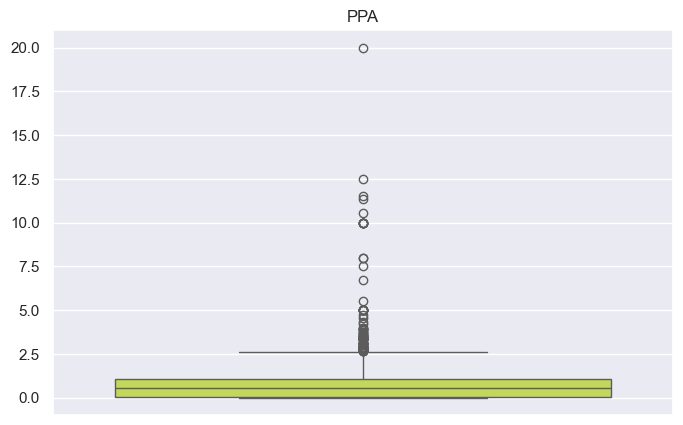

The meadian is:  0.0


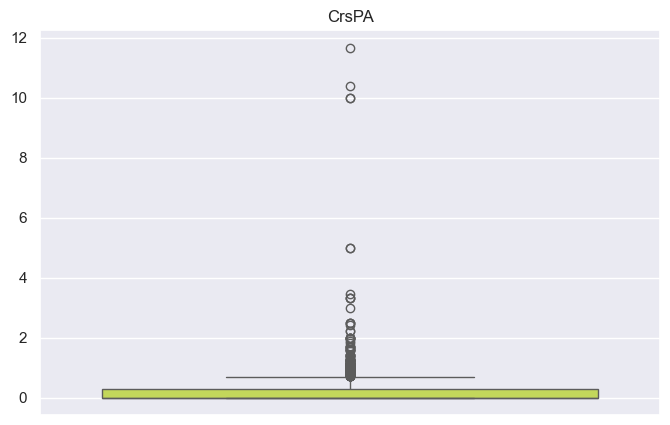

The meadian is:  3.22


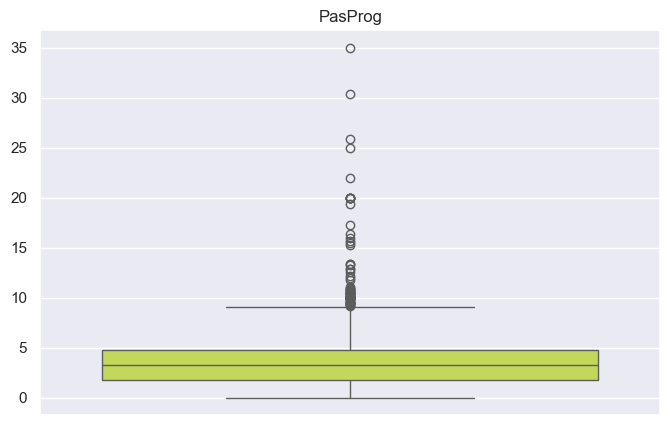

The meadian is:  43.0


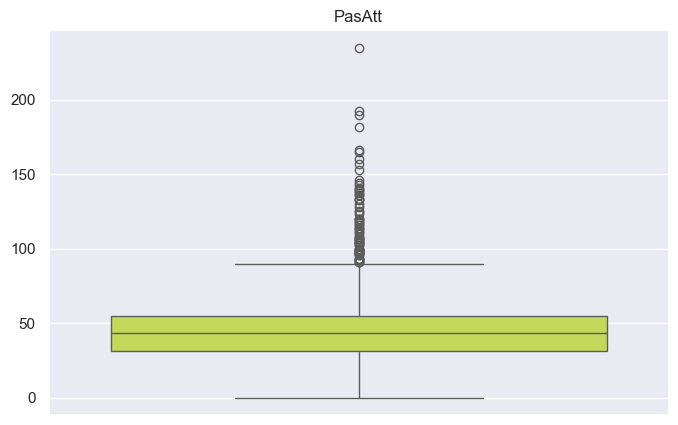

The meadian is:  38.5


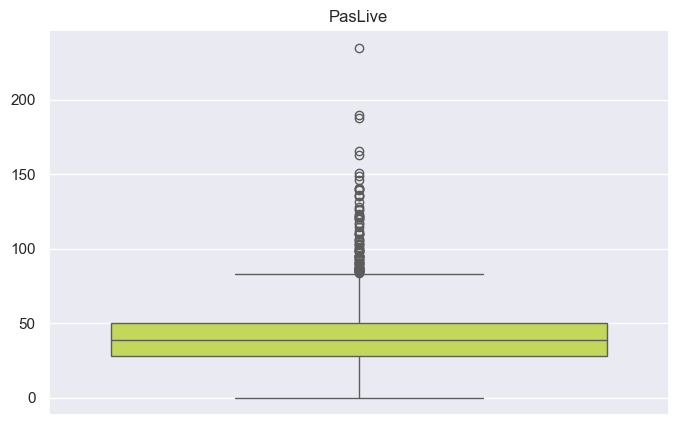

The meadian is:  2.47


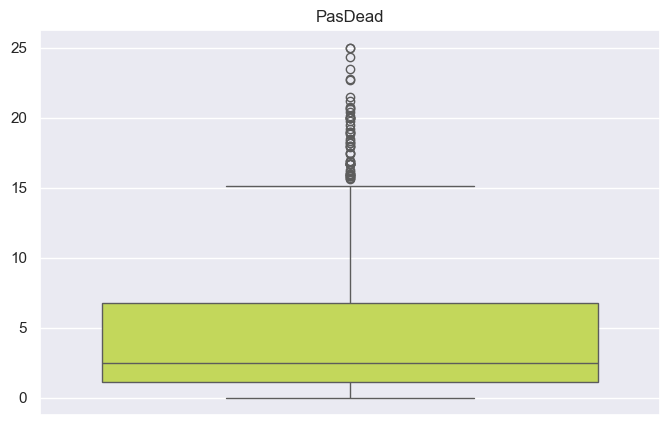

The meadian is:  0.73


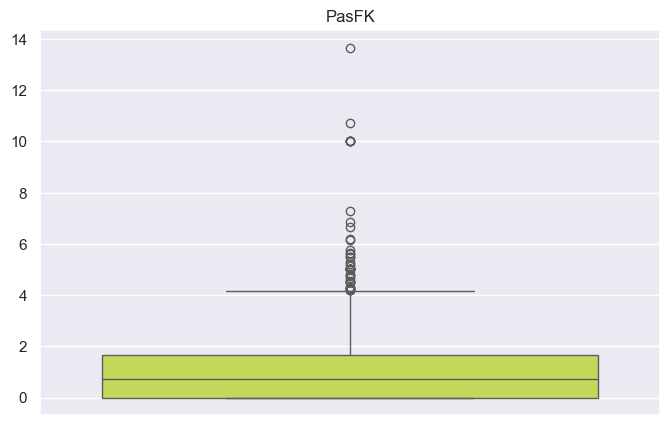

The meadian is:  0.0


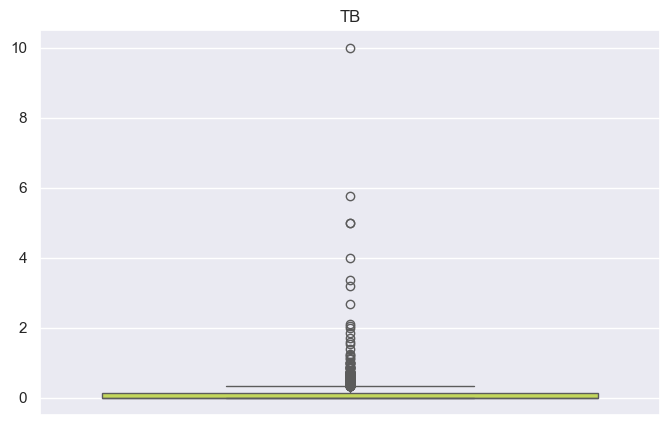

The meadian is:  0.16


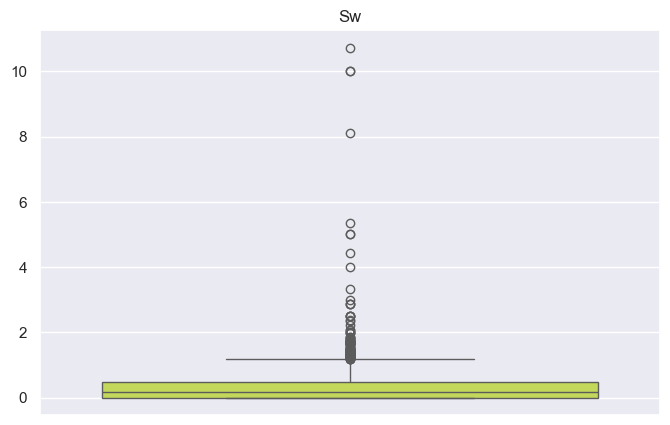

The meadian is:  0.83


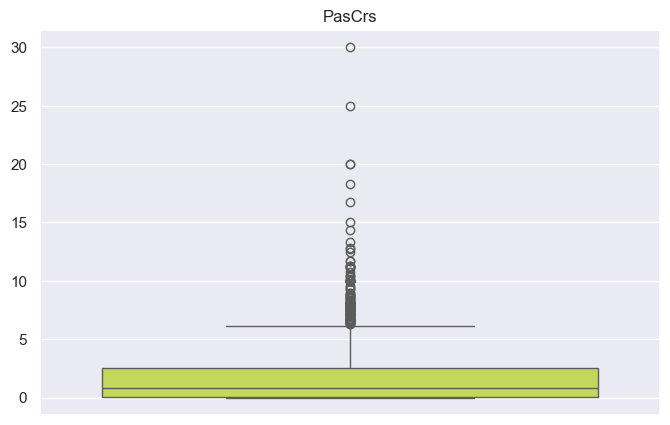

The meadian is:  0.25


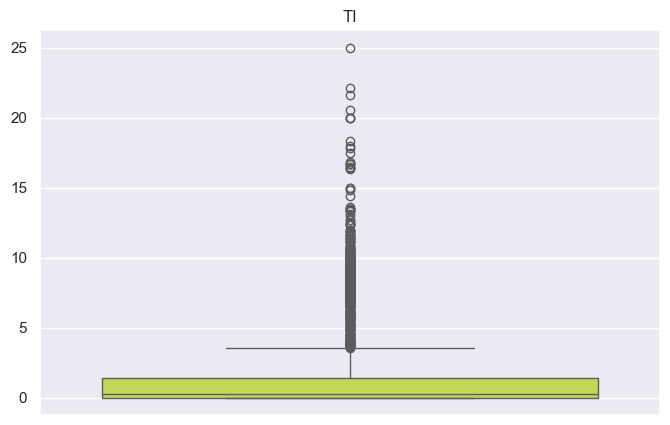

The meadian is:  0.0


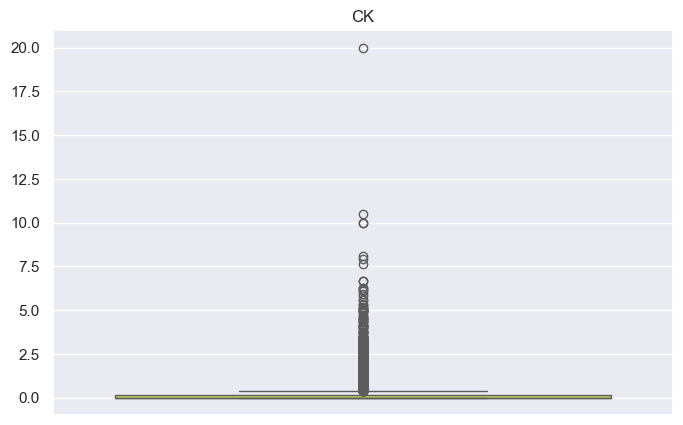

The meadian is:  0.0


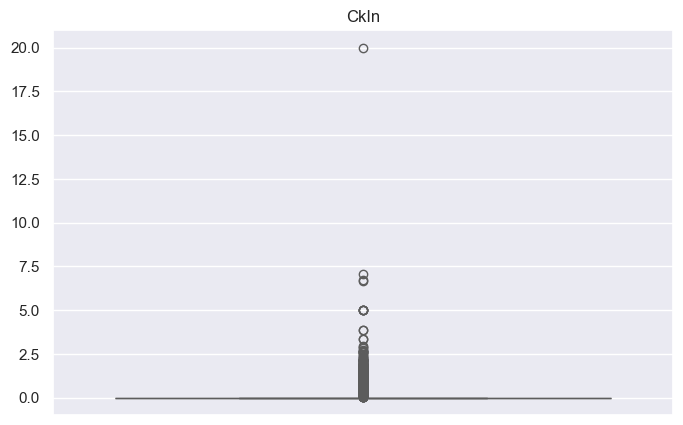

The meadian is:  0.0


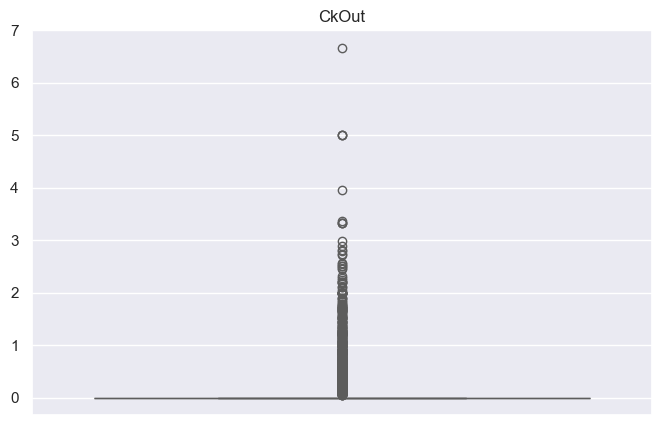

The meadian is:  0.0


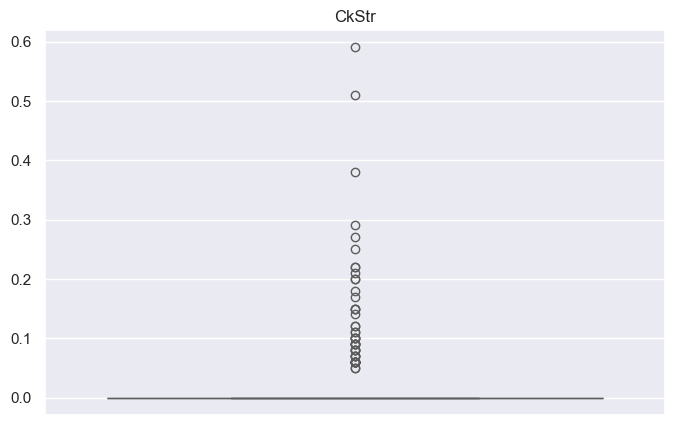

The meadian is:  32.8


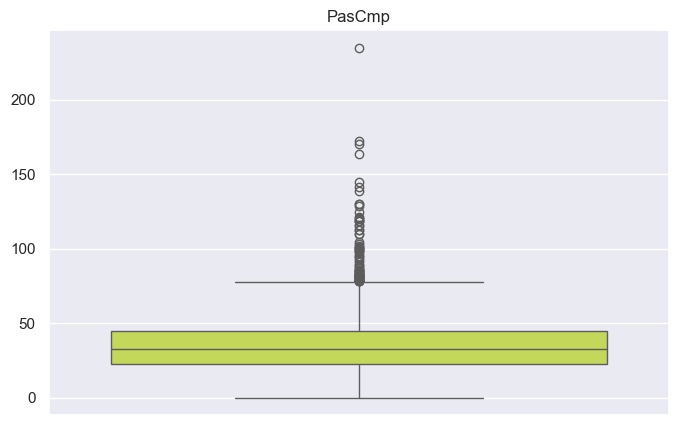

The meadian is:  0.1


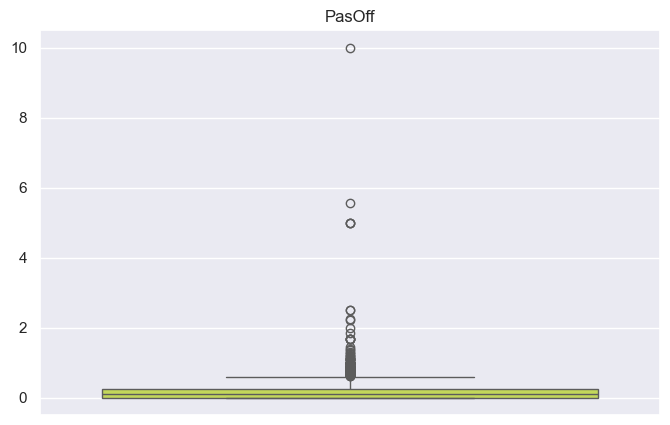

The meadian is:  0.81


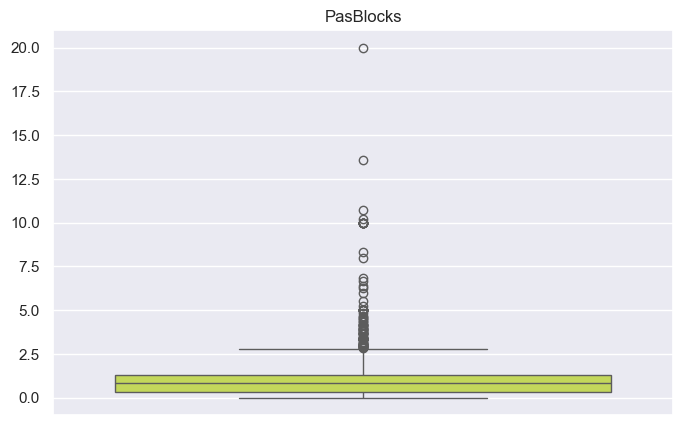

The meadian is:  1.87


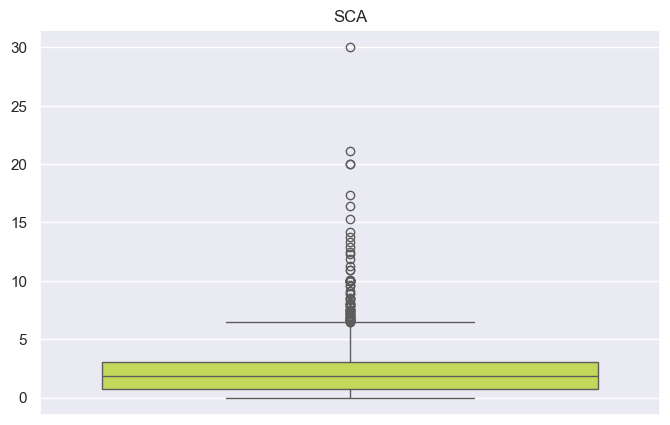

The meadian is:  1.36


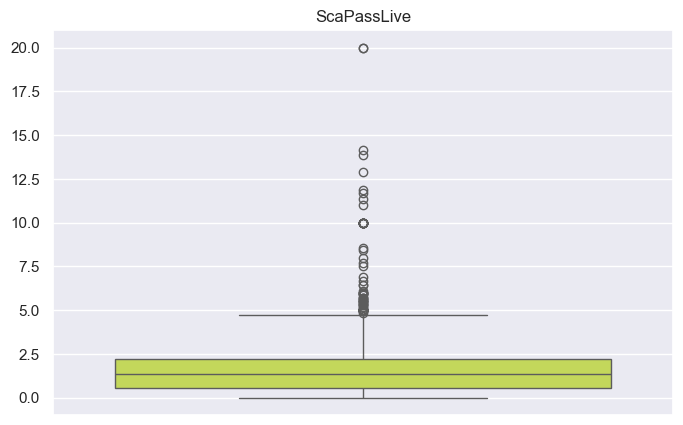

The meadian is:  0.0


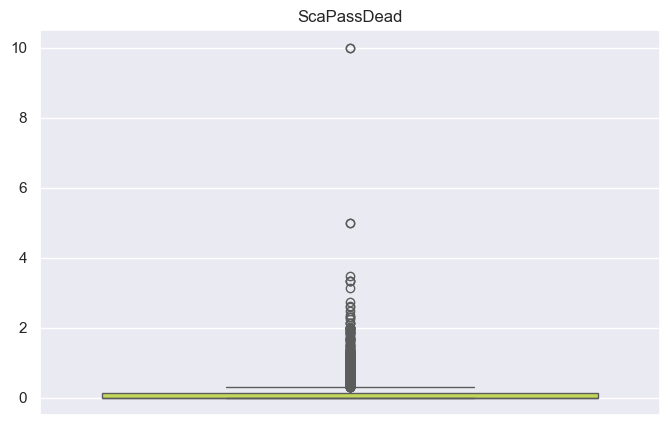

The meadian is:  0.0


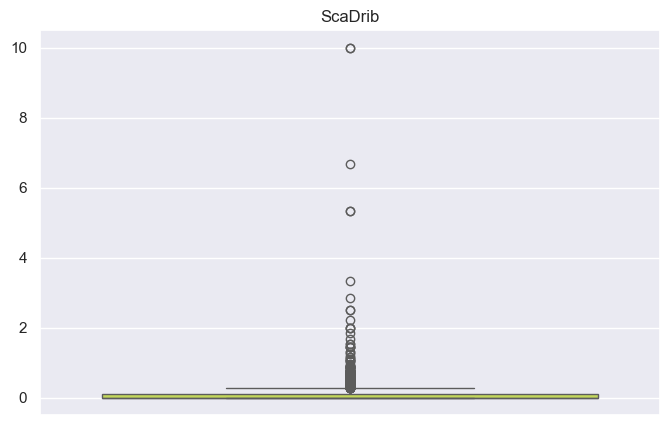

The meadian is:  0.0


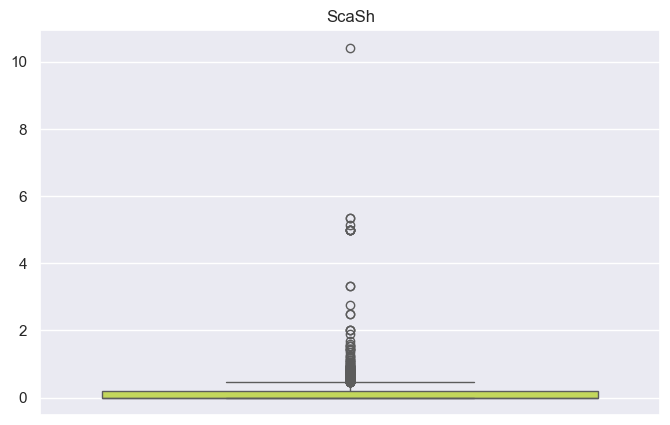

The meadian is:  0.0


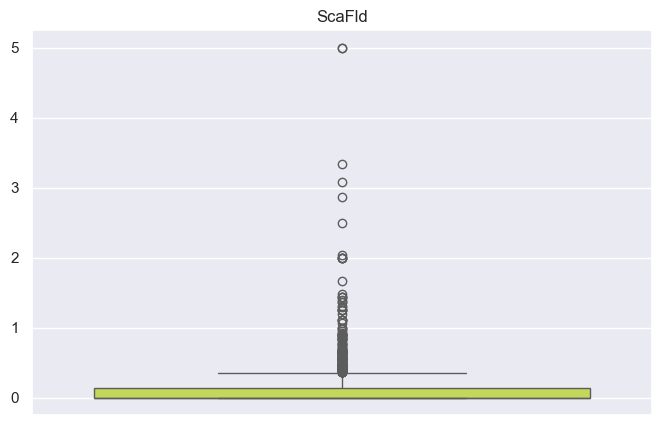

The meadian is:  0.0


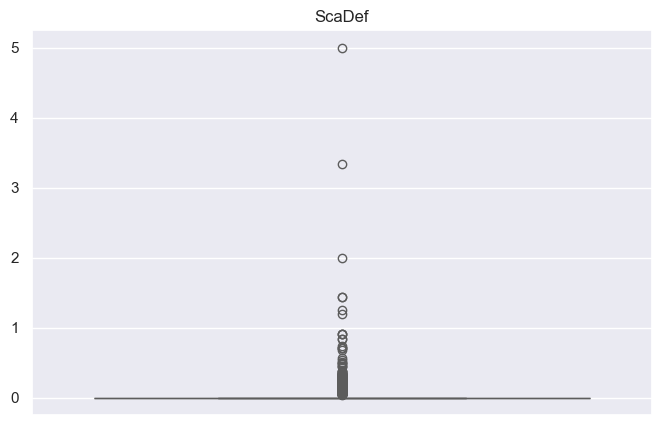

The meadian is:  0.1


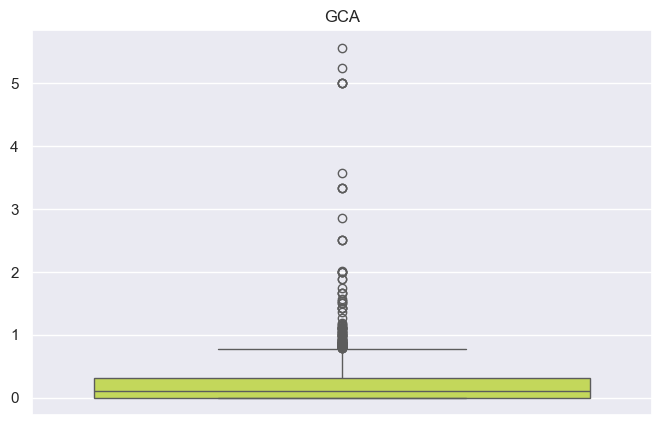

The meadian is:  0.06


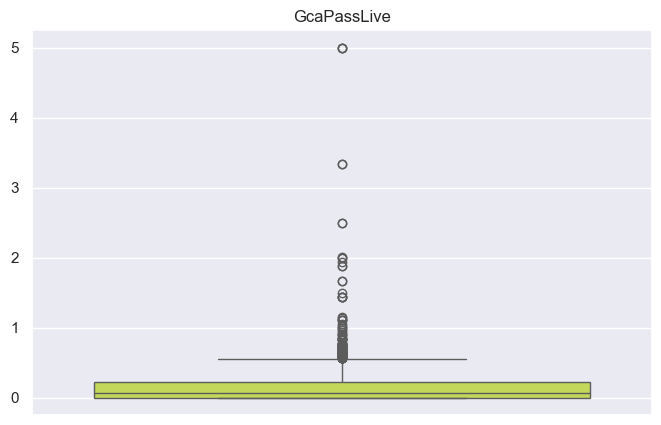

The meadian is:  0.0


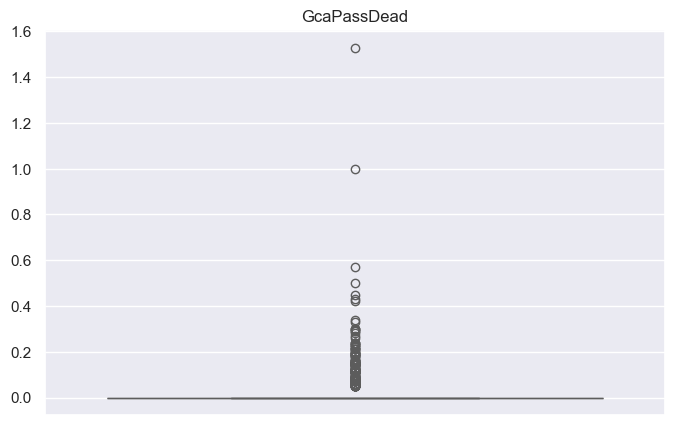

The meadian is:  0.0


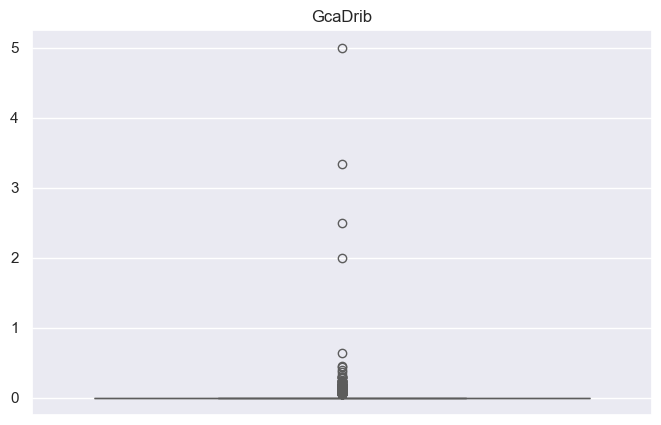

The meadian is:  0.0


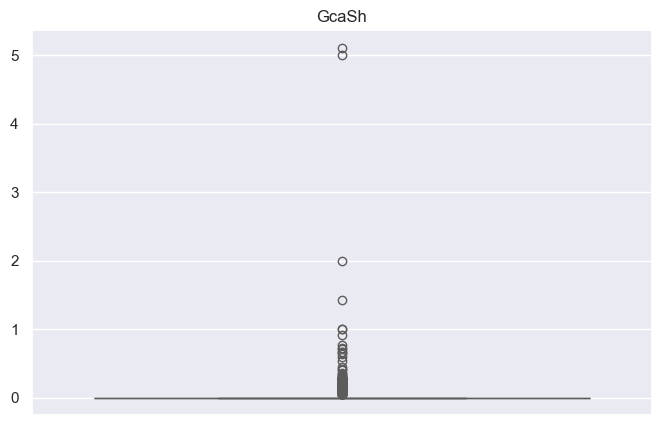

The meadian is:  0.0


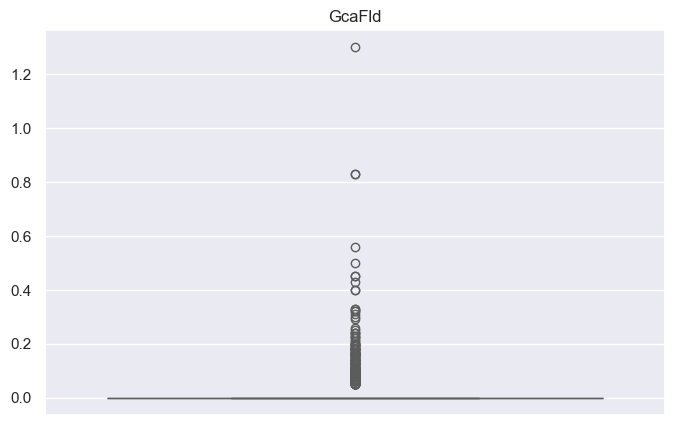

The meadian is:  0.0


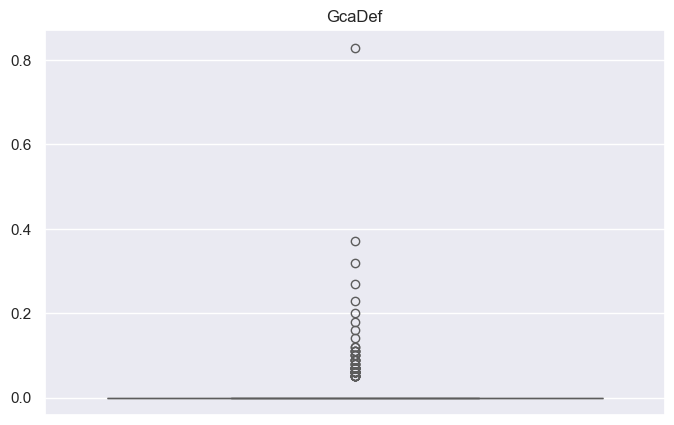

The meadian is:  1.56


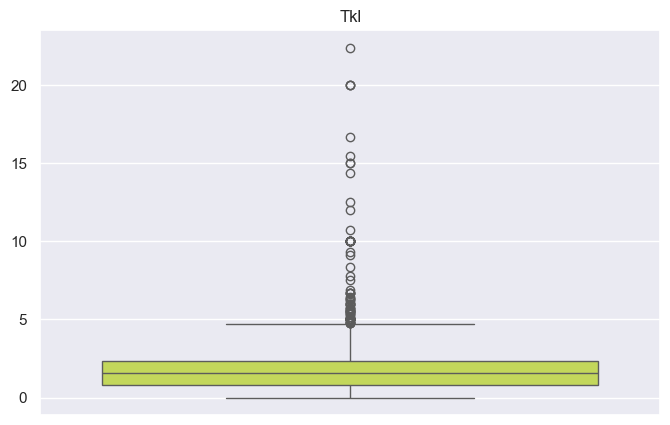

The meadian is:  0.86


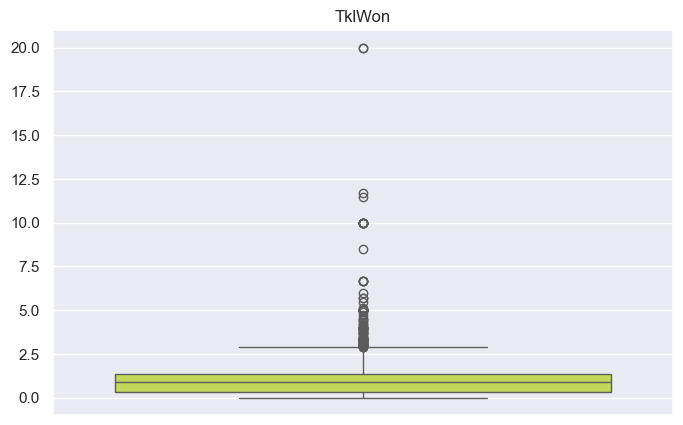

The meadian is:  0.67


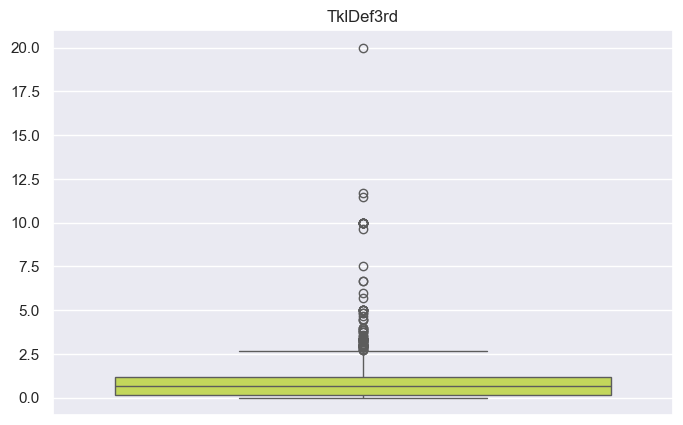

The meadian is:  0.53


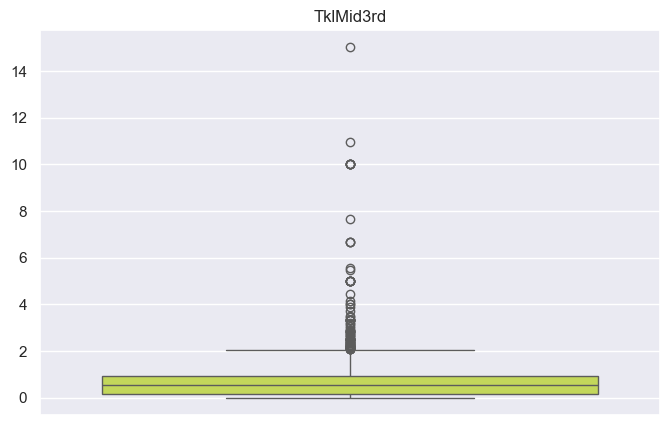

The meadian is:  0.13


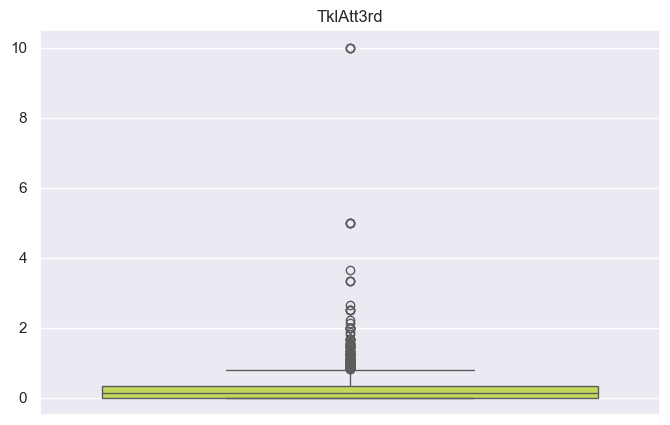

The meadian is:  0.64


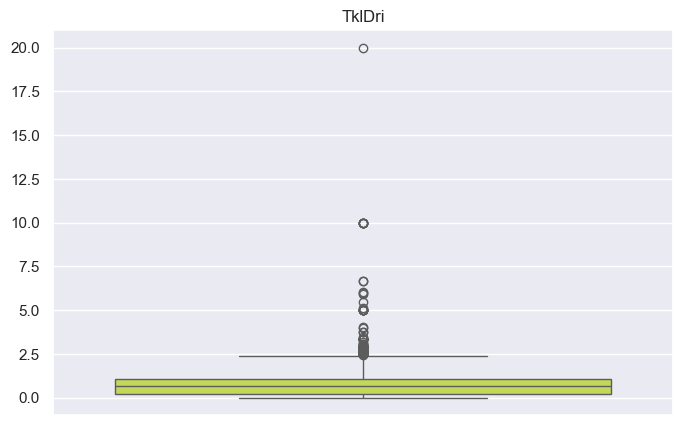

The meadian is:  1.3


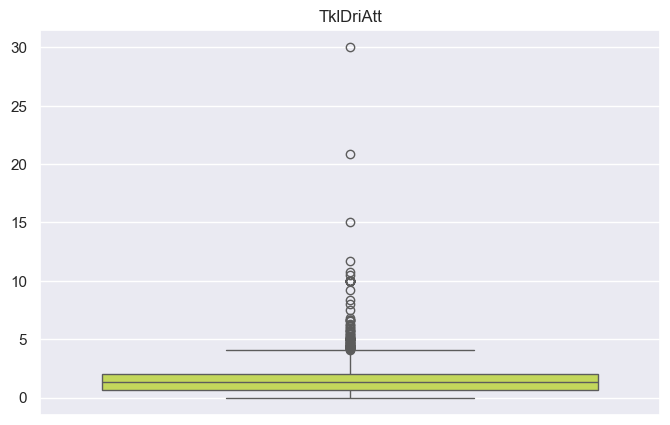

The meadian is:  50.0


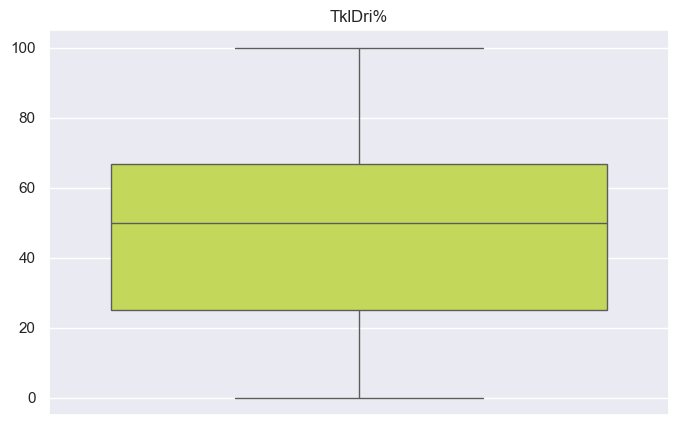

The meadian is:  0.53


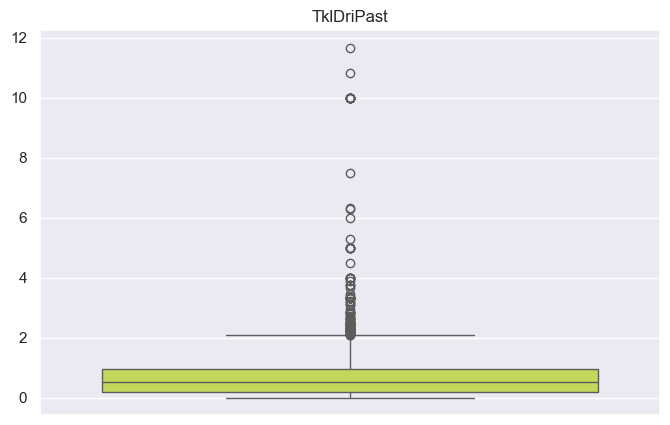

The meadian is:  1.0


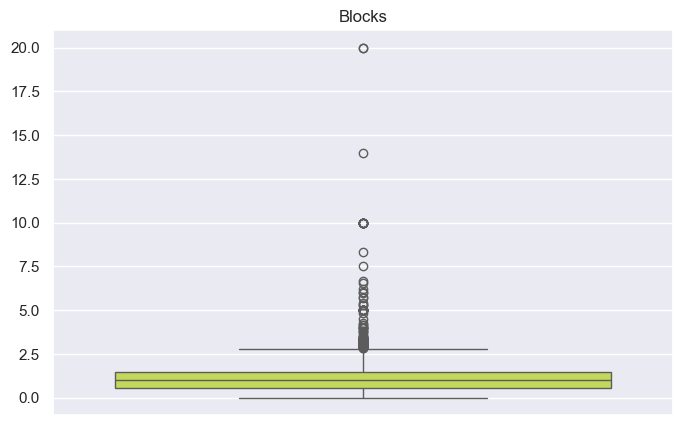

The meadian is:  0.14


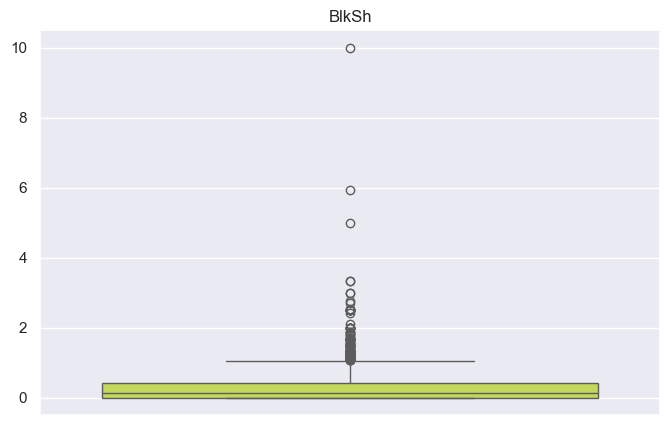

The meadian is:  0.69


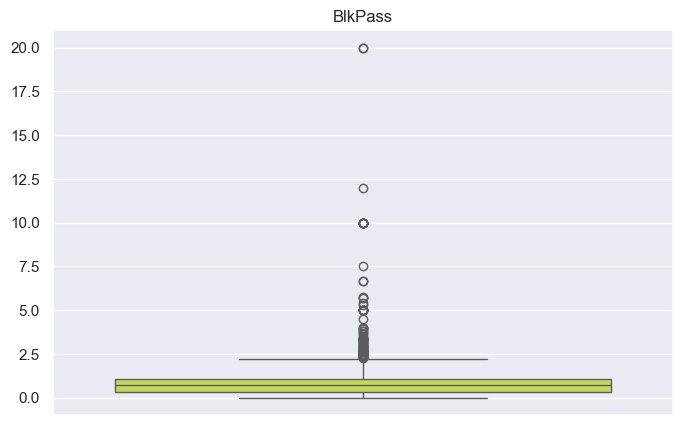

The meadian is:  0.75


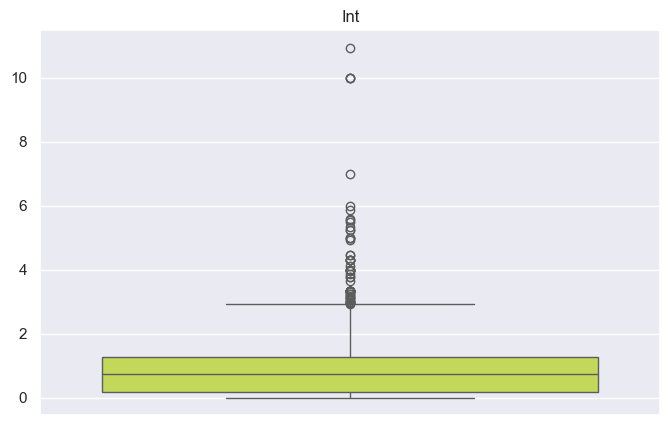

The meadian is:  2.5


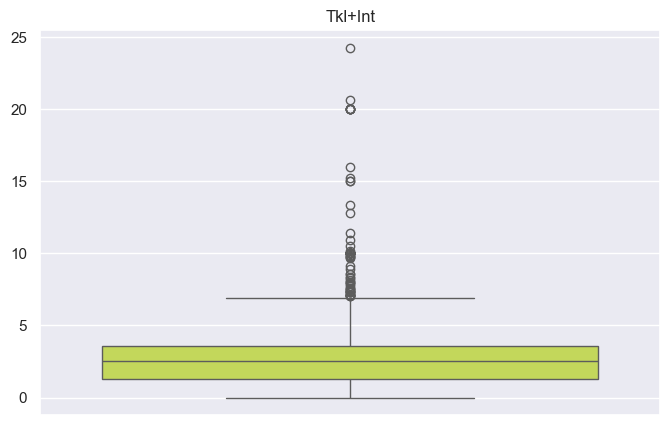

The meadian is:  1.07


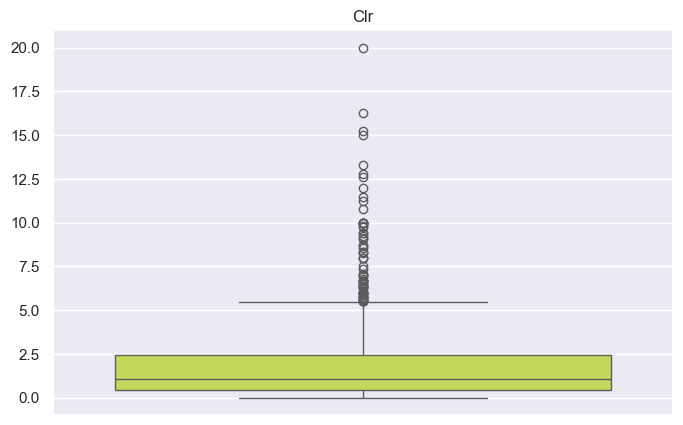

The meadian is:  0.0


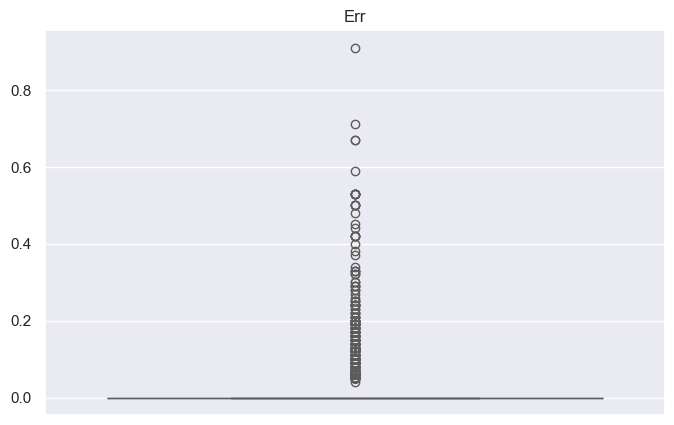

The meadian is:  54.6


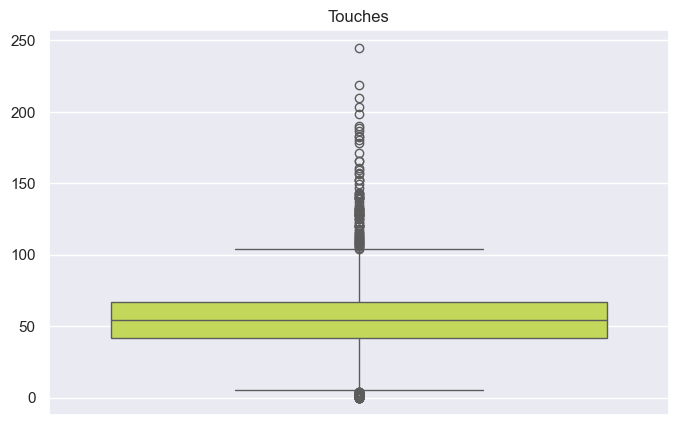

The meadian is:  2.26


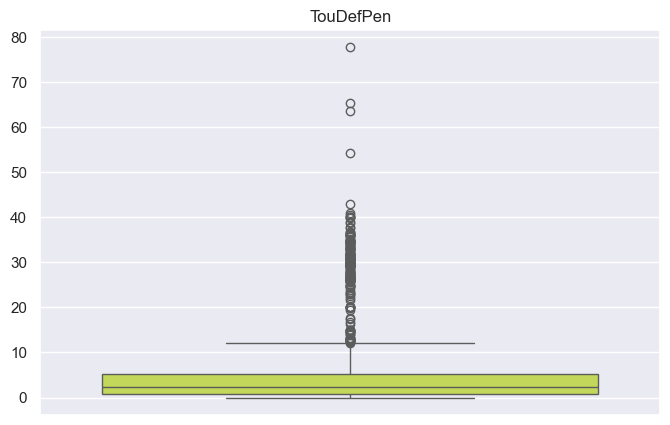

The meadian is:  13.7


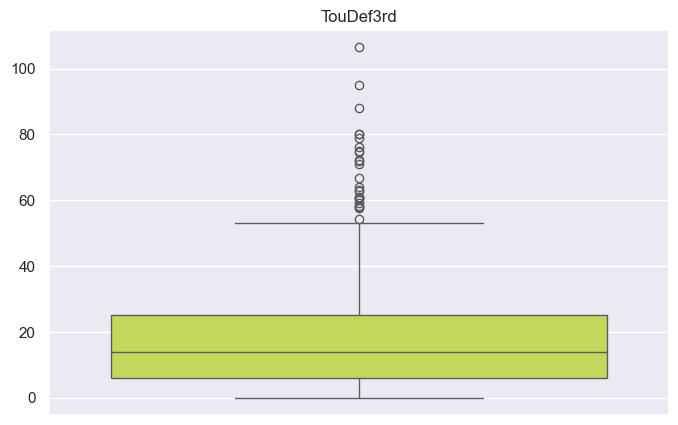

The meadian is:  24.6


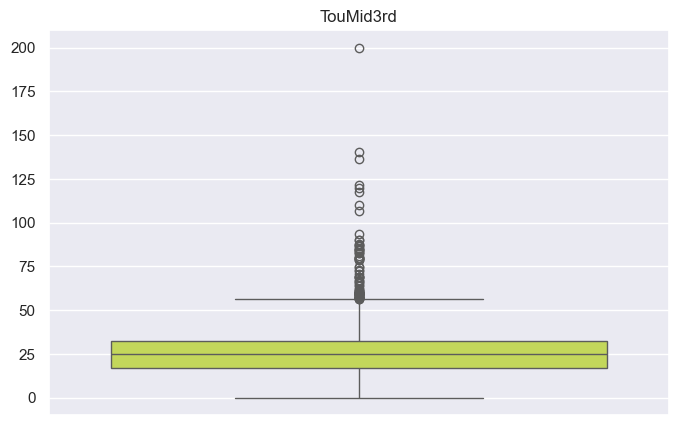

The meadian is:  14.7


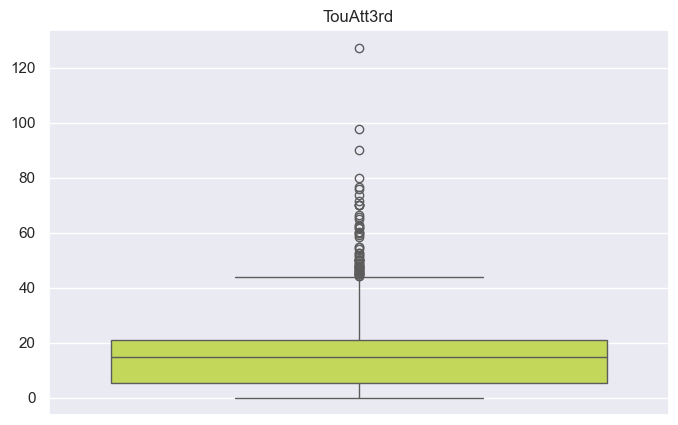

The meadian is:  1.41


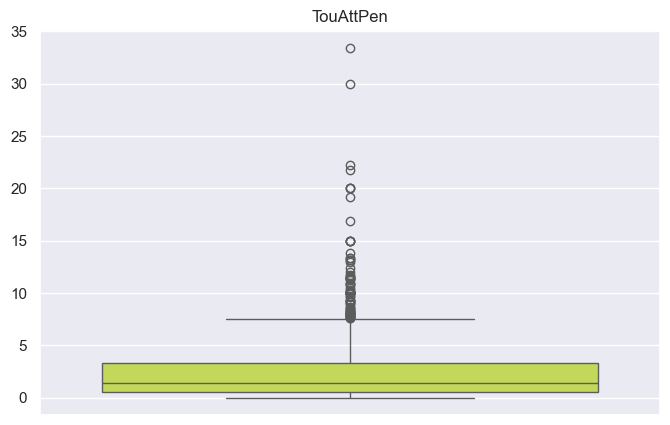

The meadian is:  54.5


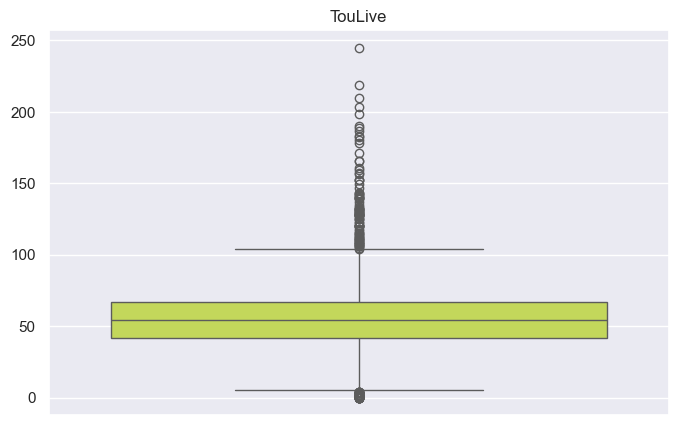

The meadian is:  1.25


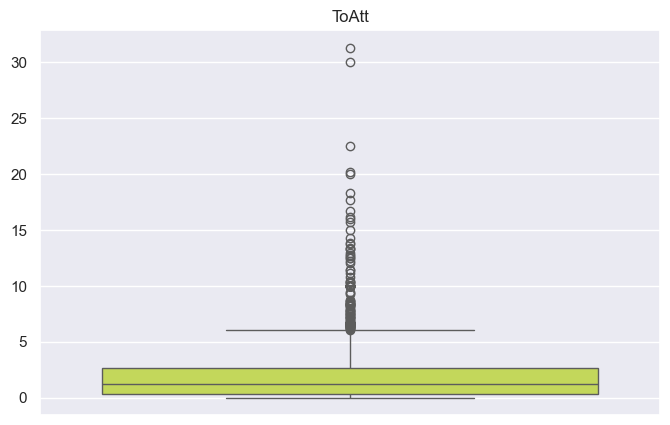

The meadian is:  0.43


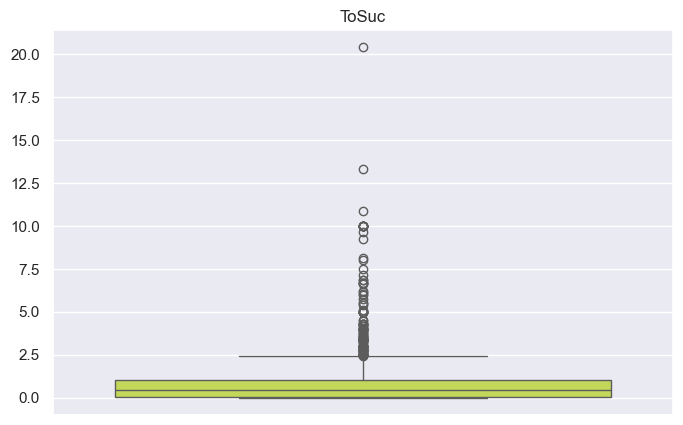

The meadian is:  34.3


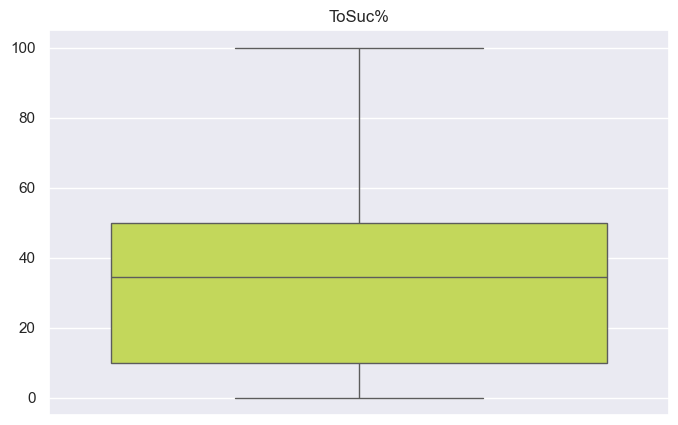

The meadian is:  0.53


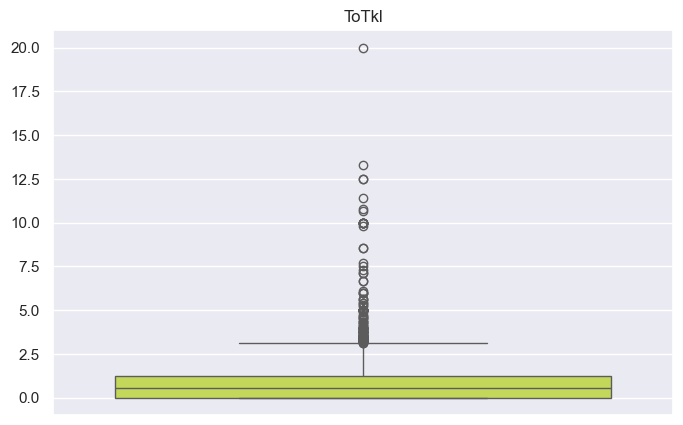

The meadian is:  41.7


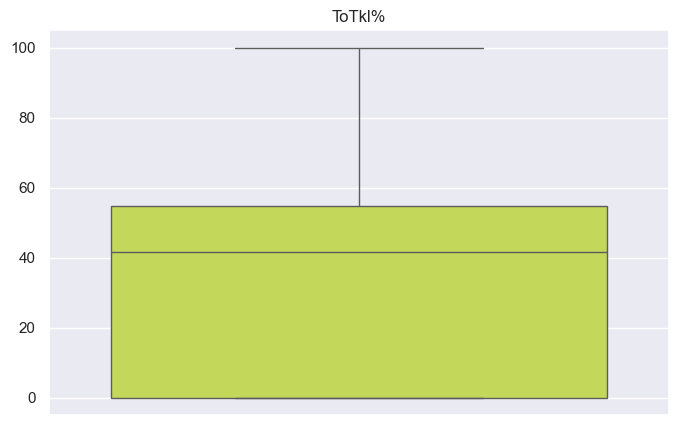

The meadian is:  30.3


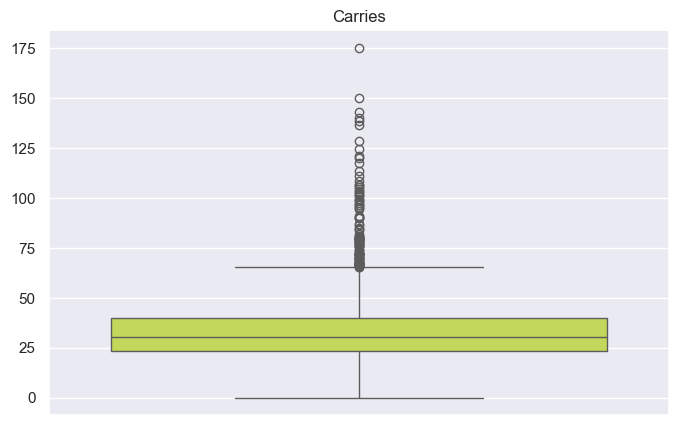

The meadian is:  160.8


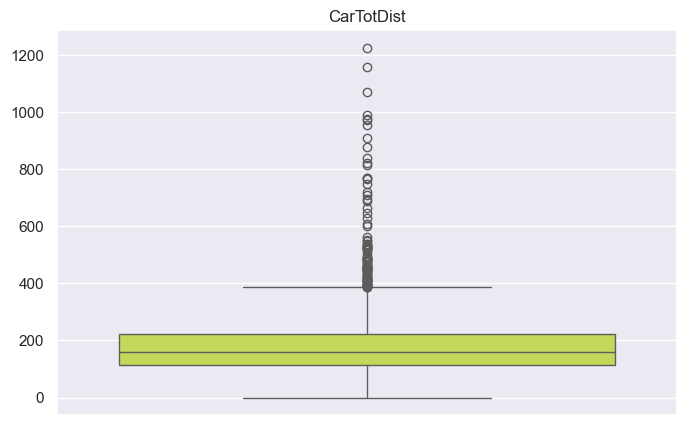

The meadian is:  76.5


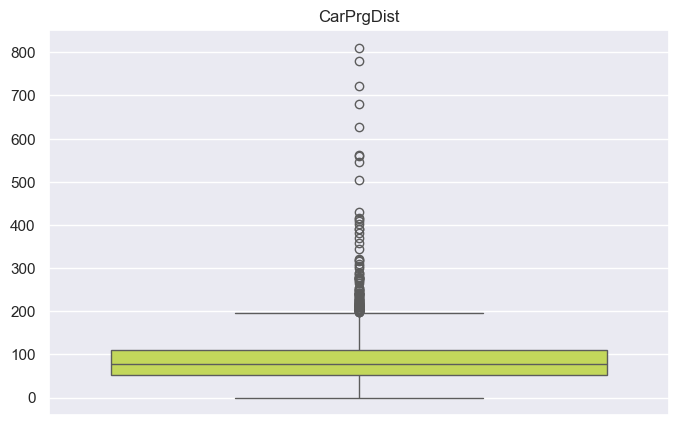

The meadian is:  1.25


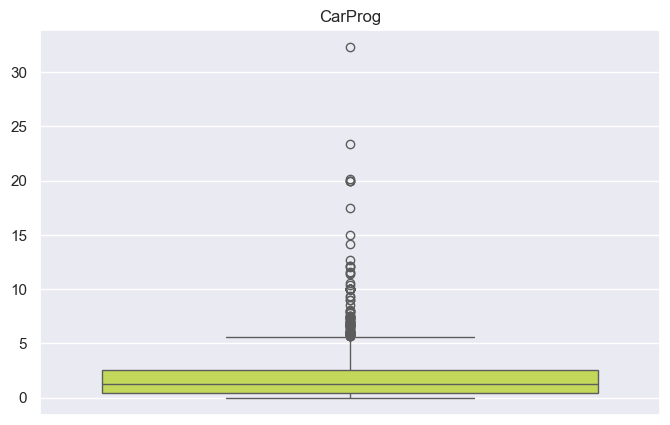

The meadian is:  1.03


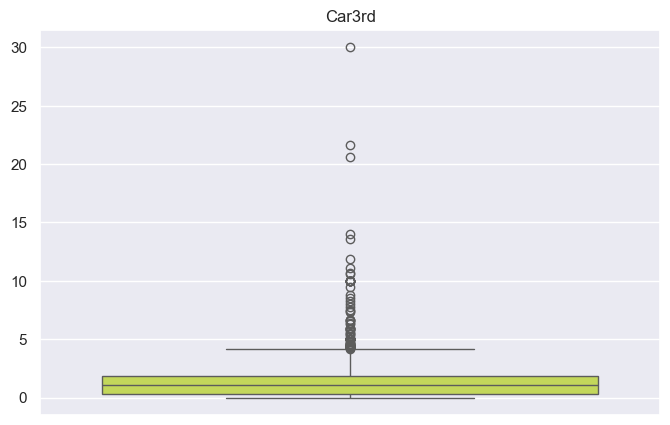

The meadian is:  0.12


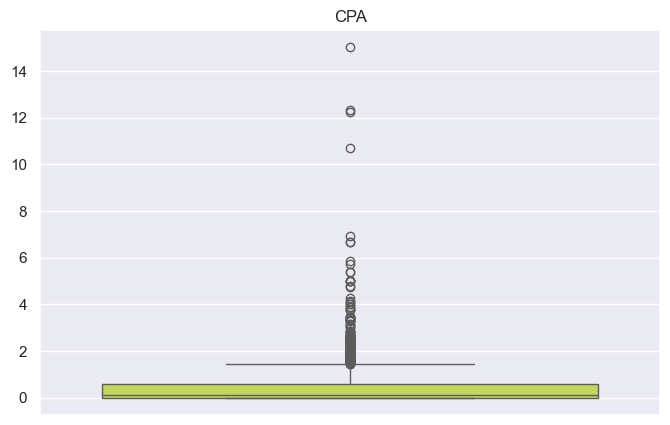

The meadian is:  1.28


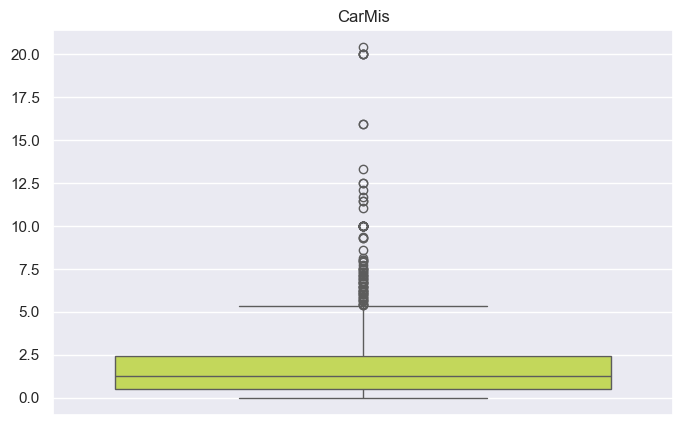

The meadian is:  0.73


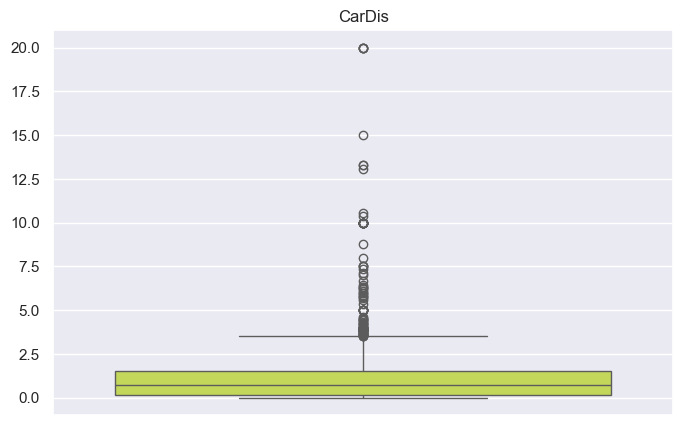

The meadian is:  33.6


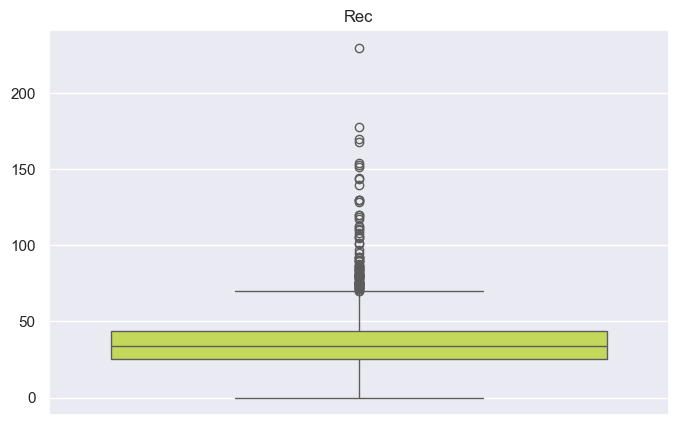

The meadian is:  3.36


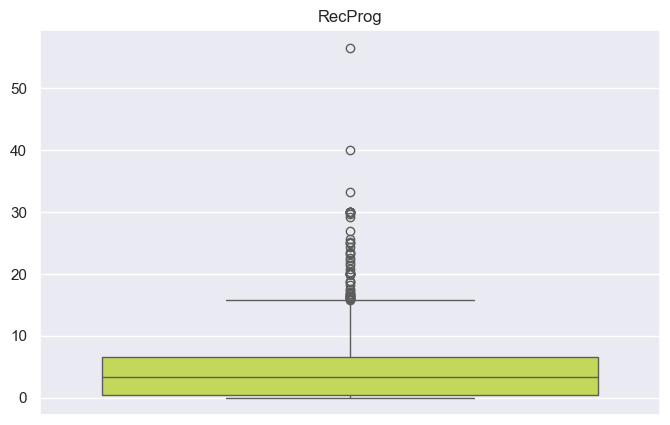

The meadian is:  0.15


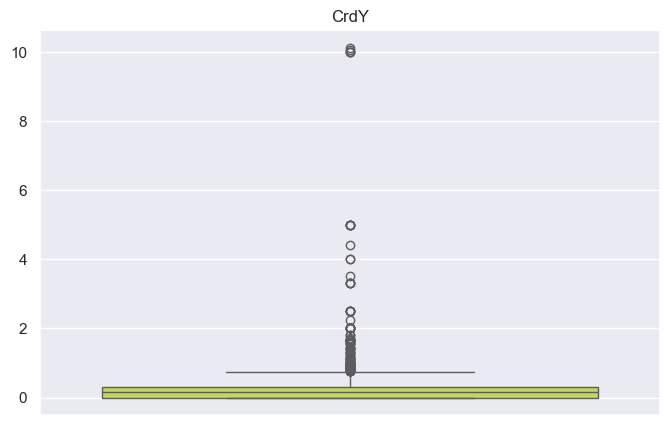

The meadian is:  0.0


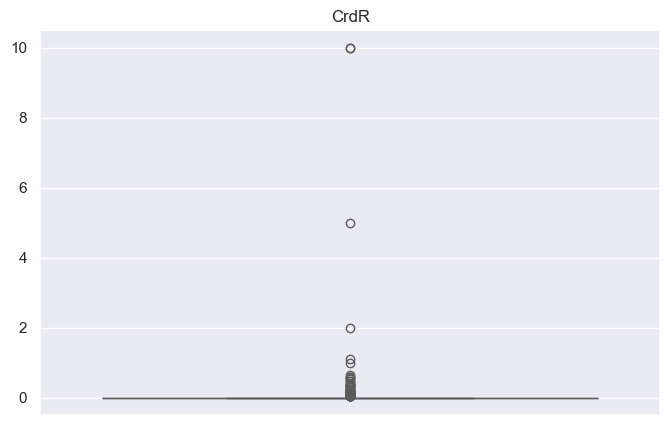

The meadian is:  0.0


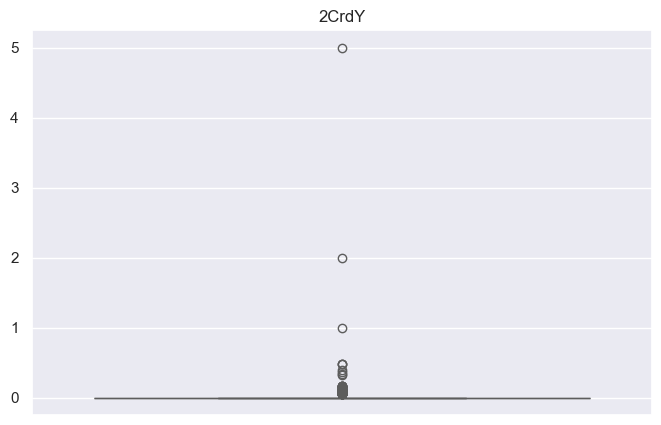

The meadian is:  1.14


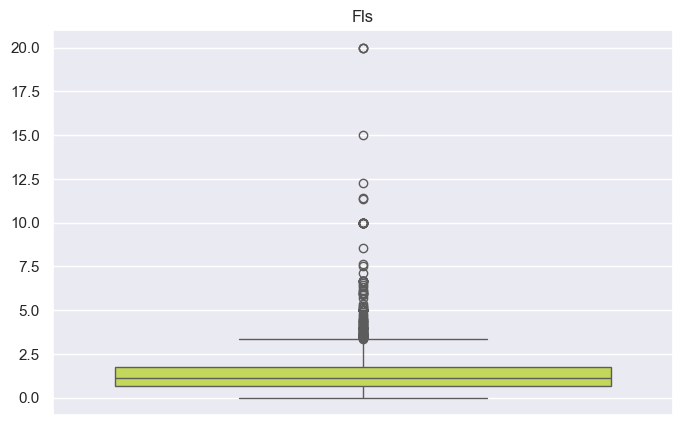

The meadian is:  0.95


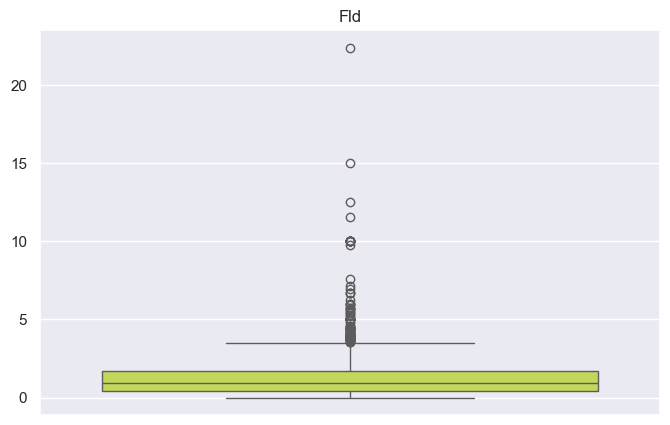

The meadian is:  0.0


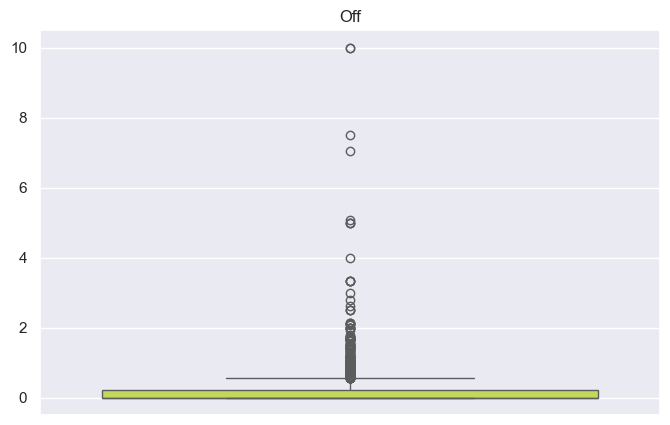

The meadian is:  0.83


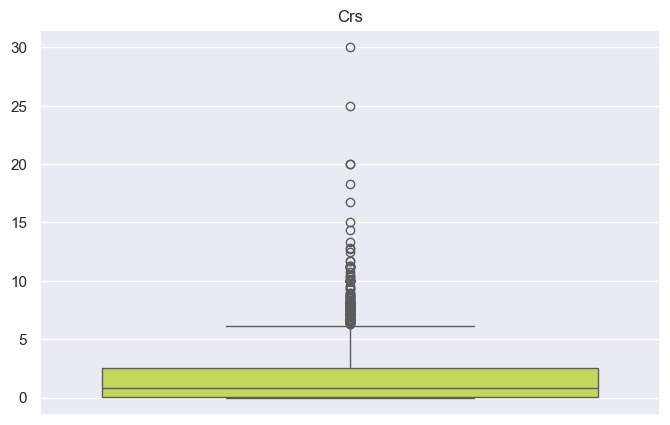

The meadian is:  0.86


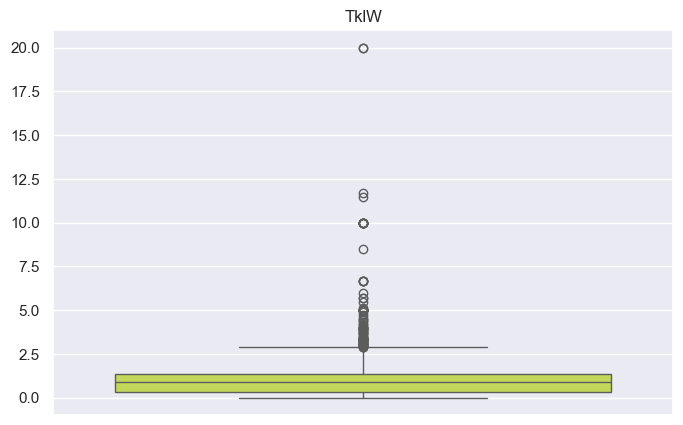

The meadian is:  0.0


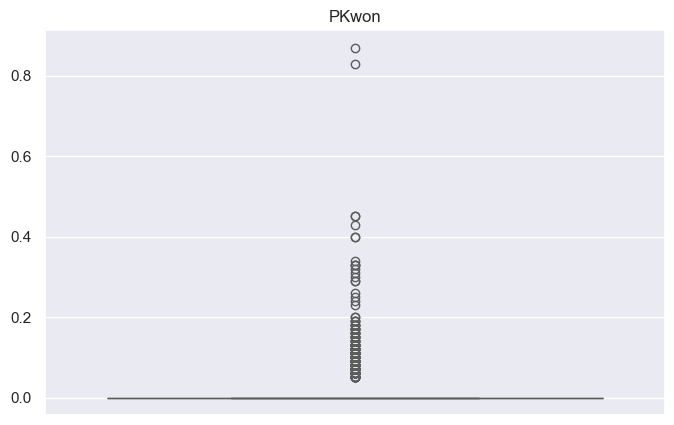

The meadian is:  0.0


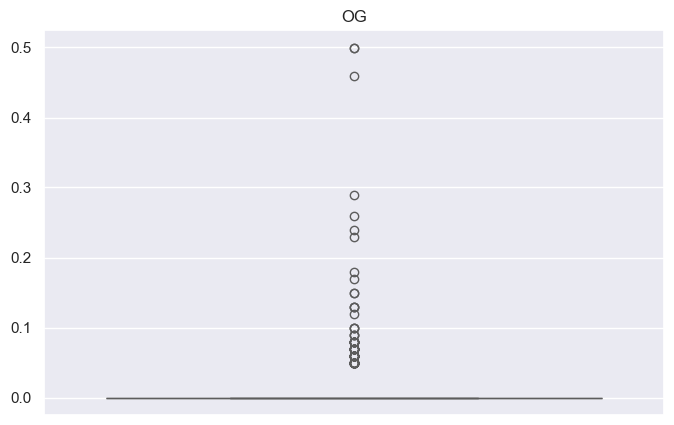

The meadian is:  5.0


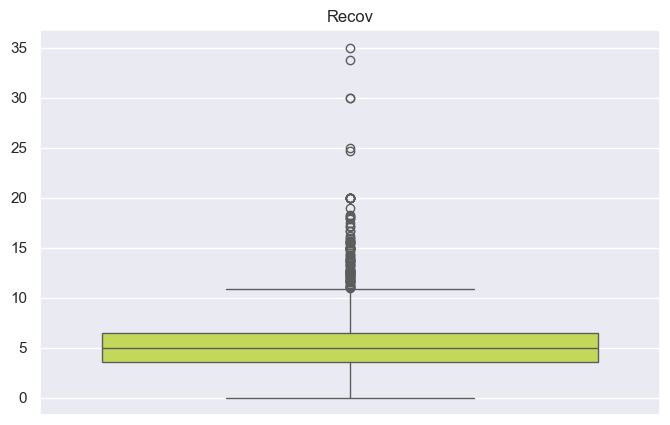

The meadian is:  0.98


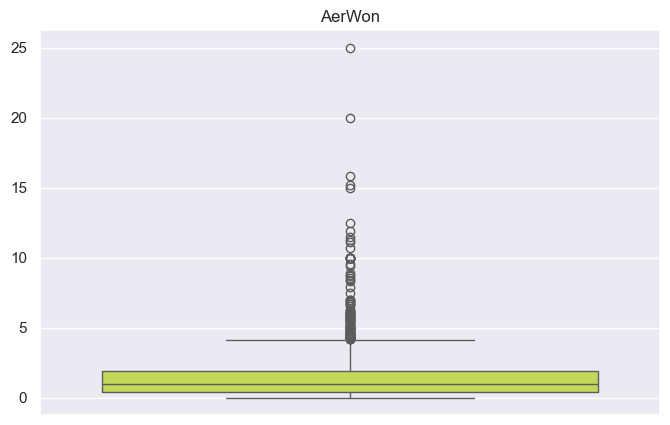

The meadian is:  1.13


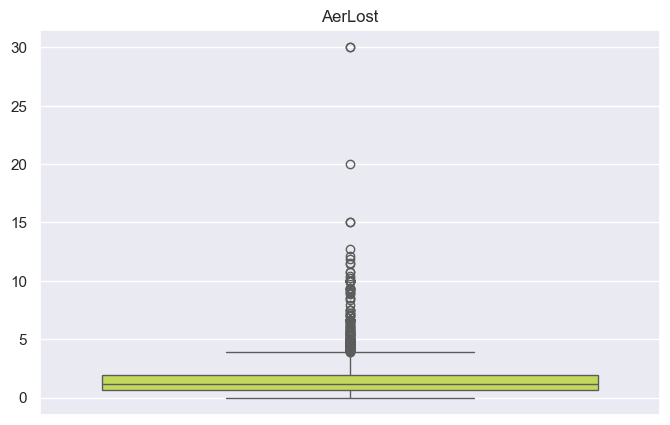

The meadian is:  4000000.0


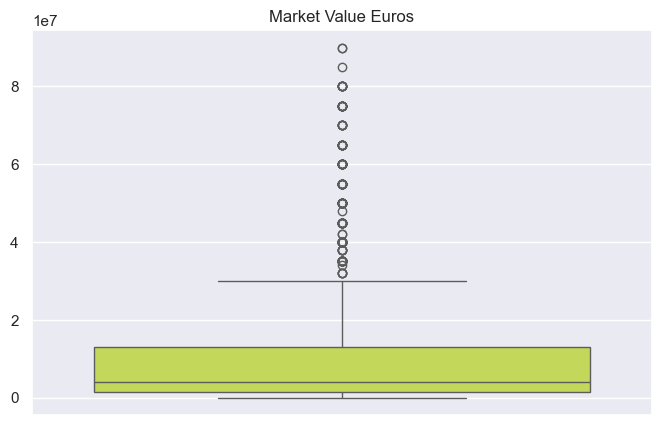

In [144]:
# Investigating the distribution of all Numerical values

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(8,5)})

for c in n_variables:    
    x = player_agg[c].values
    ax = sns.boxplot(x, color = '#D1EC46')
    print('The meadian is: ', player_agg[c].median())
    plt.title(c)
    plt.show()

# 4.4. Preparing the final DF

In [145]:
player_agg.head()

,Player,Nation,Pos,Squad,Comp,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value,Market Value Euros
0,?ukasz Fabia?ski,POL,GK,West Ham,Premier League,37,22,22,1873,20.8,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.9,27.3,65.6,556.4,435.7,3.70,3.70,100.0,6.68,6.73,99.3,7.40,16.60,44.6,0.00,0.00,0.38,0.00,0.00,0.00,27.3,18.1,9.04,2.45,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,17.9,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.19,0.00,29.3,25.80,29.2,0.10,0.0,0.00,29.3,0.00,0.00,0.0,0.00,0.0,15.4,101.5,68.5,0.00,0.00,0.00,0.05,0.00,10.8,0.00,0.00,0.0,0.0,0.00,0.14,0.00,0.00,0.00,0.0,0.0,0.48,0.48,0.05,€700k,700000.0
1,?ukasz Por?ba,POL,MF,Lens,Ligue 1,22,7,3,247,2.7,0,0.00,0.0,0.0,0.0,17.1,0.00,0.0,0.0,40.0,48.5,82.4,633.0,187.0,18.10,21.50,84.5,16.30,18.90,86.3,2.96,4.44,66.7,0.37,1.85,4.44,1.85,0.74,6.67,48.5,48.1,0.37,0.37,0.00,0.00,2.22,0.00,0.00,0.00,0.00,0.00,40.0,0.00,0.37,3.33,2.96,0.00,0.0,0.0,0.00,0.37,0.74,0.37,0.0,0.0,0.0,0.0,0.37,1.85,1.48,0.74,0.37,0.74,0.74,1.11,66.7,0.37,1.11,0.00,1.11,1.11,2.96,0.74,0.00,57.8,1.11,6.3,30.70,20.7,0.37,57.8,0.74,0.37,50.0,0.37,50.0,43.0,213.7,76.3,1.11,2.96,0.00,1.85,0.37,40.7,6.67,0.37,0.0,0.0,2.96,0.74,0.00,2.22,1.48,0.0,0.0,4.07,0.74,0.37,€1.20m,1200000.0
2,?ukasz Skorupski,POL,GK,Bologna,Serie A,31,21,21,1890,21.0,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,26.4,34.2,77.1,706.6,494.6,4.90,4.95,99.0,11.60,11.80,98.4,8.62,16.10,53.6,0.00,0.00,0.00,0.00,0.00,0.00,34.2,24.0,10.10,2.86,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,26.4,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.05,0.05,0.05,0.00,0.00,0.05,0.05,100.0,0.00,0.00,0.00,0.00,0.00,0.05,0.62,0.05,36.8,33.00,36.6,0.19,0.0,0.00,36.8,0.00,0.00,0.0,0.00,0.0,19.3,99.3,67.7,0.00,0.00,0.00,0.05,0.00,15.6,0.00,0.14,0.0,0.0,0.00,0.24,0.00,0.00,0.05,0.0,0.0,1.14,0.19,0.00,€3.50m,3500000.0
3,?órir Jóhann Helgason,ISL,MF,Lecce,Serie A,22,7,2,154,1.7,0,0.00,0.0,0.0,0.0,32.3,0.59,0.0,0.0,20.6,28.2,72.9,381.2,164.7,8.24,11.20,73.7,8.24,9.41,87.5,3.53,6.47,54.5,0.00,1.76,0.59,0.00,0.00,1.18,28.2,23.5,4.71,0.59,0.00,0.00,5.29,0.00,3.53,2.94,0.59,0.00,20.6,0.00,0.00,2.35,1.18,1.18,0.0,0.0,0.00,0.00,0.59,0.59,0.0,0.0,0.0,0.0,0.00,0.59,0.59,0.00,0.00,0.59,0.59,0.59,100.0,0.00,0.59,0.00,0.59,1.18,1.76,1.18,0.00,35.9,2.35,10.0,13.50,13.5,0.00,35.9,0.00,0.00,0.0,0.00,0.0,15.3,58.8,25.3,0.59,1.18,0.00,1.76,0.59,16.5,0.00,0.00,0.0,0.0,1.18,0.59,0.00,5.29,0.59,0.0,0.0,4.71,0.00,1.76,€1.00m,1000000.0
4,Aaron Cresswell,ENG,DF,West Ham,Premier League,33,18,17,1533,17.0,0,0.06,14.3,0.0,0.0,22.8,0.18,0.0,0.0,50.8,63.9,79.6,819.1,377.8,28.60,30.50,93.8,17.40,21.70,80.2,4.24,8.47,50.0,0.00,1.76,4.41,1.41,0.76,6.94,63.9,51.6,12.20,1.76,0.06,0.24,5.94,8.24,2.18,0.12,1.71,0.06,50.8,0.12,1.47,3.12,2.06,1.00,0.0,0.0,0.06,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.82,0.41,0.47,0.35,0.00,0.35,0.94,37.5,0.59,1.00,0.47,0.53,1.18,2.00,2.35,0.00,70.8,3.71,21.8,30.40,18.9,0.47,70.8,0.35,0.12,33.3,0.18,50.0,33.5,151.6,74.4,1.59,1.24,0.06,0.24,0.35,43.3,4.06,0.12,0.0,0.0,0.47,0.29,0.06,5.94,0.41,0.0,0.0,4.71,1.41,1.18,€900k,900000.0


In [146]:
player_agg.head()

,Player,Nation,Pos,Squad,Comp,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value,Market Value Euros
0,?ukasz Fabia?ski,POL,GK,West Ham,Premier League,37,22,22,1873,20.8,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.9,27.3,65.6,556.4,435.7,3.70,3.70,100.0,6.68,6.73,99.3,7.40,16.60,44.6,0.00,0.00,0.38,0.00,0.00,0.00,27.3,18.1,9.04,2.45,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,17.9,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.19,0.00,29.3,25.80,29.2,0.10,0.0,0.00,29.3,0.00,0.00,0.0,0.00,0.0,15.4,101.5,68.5,0.00,0.00,0.00,0.05,0.00,10.8,0.00,0.00,0.0,0.0,0.00,0.14,0.00,0.00,0.00,0.0,0.0,0.48,0.48,0.05,€700k,700000.0
1,?ukasz Por?ba,POL,MF,Lens,Ligue 1,22,7,3,247,2.7,0,0.00,0.0,0.0,0.0,17.1,0.00,0.0,0.0,40.0,48.5,82.4,633.0,187.0,18.10,21.50,84.5,16.30,18.90,86.3,2.96,4.44,66.7,0.37,1.85,4.44,1.85,0.74,6.67,48.5,48.1,0.37,0.37,0.00,0.00,2.22,0.00,0.00,0.00,0.00,0.00,40.0,0.00,0.37,3.33,2.96,0.00,0.0,0.0,0.00,0.37,0.74,0.37,0.0,0.0,0.0,0.0,0.37,1.85,1.48,0.74,0.37,0.74,0.74,1.11,66.7,0.37,1.11,0.00,1.11,1.11,2.96,0.74,0.00,57.8,1.11,6.3,30.70,20.7,0.37,57.8,0.74,0.37,50.0,0.37,50.0,43.0,213.7,76.3,1.11,2.96,0.00,1.85,0.37,40.7,6.67,0.37,0.0,0.0,2.96,0.74,0.00,2.22,1.48,0.0,0.0,4.07,0.74,0.37,€1.20m,1200000.0
2,?ukasz Skorupski,POL,GK,Bologna,Serie A,31,21,21,1890,21.0,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,26.4,34.2,77.1,706.6,494.6,4.90,4.95,99.0,11.60,11.80,98.4,8.62,16.10,53.6,0.00,0.00,0.00,0.00,0.00,0.00,34.2,24.0,10.10,2.86,0.00,0.14,0.00,0.00,0.00,0.00,0.00,0.00,26.4,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.05,0.05,0.05,0.00,0.00,0.05,0.05,100.0,0.00,0.00,0.00,0.00,0.00,0.05,0.62,0.05,36.8,33.00,36.6,0.19,0.0,0.00,36.8,0.00,0.00,0.0,0.00,0.0,19.3,99.3,67.7,0.00,0.00,0.00,0.05,0.00,15.6,0.00,0.14,0.0,0.0,0.00,0.24,0.00,0.00,0.05,0.0,0.0,1.14,0.19,0.00,€3.50m,3500000.0
3,?órir Jóhann Helgason,ISL,MF,Lecce,Serie A,22,7,2,154,1.7,0,0.00,0.0,0.0,0.0,32.3,0.59,0.0,0.0,20.6,28.2,72.9,381.2,164.7,8.24,11.20,73.7,8.24,9.41,87.5,3.53,6.47,54.5,0.00,1.76,0.59,0.00,0.00,1.18,28.2,23.5,4.71,0.59,0.00,0.00,5.29,0.00,3.53,2.94,0.59,0.00,20.6,0.00,0.00,2.35,1.18,1.18,0.0,0.0,0.00,0.00,0.59,0.59,0.0,0.0,0.0,0.0,0.00,0.59,0.59,0.00,0.00,0.59,0.59,0.59,100.0,0.00,0.59,0.00,0.59,1.18,1.76,1.18,0.00,35.9,2.35,10.0,13.50,13.5,0.00,35.9,0.00,0.00,0.0,0.00,0.0,15.3,58.8,25.3,0.59,1.18,0.00,1.76,0.59,16.5,0.00,0.00,0.0,0.0,1.18,0.59,0.00,5.29,0.59,0.0,0.0,4.71,0.00,1.76,€1.00m,1000000.0
4,Aaron Cresswell,ENG,DF,West Ham,Premier League,33,18,17,1533,17.0,0,0.06,14.3,0.0,0.0,22.8,0.18,0.0,0.0,50.8,63.9,79.6,819.1,377.8,28.60,30.50,93.8,17.40,21.70,80.2,4.24,8.47,50.0,0.00,1.76,4.41,1.41,0.76,6.94,63.9,51.6,12.20,1.76,0.06,0.24,5.94,8.24,2.18,0.12,1.71,0.06,50.8,0.12,1.47,3.12,2.06,1.00,0.0,0.0,0.06,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.82,0.41,0.47,0.35,0.00,0.35,0.94,37.5,0.59,1.00,0.47,0.53,1.18,2.00,2.35,0.00,70.8,3.71,21.8,30.40,18.9,0.47,70.8,0.35,0.12,33.3,0.18,50.0,33.5,151.6,74.4,1.59,1.24,0.06,0.24,0.35,43.3,4.06,0.12,0.0,0.0,0.47,0.29,0.06,5.94,0.41,0.0,0.0,4.71,1.41,1.18,€900k,900000.0


In [147]:
# dropping the columns we do not need
new_player_agg = player_agg.drop(['Player', 'Market Value'], axis=1)

# Making categorical variables into numeric representation
new_player_agg = pd.get_dummies(new_player_agg, columns = ['Nation','Pos','Squad', 'Comp'])

new_player_agg.head()

,Age,MP,Starts,Min,90s,Goals,SoT,SoT%,G/Sh,G/SoT,ShoDist,ShoFK,ShoPK,PKatt,PasTotCmp,PasTotAtt,PasTotCmp%,PasTotDist,PasTotPrgDist,PasShoCmp,PasShoAtt,PasShoCmp%,PasMedCmp,PasMedAtt,PasMedCmp%,PasLonCmp,PasLonAtt,PasLonCmp%,Assists,PasAss,Pas3rd,PPA,CrsPA,PasProg,PasAtt,PasLive,PasDead,PasFK,TB,Sw,PasCrs,TI,CK,CkIn,CkOut,CkStr,PasCmp,PasOff,PasBlocks,SCA,ScaPassLive,ScaPassDead,ScaDrib,ScaSh,ScaFld,ScaDef,GCA,GcaPassLive,GcaPassDead,GcaDrib,GcaSh,GcaFld,GcaDef,Tkl,TklWon,TklDef3rd,TklMid3rd,TklAtt3rd,TklDri,TklDriAtt,TklDri%,TklDriPast,Blocks,BlkSh,BlkPass,Int,Tkl+Int,Clr,Err,Touches,TouDefPen,TouDef3rd,TouMid3rd,TouAtt3rd,TouAttPen,TouLive,ToAtt,ToSuc,ToSuc%,ToTkl,ToTkl%,Carries,CarTotDist,CarPrgDist,CarProg,Car3rd,CPA,CarMis,CarDis,Rec,RecProg,CrdY,CrdR,2CrdY,Fls,Fld,Off,Crs,TklW,PKwon,OG,Recov,AerWon,AerLost,Market Value Euros,Nation_ALB,Nation_ALG,Nation_ANG,Nation_ARG,Nation_ARM,Nation_AUS,Nation_AUT,Nation_BDI,Nation_BEL,Nation_BEN,Nation_BFA,Nation_BIH,Nation_BRA,Nation_BUL,Nation_CAN,Nation_CGO,Nation_CHI,Nation_CIV,Nation_CMR,Nation_COD,Nation_COL,Nation_COM,Nation_CPV,Nation_CRC,Nation_CRO,Nation_CTA,Nation_CYP,Nation_CZE,Nation_DEN,Nation_DOM,Nation_ECU,Nation_EGY,Nation_ENG,Nation_EQG,Nation_ESP,Nation_FIN,Nation_FRA,Nation_GAB,Nation_GAM,Nation_GEO,Nation_GER,Nation_GHA,Nation_GLP,Nation_GNB,Nation_GRE,Nation_GRN,Nation_GUF,Nation_GUI,Nation_HAI,Nation_HON,Nation_HUN,Nation_IRL,Nation_IRN,Nation_ISL,Nation_ISR,Nation_ITA,Nation_JAM,Nation_JPN,Nation_KVX,Nation_LTU,Nation_LUX,Nation_LVA,Nation_MAD,Nation_MAR,Nation_MEX,Nation_MKD,Nation_MLI,Nation_MNE,Nation_MOZ,Nation_MTQ,Nation_NED,Nation_NGA,Nation_NIR,Nation_NOR,Nation_NZL,Nation_Other,Nation_PAR,Nation_PER,Nation_PHI,Nation_POL,Nation_POR,Nation_ROU,Nation_RSA,Nation_RUS,Nation_SCO,Nation_SEN,Nation_SLE,Nation_SRB,Nation_SUI,Nation_SUR,Nation_SVK,Nation_SVN,Nation_SWE,Nation_TOG,Nation_TUN,Nation_TUR,Nation_UKR,Nation_URU,Nation_USA,Nation_UZB,Nation_VEN,Nation_WAL,Nation_ZAM,Nation_ZIM,Pos_DF,Pos_DFFW,Pos_DFMF,Pos_FW,Pos_FWDF,Pos_FWMF,Pos_GK,Pos_MF,Pos_MFDF,Pos_MFFW,Squad_Ajaccio,Squad_Almería,Squad_Angers,Squad_Arsenal,Squad_Aston Villa,Squad_Atalanta,Squad_Athletic Club,Squad_Atlético Madrid,Squad_Augsburg,Squad_Auxerre,Squad_Barcelona,Squad_Bayern Munich,Squad_Betis,Squad_Bochum,Squad_Bologna,Squad_Bournemouth,Squad_Brentford,Squad_Brest,Squad_Brighton,Squad_Celta Vigo,Squad_Chelsea,Squad_Clermont Foot,Squad_Cremonese,Squad_Crystal Palace,Squad_Cádiz,Squad_Dortmund,Squad_Eint Frankfurt,Squad_Elche,Squad_Empoli,Squad_Espanyol,Squad_Everton,Squad_Fiorentina,Squad_Freiburg,Squad_Fulham,Squad_Getafe,Squad_Girona,Squad_Hellas Verona,Squad_Hertha BSC,Squad_Hoffenheim,Squad_Inter,Squad_Juventus,Squad_Köln,Squad_Lazio,Squad_Lecce,Squad_Leeds United,Squad_Leicester City,Squad_Lens,Squad_Leverkusen,Squad_Lille,Squad_Liverpool,Squad_Lorient,Squad_Lyon,Squad_M'Gladbach,Squad_Mainz 05,Squad_Mallorca,Squad_Manchester City,Squad_Manchester Utd,Squad_Marseille,Squad_Milan,Squad_Monaco,Squad_Montpellier,Squad_Monza,Squad_Nantes,Squad_Napoli,Squad_Newcastle Utd,Squad_Nice,Squad_Nott'ham Forest,Squad_Osasuna,Squad_Paris S-G,Squad_RB Leipzig,Squad_Rayo Vallecano,Squad_Real Madrid,Squad_Real Sociedad,Squad_Reims,Squad_Rennes,Squad_Roma,Squad_Salernitana,Squad_Sampdoria,Squad_Sassuolo,Squad_Schalke 04,Squad_Sevilla,Squad_Southampton,Squad_Spezia,Squad_Strasbourg,Squad_Stuttgart,Squad_Torino,Squad_Tottenham,Squad_Toulouse,Squad_Troyes,Squad_Udinese,Squad_Union Berlin,Squad_Valencia,Squad_Valladolid,Squad_Villarreal,Squad_Werder Bremen,Squad_West Ham,Squad_Wolfsburg,Squad_Wolves,Comp_Bundesliga,Comp_La Liga,Comp_Ligue 1,Comp_Premier League,Comp_Serie A
0,37,22,22,1873,20.8,0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.9,27.3,65.6,556.4,435.7,3.70,3.70,100.0,6.68,6.73,99.3,7.40,16.60,44.6,0.00,0.00,0.38,0.00,0.00,0.00,27.3,18.1,9.04,2.45,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00,17.9,0.14,0.00,0.10,0.00,0.10,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0

# 4.5. Correlation & Feature Importances

In [148]:
n_variables[0:25]

Index(['Age', 'MP', 'Starts', 'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh',
       'G/SoT', 'ShoDist', 'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt',
       'PasTotCmp%', 'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%'],
      dtype='object')

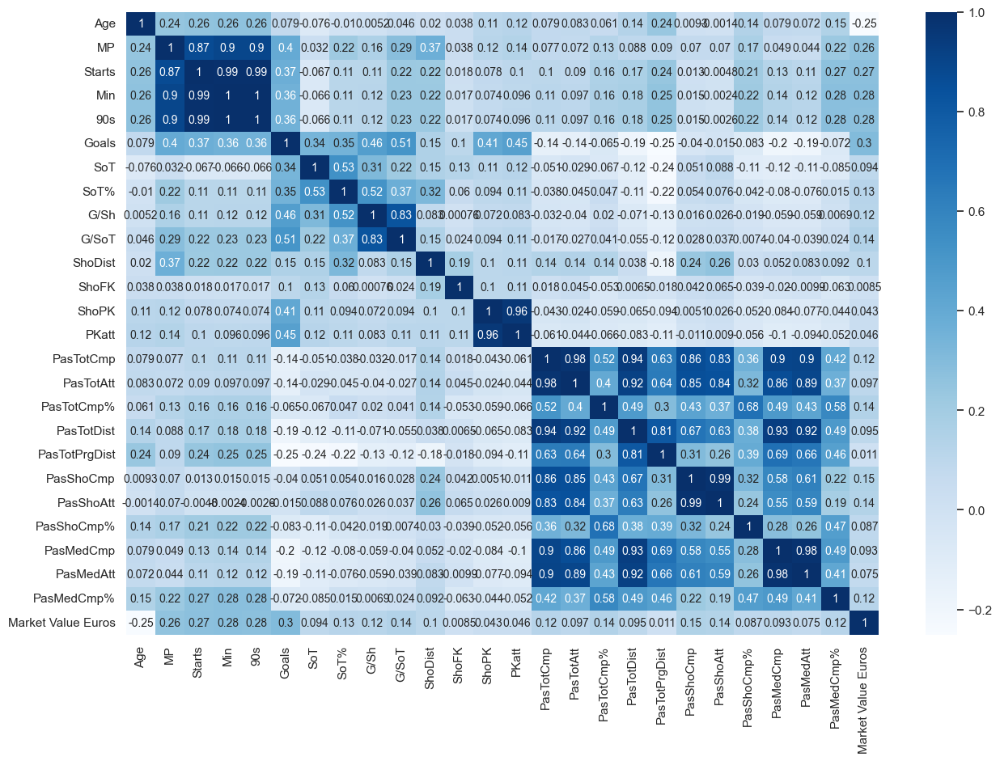

In [149]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[:25]
n_variables1 = ['Age', 'MP', 'Starts', 'Min', '90s', 'Goals', 'SoT', 'SoT%', 'G/Sh',
       'G/SoT', 'ShoDist', 'ShoFK', 'ShoPK', 'PKatt', 'PasTotCmp', 'PasTotAtt',
       'PasTotCmp%', 'PasTotDist', 'PasTotPrgDist', 'PasShoCmp', 'PasShoAtt',
       'PasShoCmp%', 'PasMedCmp', 'PasMedAtt', 'PasMedCmp%', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

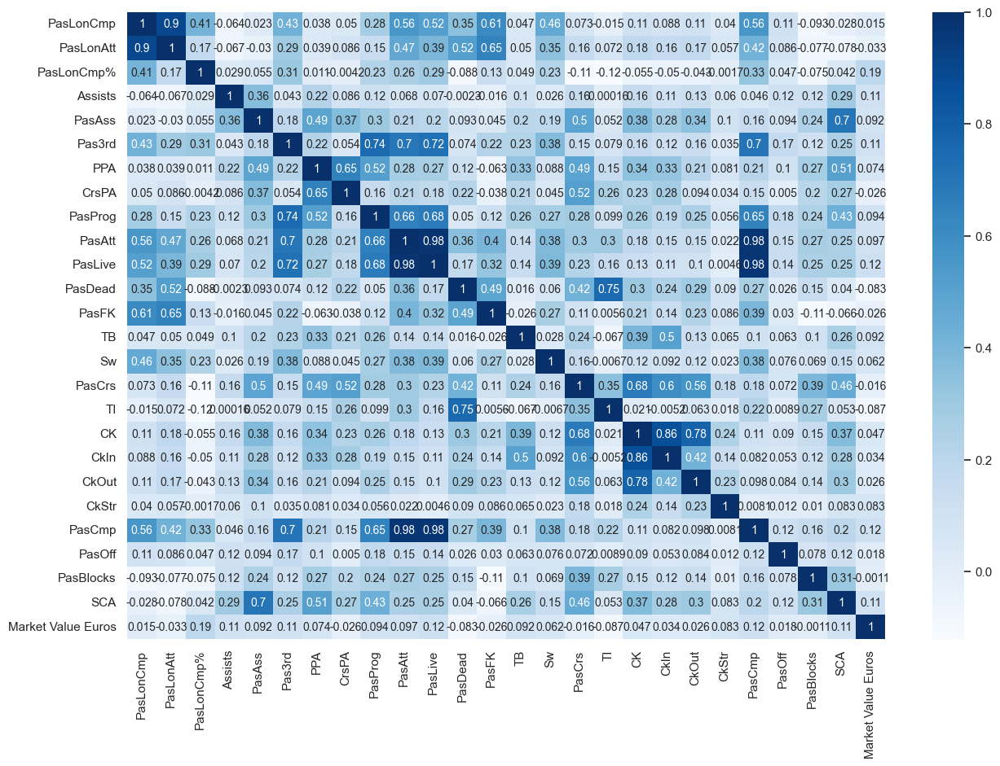

In [150]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[25:50]
n_variables1 = ['PasLonCmp', 'PasLonAtt', 'PasLonCmp%', 'Assists', 'PasAss', 'Pas3rd',
       'PPA', 'CrsPA', 'PasProg', 'PasAtt', 'PasLive', 'PasDead', 'PasFK',
       'TB', 'Sw', 'PasCrs', 'TI', 'CK', 'CkIn', 'CkOut', 'CkStr', 'PasCmp',
       'PasOff', 'PasBlocks', 'SCA', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

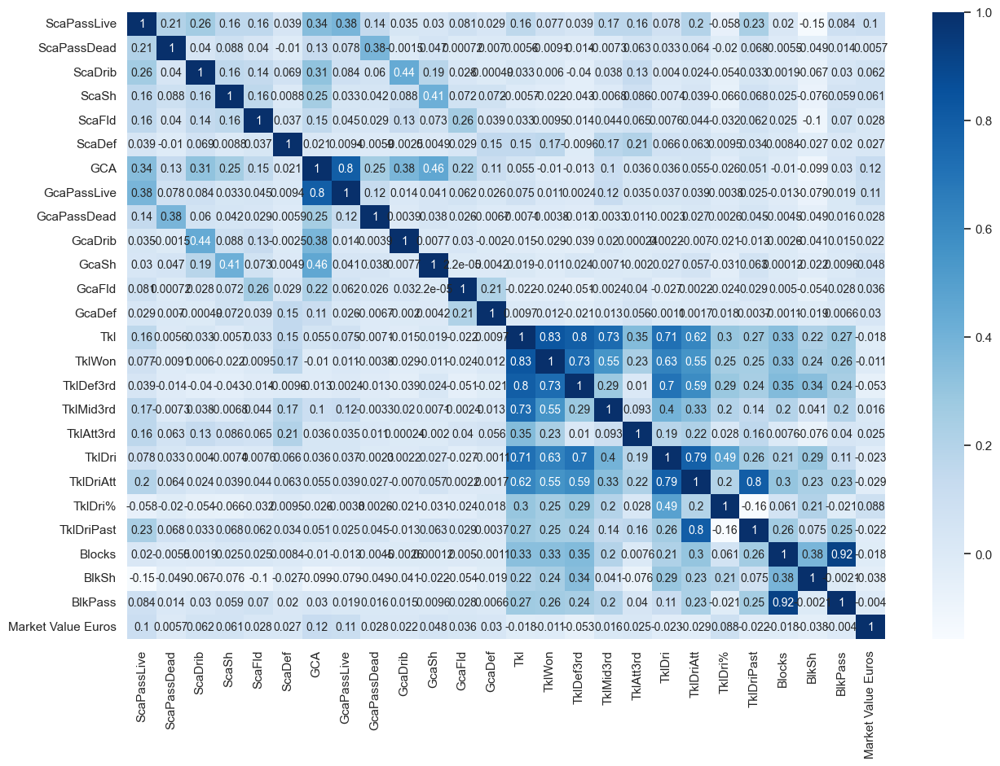

In [151]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[50:75]
n_variables1 = ['ScaPassLive', 'ScaPassDead', 'ScaDrib', 'ScaSh', 'ScaFld', 'ScaDef',
       'GCA', 'GcaPassLive', 'GcaPassDead', 'GcaDrib', 'GcaSh', 'GcaFld',
       'GcaDef', 'Tkl', 'TklWon', 'TklDef3rd', 'TklMid3rd', 'TklAtt3rd',
       'TklDri', 'TklDriAtt', 'TklDri%', 'TklDriPast', 'Blocks', 'BlkSh',
       'BlkPass', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

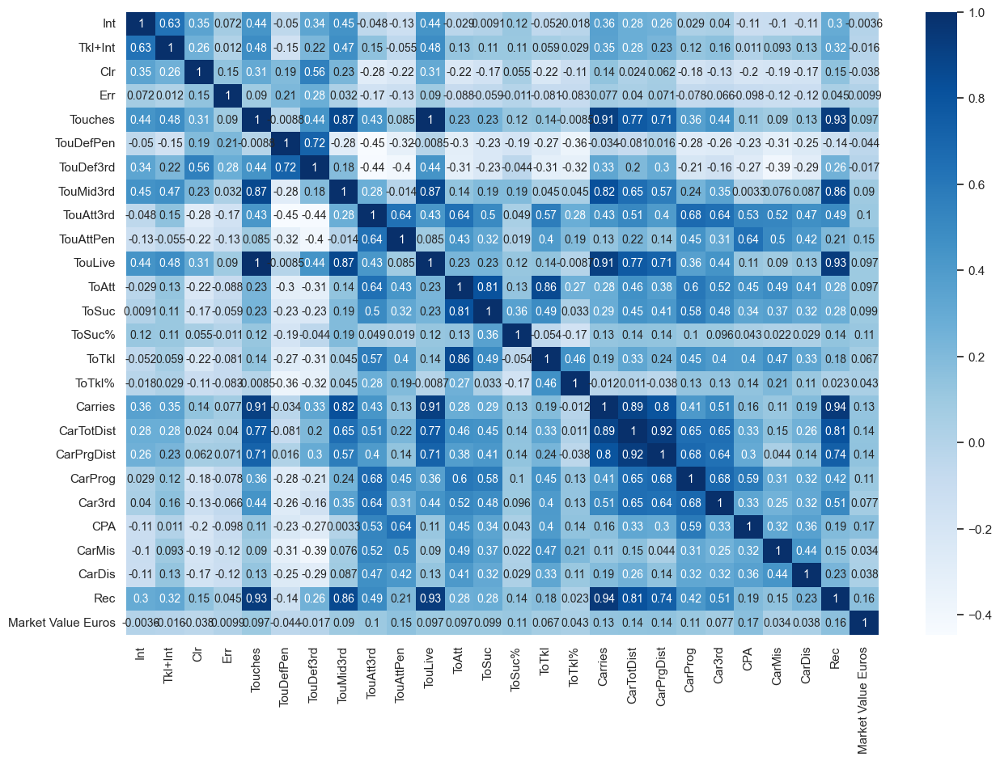

In [152]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

# n_variables[75:100]
n_variables1 = ['Int', 'Tkl+Int', 'Clr', 'Err', 'Touches', 'TouDefPen', 'TouDef3rd',
       'TouMid3rd', 'TouAtt3rd', 'TouAttPen', 'TouLive', 'ToAtt', 'ToSuc',
       'ToSuc%', 'ToTkl', 'ToTkl%', 'Carries', 'CarTotDist', 'CarPrgDist',
       'CarProg', 'Car3rd', 'CPA', 'CarMis', 'CarDis', 'Rec', 'Market Value Euros']

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

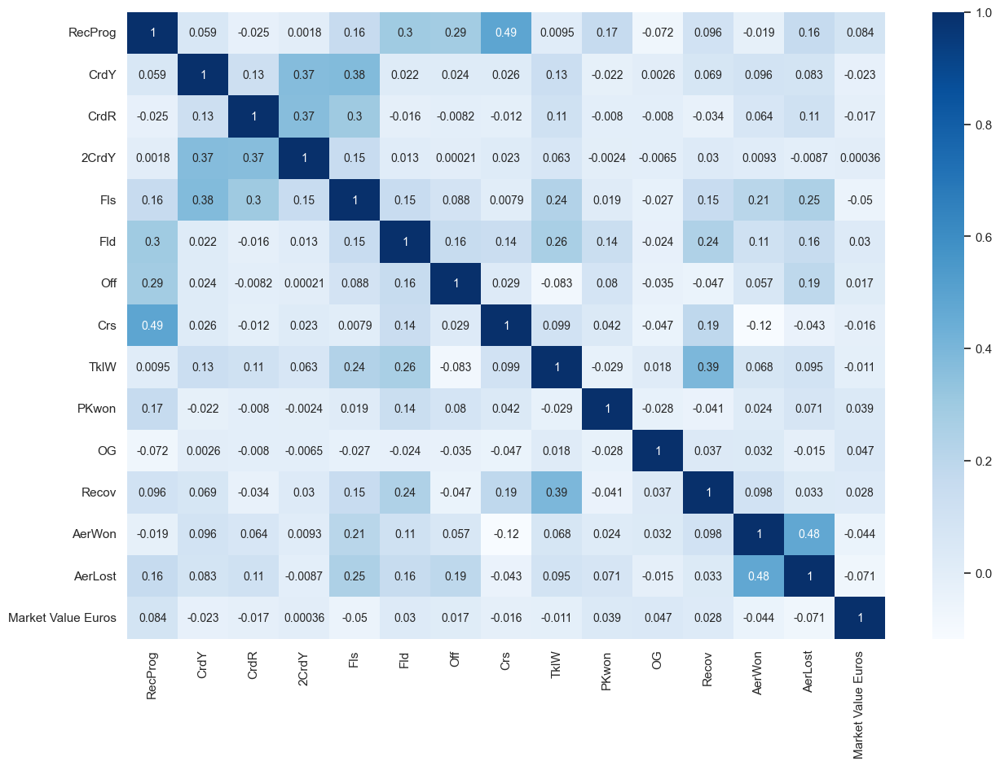

In [153]:
## Correlations with Heatmap

# Increases the size of sns plots
sns.set(rc={'figure.figsize':(15,10)})

n_variables1 = n_variables[100:]

pc = new_player_agg[n_variables1].corr(method ='pearson')

cols = n_variables1

ax = sns.heatmap(pc, annot=True,
                 yticklabels=cols,
                 xticklabels=cols,
                 annot_kws={'size':10},
                 cmap="Blues")

# Feature Importance
## Steps of Running Feature Importance

- Split the data into X & y

- Run a Tree-based estimators (i.e. decision trees & random forests)

- Run Feature Importance

- We measure the importance of a feature by calculating the increase in the model’s prediction error after permuting the feature

- More info: https://christophm.github.io/interpretable-ml-book/feature-importance.html

In [154]:
# Split the data into X & y

X = new_player_agg.drop(['Market Value Euros'], axis = 1).values
X_columns = new_player_agg.drop(['Market Value Euros'], axis = 1)
y = new_player_agg['Market Value Euros'].astype(int)

print(X.shape)
print(y.shape)

# Run a Tree-based estimators (i.e. decision trees & random forests)

dt = DecisionTreeClassifier(random_state=15, criterion  = 'entropy', max_depth = 10)
dt.fit(X,y)

print('Score', dt.score(X, y))
# If you want to learn how Decesion Trees work, read here: https://www.datacamp.com/community/tutorials/decision-tree-classification-python
# Official Doc: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html


(2325, 331)
(2325,)
Score 0.6047311827956989


In [155]:
# Calculating FI
for i, column in enumerate(new_player_agg.drop('Market Value Euros', axis=1)):
    #print('Importance of feature {}:, {:.3f}'.format(column, dt.feature_importances_[i]))
    
    fi = pd.DataFrame({'Variable': [column], 'Feature Importance Score': [dt.feature_importances_[i]]})
    
    try:
        final_fi = pd.concat([final_fi,fi], ignore_index = True)
    except:
        final_fi = fi
        
        
# Ordering the data
final_fi = final_fi.sort_values('Feature Importance Score', ascending = False).reset_index()            
final_fi.head()

,index,Variable,Feature Importance Score
0,0,Age,0.073080
1,3,Min,0.039157
2,329,Comp_Premier League,0.030932
3,16,PasTotCmp%,0.030904
4,92,CarTotDist,0.023945


# 5. Running XGBoost

In [156]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

# 3. Split Data into Train and Test Sets (Holdout Method)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Initialize XGBoost Regressor
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3)

# 5. Train the Model
xgb_model.fit(X_train, y_train)

# 6. Make Predictions
y_pred = xgb_model.predict(X_test)

# 7. Evaluate the Model
mse = mean_squared_error(y_test, y_pred)
r2_train = xgb_model.score(X_train, y_train)
r2_test = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score on Training: {r2_train}")
print(f"R^2 Score on Test: {r2_test}")

Mean Squared Error: 137167834636775.7
R^2 Score on Training: 0.7237690687179565
R^2 Score on Test: 0.47019708156585693


# 6. Hyperparameter Tuning

In [157]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import pandas as pd

# Step 1: Define the parameter grid for hyperparameter tuning
param_dist = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Step 2: Initialize the XGBRegressor
xgb_model = XGBRegressor(objective='reg:squarederror')

# Step 3: Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    scoring='neg_mean_squared_error',
    n_iter=20,  # Number of random configurations to test
    cv=5,  # 5-fold cross-validation
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Step 4: Perform RandomizedSearchCV
random_search.fit(X_train, y_train)

# Step 5: Extract the best parameters and train the model
best_params = random_search.best_params_
print("Best Parameters:", best_params)

# Step 6: Evaluate the best model on the test set
best_model = random_search.best_estimator_
y_pred_tuned = best_model.predict(X_test)
all_df_predict = best_model.predict(X)

# Calculate metrics
mse_tuned = mean_squared_error(y_test, y_pred_tuned)
r2_tuned = r2_score(y_test, y_pred_tuned)

print(f"Test Set MSE (Tuned): {mse_tuned}")
print(f"R^2 Score on Training: {best_model.score(X_train, y_train)}")
print(f"R^2 Score on Test: {r2_tuned}")

feature_impo_df = pd.DataFrame({'Variable': X_columns.columns, 'Feature Importance Score': best_model.feature_importances_})

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'subsample': 1.0, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.8}
Test Set MSE (Tuned): 126697274868778.6
R^2 Score on Training: 0.963293194770813
R^2 Score on Test: 0.5106390714645386


In [158]:
# Step 1: Filter features with 'Feature Importance Score' > 0
selected_features = feature_impo_df[feature_impo_df["Feature Importance Score"] > 0]["Variable"].unique()
print("Selected Features for Rerun:", selected_features)

# Step 2: Recreate X and y
X = new_player_agg[selected_features]  # Use only selected features
y = new_player_agg["Market Value Euros"]  # Target variable

# Step 3: Split Data into Train and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Retrain the Model
xgb_model_selected = XGBRegressor(objective='reg:squarederror', **best_params)
xgb_model_selected.fit(X_train, y_train)

# Step 5: Evaluate the Model on Train and Test Sets
y_train_pred = xgb_model_selected.predict(X_train)
y_test_pred = xgb_model_selected.predict(X_test)

# Calculate Metrics
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print Metrics
print("Training Metrics:")
print(f"Train Set MSE: {mse_train}")
print(f"Train Set R² Score: {r2_train}")

print("\nTesting Metrics:")
print(f"Test Set MSE: {mse_test}")
print(f"Test Set R² Score: {r2_test}")

Selected Features for Rerun: ['Age' 'MP' 'Starts' 'Min' '90s' 'Goals' 'SoT' 'SoT%' 'G/Sh' 'G/SoT'
 'ShoDist' 'ShoFK' 'ShoPK' 'PKatt' 'PasTotCmp' 'PasTotAtt' 'PasTotCmp%'
 'PasTotDist' 'PasTotPrgDist' 'PasShoCmp' 'PasShoAtt' 'PasShoCmp%'
 'PasMedCmp' 'PasMedAtt' 'PasMedCmp%' 'PasLonCmp' 'PasLonAtt' 'PasLonCmp%'
 'Assists' 'PasAss' 'Pas3rd' 'PPA' 'CrsPA' 'PasProg' 'PasLive' 'PasDead'
 'PasFK' 'TB' 'Sw' 'PasCrs' 'TI' 'CK' 'CkIn' 'CkOut' 'CkStr' 'PasCmp'
 'PasOff' 'PasBlocks' 'SCA' 'ScaPassLive' 'ScaPassDead' 'ScaDrib' 'ScaSh'
 'ScaFld' 'ScaDef' 'GCA' 'GcaPassLive' 'GcaPassDead' 'GcaDrib' 'GcaSh'
 'GcaFld' 'GcaDef' 'Tkl' 'TklWon' 'TklDef3rd' 'TklMid3rd' 'TklAtt3rd'
 'TklDri' 'TklDriAtt' 'TklDri%' 'TklDriPast' 'Blocks' 'BlkSh' 'BlkPass'
 'Int' 'Tkl+Int' 'Clr' 'Err' 'Touches' 'TouDefPen' 'TouDef3rd' 'TouMid3rd'
 'TouAtt3rd' 'TouAttPen' 'TouLive' 'ToAtt' 'ToSuc' 'ToSuc%' 'ToTkl'
 'ToTkl%' 'Carries' 'CarTotDist' 'CarPrgDist' 'CarProg' 'Car3rd' 'CPA'
 'CarMis' 'CarDis' 'Rec' 'RecProg' 'CrdY' 'C

# Ways to Improve:

- Remove more outliers
- Run model per League or per Pos

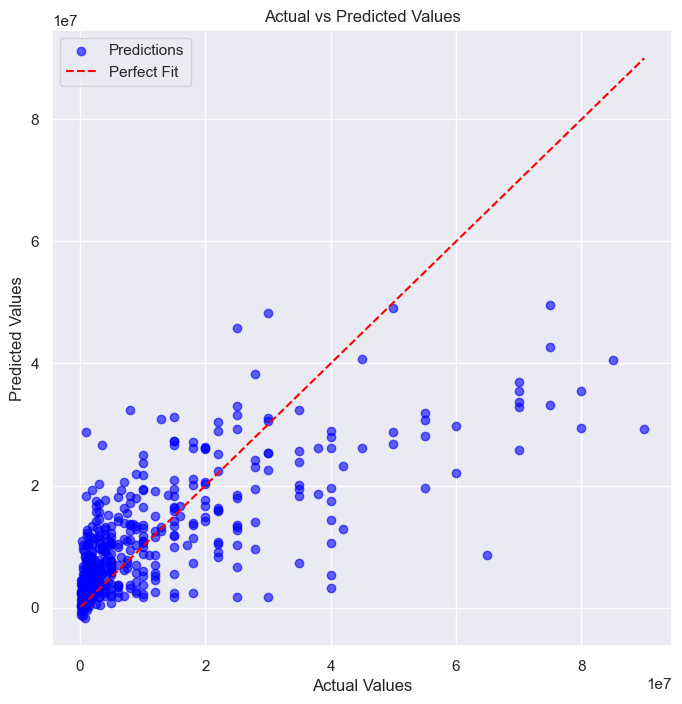

In [159]:

# Scatter plot for Actuals vs Predictions
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_pred_tuned, alpha=0.6, color='blue', label='Predictions')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Fit')  # Reference line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.legend()
plt.grid(True)
plt.show()

# 7. Storing Our Model & Results

In [160]:
# Save the trained model to a file
model_filename = "xgb_final_model.pkl"
with open(model_filename, "wb") as file:
    pickle.dump(xgb_model_selected, file)

print(f"Model saved to {model_filename}")

Model saved to xgb_final_model.pkl


In [162]:
# Storing the Feature Importances
feature_impo_df['Feature Importance Score'] = feature_impo_df['Feature Importance Score'].round(4)
feature_impo_df = final_fi.head(27)
feature_impo_df.to_excel("feature_importance.xlsx")

C:\Users\elcel\AppData\Local\Temp\ipykernel_14408\246725640.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feature_impo_df['Feature Importance Score'] = feature_impo_df['Feature Importance Score'].round(4)


In [163]:
# Adding the predicted values
player_agg['MSRP Predictions'] = all_df_predict

# Expoprting all the data with predictions
player_agg.to_excel("player_data_with_pred.xlsx")

C:\Users\elcel\AppData\Local\Temp\ipykernel_14408\2847195433.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_agg['MSRP Predictions'] = all_df_predict
